###### <p style="text-align: center; font-size: 24px;"><strong>Projet : Classifier automatiquement des biens de consommation</strong></p>


Mission - Etudiez la faisabilité d'un moteur de classification d'articles (par leur description)

Dans le cadre du lancement de la marketplace e-commerce "Place de marché", l’attribution manuelle des catégories aux articles par les vendeurs s’avère peu fiable et difficilement scalable. Pour améliorer l’expérience utilisateur et préparer un passage à l’échelle, l’entreprise souhaite automatiser cette tâche grâce à un moteur de classification basé sur les descriptions textuelles et les images des produits.

Ce notebook se concentre sur l’étude de faisabilité de la classification automatique à partir des descriptions textuelles des articles. L’objectif est de déterminer si les informations présentes dans le texte suffisent à regrouper efficacement les produits selon leur catégorie réelle, sans supervision.

Pour cela, nous suivrons les étapes suivantes :

- Exploration et analyse des données textuelles : compréhension de la structure, des catégories et des caractéristiques linguistiques des descriptions.

- Prétraitement et nettoyage du texte : normalisation, suppression des stopwords, lemmatisation, etc.

- Extraction de features : mise en œuvre de différentes méthodes d’encodage du texte (Bag-of-Words, TF-IDF, embeddings Word2Vec, BERT, Universal Sentence Encoder).

- Réduction de dimension et visualisation : projection des produits dans un espace 2D pour évaluer visuellement la séparabilité des catégories.

- Clustering et mesure de la qualité des regroupements : application de K-Means et évaluation quantitative (homogénéité, complétude, v-measure, ARI, silhouette) pour valider ou non la faisabilité d’une classification automatique à partir du texte.

Cette démarche s’inscrit dans une approche agile : valider rapidement le potentiel de la donnée textuelle avant d’investir dans des méthodes supervisées plus lourdes.
Les résultats obtenus permettront de conclure sur la capacité du texte à porter une classification automatique fiable des articles, et d’orienter les choix pour la suite du projet.

# Importation des librairies

In [1]:
# Bibliothèques standards
import re
import warnings
from collections import Counter

import random
import string

import numpy as np
import pandas as pd

# Affichage et visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from wordcloud import WordCloud

# Traitement du texte
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, ENGLISH_STOP_WORDS

# Embeddings (modèles de représentation)
from gensim.models import Word2Vec
import torch
from transformers import AutoTokenizer, AutoModel
import tensorflow_hub as hub

# Réduction de dimension
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Clustering & évaluation
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import (
    silhouette_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    adjusted_rand_score
)
from sklearn.preprocessing import StandardScaler

# Outils de modélisation
from sklearn.model_selection import ParameterGrid
from sklearn.pipeline import Pipeline

# Utilitaires
from tqdm import tqdm
from scipy.stats import kruskal

# Importation des données

In [2]:
# Chargement du fichier
df = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

# Afficher les premières lignes
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [3]:
print('Structure du fichier:')
print(df.shape)

print('-' * 70)

print('Informations sur les colonnes:')
df.info()

Structure du fichier:
(1050, 15)
----------------------------------------------------------------------
Informations sur les colonnes:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 1

Ce fichier contient 1 050 produits issus du site e-commerce Flipkart, chacun avec 15 colonnes décrivant différentes caractéristiques du produit. Voici une description des colonnes :

| Colonne                   | Description                                                                 |
|:--------------------------|:----------------------------------------------------------------------------|
| `uniq_id`                 | Identifiant unique du produit                                               |
| `crawl_timestamp`         | Date et heure de récupération des données (scraping)                        |
| `product_url`             | Lien vers la page du produit sur Flipkart                                  |
| `product_name`            | Nom du produit                                                              |
| `product_category_tree`   | Catégorie hiérarchique du produit (ex. : Home >> Linge >> Draps...)         |
| `pid`                     | Identifiant produit interne (product ID)                                   |
| `retail_price`            | Prix de vente initial (avant réduction)                                    |
| `discounted_price`        | Prix après réduction                                                        |
| `image`                   | Nom du fichier image du produit                                             |
| `is_FK_Advantage_product` | Produit éligible au service "Flipkart Advantage" (similaire à Amazon Prime)|
| `description`             | Courte description ou points clés du produit                               |
| `product_rating`          | Note du produit (souvent "No rating available")                             |
| `overall_rating`          | Équivalent ou doublon de `product_rating`                                   |
| `brand`                   | Marque du produit (beaucoup de valeurs manquantes)                          |
| `product_specifications`  | Spécifications techniques sous forme de texte ou de structure JSON          |

<Axes: >

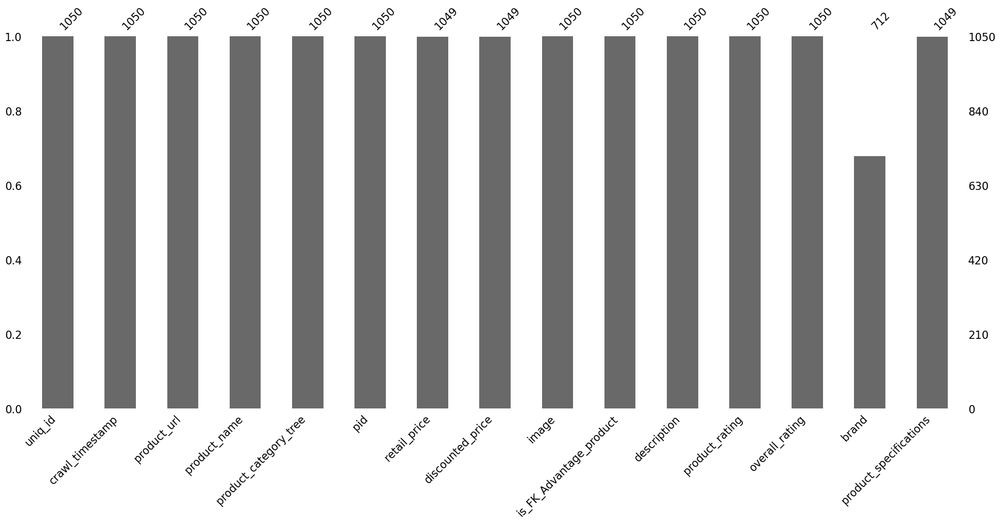

In [4]:
# Affichage d'un barplot des valeurs manquantes
msno.bar(df)

In [5]:
print(f"Nombre de doublons dans le df complet: {df.duplicated().sum()}")

Nombre de doublons dans le df complet: 0


In [6]:
print(f"Nombre de doublons dans la colonne 'description': {df.duplicated(subset="description").sum()}")

Nombre de doublons dans la colonne 'description': 0


Lors de l'analyse des données, nous avons observé que le DataFrame contient un total de 1050 lignes, avec des valeurs manquantes principalement dans les colonnes retail_price, discounted_price, et brand. La colonne brand présente un nombre particulièrement élevé de valeurs manquantes (seulement 712 valeurs non nulles). Les autres colonnes, telles que uniq_id, product_url, product_name, et description, ne contiennent aucune valeur manquante, ce qui est positif pour l'analyse.

Concernant les doublons, il n'y en a aucun dans ce jeu de données, car la méthode duplicated() renvoie un total de 0 doublons.

En résumé, bien que certaines colonnes aient des valeurs manquantes, les doublons ne sont pas présents, ce qui simplifie le nettoyage des données pour les prochaines étapes d'analyse.

# Analyse exploratoire des variables
## Variables quantitatives

In [7]:
df.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


## Variables qualitatives

In [8]:
# Afficher le nombre de valeurs uniques pour chaque colonne catégorielle
categorical_columns = df.select_dtypes(include=['object', 'bool']).columns

# Calculer le nombre de valeurs uniques pour chaque colonne catégorielle
unique_values = df[categorical_columns].nunique()

# Afficher les résultats
print(unique_values)

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64


### Analyse de la variable product_category_tree

La colonne product_category_tree contient la hiérarchie des catégories de produits dans le dataset. Chaque entrée de cette colonne est une chaîne de caractères qui représente la structure des catégories auxquelles un produit appartient. Les catégories sont séparées par l'opérateur >> et sont organisées selon un ordre hiérarchique allant de la catégorie la plus générale à la plus spécifique.

Par exemple :

Une entrée comme "Home >> Linge >> Draps" indique que le produit appartient à la catégorie "Draps", qui est un sous-ensemble de "Linge", lui-même une sous-catégorie de "Home".

Cette hiérarchisation permet de structurer les produits de manière logique, facilitant ainsi la recherche et la classification sur la plateforme de vente. Cependant, pour des analyses plus approfondies ou pour une utilisation automatisée, il peut être utile de démanteler cette hiérarchie en plusieurs niveaux, chacun représentant une catégorie spécifique du produit.

In [9]:
# On nettoie la chaîne pour retirer les crochets et guillemets
cleaned_categories = df['product_category_tree'].str.strip("[]").str.replace("'", "").str.replace('"', '')

# On compte le nombre de niveaux en comptant le nombre de séparateurs ">>" + 1
df['nb_niveaux'] = cleaned_categories.str.count('>>') + 1

# Afficher la distribution du nombre de niveaux
df['nb_niveaux'].value_counts().sort_index()

nb_niveaux
2      3
3    368
4    274
5    278
6     70
7     57
Name: count, dtype: int64

Afin de mieux comprendre la structure hiérarchique des catégories de produits, nous avons extrait le nombre de niveaux présents dans chaque entrée de la colonne product_category_tree. Chaque niveau correspond à une sous-catégorie, séparée par l’opérateur >>.

L’analyse révèle que le nombre de niveaux varie de 2 à 7 selon les produits.

Afin d’analyser plus finement la variable product_category_tree, nous allons la décomposer en plusieurs colonnes distinctes, chacune correspondant à un niveau hiérarchique de la catégorie. Cette transformation nous permettra d’étudier les catégories principales, secondaires, etc., séparément, de repérer plus facilement les tendances, et de préparer les données pour une éventuelle classification automatique.

Concrètement, une nouvelle colonne sera créée pour chaque niveau hiérarchique identifié, de la plus générale (niveau 0) à la plus spécifique (niveau N), en tenant compte du nombre maximum de niveaux observés dans le dataset.

In [10]:
# Nettoyage de la colonne pour extraire la structure hiérarchique proprement
df['categorie_propre'] = df['product_category_tree'].str.extract(r'\["(.+?)"\]')

# On sépare les catégories hiérarchiques
categories_sep = df['categorie_propre'].str.split('>>', expand=True)

# On renomme les colonnes par niveau 
categories_sep.columns = [f"niveau_categorie_{i+1}" for i in range(categories_sep.shape[1])]

# On concatène au dataframe d'origine
df = pd.concat([df, categories_sep], axis=1)

# Suppression des colonnes temporaires
df.drop(columns=['nb_niveaux', 'categorie_propre'], inplace=True, errors='ignore')

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [12]:
# Analyser le nombre de valeurs manquantes et le nombre de catégories distinctes pour chaque colonne de niveau
missing_values = df[['niveau_categorie_1', 'niveau_categorie_2', 'niveau_categorie_3', 
                     'niveau_categorie_4', 'niveau_categorie_5', 'niveau_categorie_6', 
                     'niveau_categorie_7']].isnull().sum()

distinct_categories = df[['niveau_categorie_1', 'niveau_categorie_2', 'niveau_categorie_3', 
                          'niveau_categorie_4', 'niveau_categorie_5', 'niveau_categorie_6', 
                          'niveau_categorie_7']].nunique()

print("Valeurs manquantes par colonne :")
print(missing_values)
print("\nNombre de catégories distinctes par colonne :")
print(distinct_categories)

Valeurs manquantes par colonne :
niveau_categorie_1      0
niveau_categorie_2      0
niveau_categorie_3      3
niveau_categorie_4    371
niveau_categorie_5    645
niveau_categorie_6    923
niveau_categorie_7    993
dtype: int64

Nombre de catégories distinctes par colonne :
niveau_categorie_1      7
niveau_categorie_2     63
niveau_categorie_3    246
niveau_categorie_4    350
niveau_categorie_5    297
niveau_categorie_6    117
niveau_categorie_7     57
dtype: int64


C:\Users\joan6\AppData\Local\Temp\ipykernel_184064\2778949702.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(colonnes_niveaux, rotation=45, ha='right')


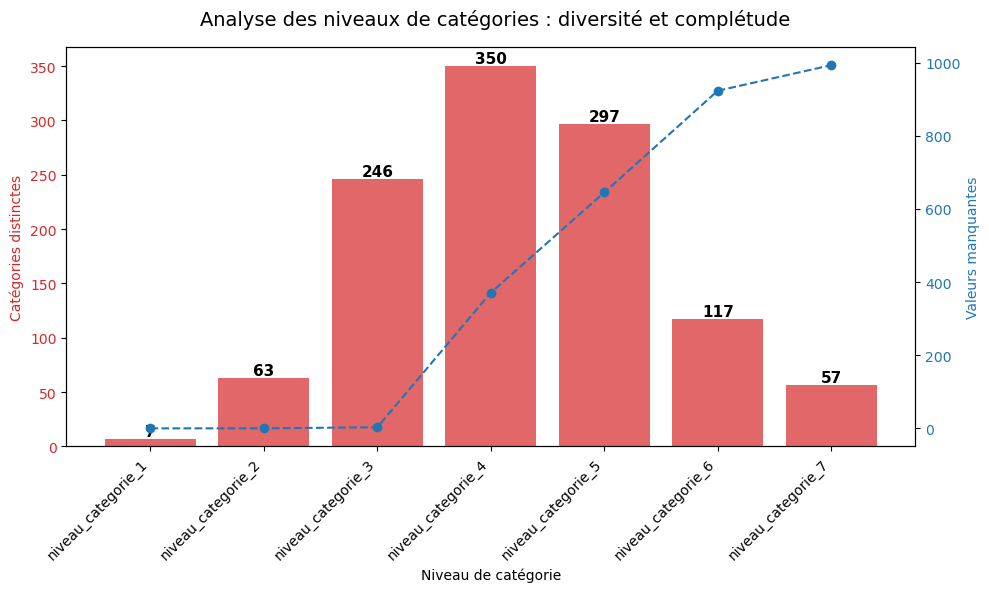

In [13]:
# Colonnes
colonnes_niveaux = ['niveau_categorie_1', 'niveau_categorie_2', 'niveau_categorie_3', 
                    'niveau_categorie_4', 'niveau_categorie_5', 'niveau_categorie_6', 
                    'niveau_categorie_7']

# Calculs
missing_values = df[colonnes_niveaux].isnull().sum()
distinct_categories = df[colonnes_niveaux].nunique()

# Création du graphique
fig, ax1 = plt.subplots(figsize=(10, 6))

# 1er axe : Nombre de catégories distinctes (barres rouges)
color = 'tab:red'
ax1.set_xlabel('Niveau de catégorie')
ax1.set_ylabel('Catégories distinctes', color=color)
bars = ax1.bar(colonnes_niveaux, distinct_categories, color=color, alpha=0.7, label='Catégories distinctes')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(colonnes_niveaux, rotation=45, ha='right')

# Ajout des valeurs au-dessus des barres
for bar, value in zip(bars, distinct_categories):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height(), str(value), 
             ha='center', va='bottom', fontsize=11, fontweight='bold', color='black')

# 2ème axe : Valeurs manquantes (ligne bleue pointillée)
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Valeurs manquantes', color=color)
ax2.plot(colonnes_niveaux, missing_values, color=color, marker='o', linestyle='--', label='Valeurs manquantes')
ax2.tick_params(axis='y', labelcolor=color)

# Titre
fig.suptitle('Analyse des niveaux de catégories : diversité et complétude', fontsize=14)
fig.tight_layout()
plt.show()

In [14]:
# Affichage des catégories uniques pour niveau_categorie_1
print("Catégories dans niveau_categorie_1 :")
print(df['niveau_categorie_1'].unique())

print("\nCatégories dans niveau_categorie_2 :")
print(df['niveau_categorie_2'].unique())

Catégories dans niveau_categorie_1 :
['Home Furnishing ' 'Baby Care ' 'Watches ' 'Home Decor & Festive Needs '
 'Kitchen & Dining ' 'Beauty and Personal Care ' 'Computers ']

Catégories dans niveau_categorie_2 :
[' Curtains & Accessories ' ' Baby Bath & Skin ' ' Bed Linen '
 ' Wrist Watches ' ' Living Room Furnishing ' ' Bath Linen '
 ' Candles & Fragrances ' ' Tableware & Cutlery ' ' Lighting '
 ' JMD Home Furnishing ' ' Infant Wear ' " Kripa's Home Furnishing "
 ' Hair Care ' ' Coffee Mugs ' ' Network Components '
 ' Tablet Accessories ' ' Cookware ' ' Laptop Accessories ' ' Makeup '
 ' Combos and Kits ' ' Feeding & Nursing ' ' Baby Bedding '
 ' Kitchen & Dining Linen ' ' Containers & Bottles '
 ' Consumables & Disposables ' ' Wall Decor & Clocks '
 ' Table Decor & Handicrafts ' ' Flowers, Plants & Vases ' ' Software '
 ' Showpieces ' ' Furniture & Furnishings '
 ' Decorative Lighting & Lamps ' ' Baby Grooming '
 ' Computer Peripherals ' ' Cushions, Pillows & Covers ' ' Storage '
 ' 

In [15]:
# Comptage des occurrences par catégorie
print("Répartition des produits par niveau_categorie_1 :")
print(df['niveau_categorie_1'].value_counts())

print("\nRépartition des produits par niveau_categorie_2 :")
print(df['niveau_categorie_2'].value_counts())

Répartition des produits par niveau_categorie_1 :
niveau_categorie_1
Home Furnishing                150
Baby Care                      150
Watches                        150
Home Decor & Festive Needs     150
Kitchen & Dining               150
Beauty and Personal Care       150
Computers                      150
Name: count, dtype: int64

Répartition des produits par niveau_categorie_2 :
niveau_categorie_2
Wrist Watches                      149
Laptop Accessories                  87
Infant Wear                         84
Coffee Mugs                         74
Showpieces                          71
                                  ... 
Candles & Fragrances                 1
Consumables & Disposables            1
JMD Home Furnishing                  1
TRUE Home Decor & Festive Needs      1
Beauty Accessories                   1
Name: count, Length: 63, dtype: int64


Colonnes les plus fiables : Les niveaux niveau_categorie_1 et niveau_categorie_2, ayant moins de valeurs manquantes et un nombre plus réduit de catégories distinctes, sont probablement les plus utiles pour débuter la classification automatique. Elles fournissent une base solide pour regrouper les produits dans des catégories générales.

niveau_categorie_1 :
- Contient exactement 7 catégories bien équilibrées (150 produits chacune).
- Idéal comme variable cible principale pour une tâche de classification supervisée.
- Pas besoin de nettoyage particulier.

niveau_categorie_2 :
- Plus granulaire, avec 63 catégories.
- Répartition très déséquilibrée (certaines classes ont un seul produit).
- Contient des doublons dus aux espaces superflus, nécessitant un nettoyage.
- Moins adapté pour être utilisé seul comme variable cible.

### Analyse de la variable product_name

Le nom du produit est une variable textuelle qui représente le titre ou le nom d'un produit dans le dataset. Cette information est cruciale pour une plateforme de vente en ligne, car elle permet aux acheteurs de comprendre rapidement de quel produit il s'agit.
Nous avons déjà constaté qu'il n'y a pas de valeurs manquantes dans cette colonne, et elle contient 1050 valeurs distinctes. 

Pour aller plus loin, nous analyserons la longueur des noms des produits afin de détecter des anomalies éventuelles (comme des noms de produits très courts ou excessivement longs). Cela nous aidera à mieux comprendre les tendances et la cohérence des données associées à cette variable.

#### Analyse de la longueur des noms des produits

Statistiques descriptives de la longueur des noms de produits :
count    1050.000000
mean       45.101905
std        17.497326
min         8.000000
25%        33.000000
50%        43.000000
75%        55.000000
max       151.000000
Name: longueur_nom_produit, dtype: float64


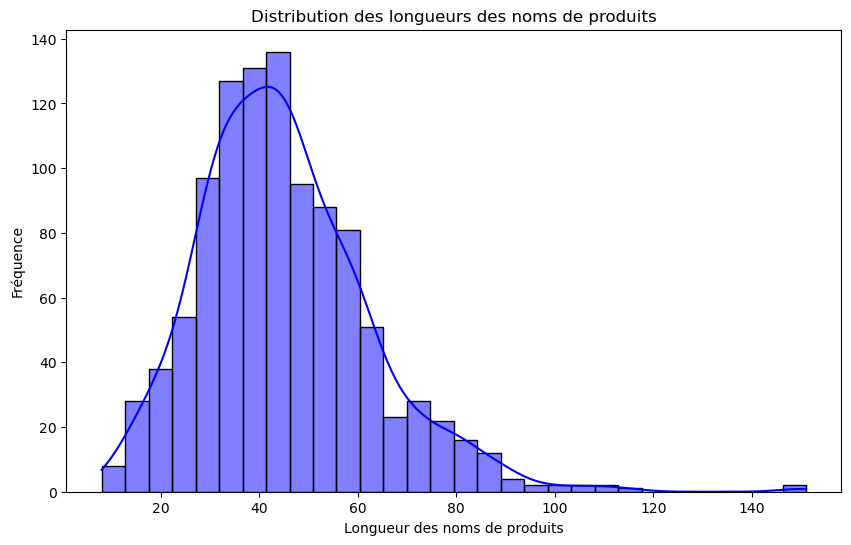

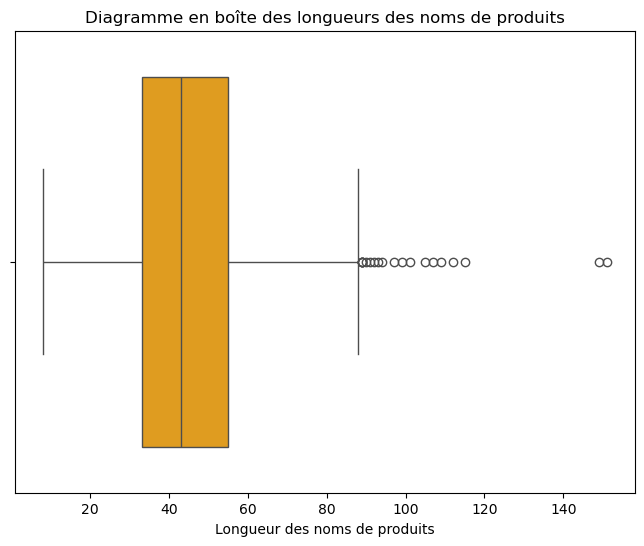

In [16]:
# Calcul de la longueur des noms de produits
df['longueur_nom_produit'] = df['product_name'].apply(len)

# Statistiques descriptives de la longueur des noms de produits
longueur_stats = df['longueur_nom_produit'].describe()

# Affichage des résultats
print("Statistiques descriptives de la longueur des noms de produits :")
print(longueur_stats)

# Histogramme de la longueur des noms de produits
plt.figure(figsize=(10, 6))
sns.histplot(df['longueur_nom_produit'], bins=30, kde=True, color='blue')
plt.title("Distribution des longueurs des noms de produits")
plt.xlabel("Longueur des noms de produits")
plt.ylabel("Fréquence")
plt.show()

# Diagramme en boîte pour visualiser les valeurs extrêmes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['longueur_nom_produit'], color='orange')
plt.title("Diagramme en boîte des longueurs des noms de produits")
plt.xlabel("Longueur des noms de produits")
plt.show()

La plupart des noms de produits sont relativement courts (moins de 55 caractères), mais il y a des valeurs extrêmes allant jusqu'à 151 caractères. Ces valeurs extrêmes pourraient nécessiter une attention particulière si elles influencent la lisibilité ou la structuration des données.

#### Analyse des mots fréquents dans le nom des produits

In [17]:
# Utilisation de CountVectorizer pour transformer les descriptions en mots
vectorizer = CountVectorizer(stop_words='english')  # On exclut les stop words en anglais
X = vectorizer.fit_transform(df['product_name'])

# Récupérer les mots les plus fréquents
frequent_words = vectorizer.get_feature_names_out()
word_counts = X.sum(axis=0).A1  # Somme des occurrences des mots

# Créer un DataFrame pour afficher les mots et leurs fréquences
word_freq_df = pd.DataFrame(list(zip(frequent_words, word_counts)), columns=['Word', 'Frequency'])
word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)

# Afficher les 10 mots les plus fréquents
print(word_freq_df.head(10))

           Word  Frequency
2218      watch        150
1868        set        135
312      analog        131
591          cm        109
1902  showpiece        105
372        baby         94
612       combo         93
548     ceramic         78
1379        men         78
1426        mug         76


Parmi les mots les plus fréquents, on retrouve :

- `watch` (150 occurrences) et `analog` (131) : indiquent une forte présence de montres dans le dataset.
- `set` (135), `combo` (93), `showpiece` (105) ou encore `ceramic` (78) : suggèrent des produits décoratifs ou de cuisine, souvent vendus par lots.
- `baby` (94) : montre une représentation notable d’articles pour bébés.
- `cm` (109) : probablement lié aux dimensions dans les noms, ce qui peut donner une indication sur la nature physique des objets.
- `men` (78) et `mug` (76) : indiquent des articles ciblant un genre spécifique et des objets du quotidien.

Ces résultats confirment que les noms des produits contiennent déjà une information utile pour catégoriser les articles, et peuvent donc être exploités efficacement pour une tâche de classification.

### Analyse de la variable description

La variable description contient une brève description textuelle des produits dans le dataset. Ce champ est crucial car il permet de donner plus de détails sur les produits, ce qui peut influencer la décision d'achat des utilisateurs. Les descriptions des produits peuvent contenir diverses informations telles que les caractéristiques techniques, les matériaux, les avantages, les spécifications, ou encore les usages recommandés. Elle ne contient pas de valeurs manquantes et 0n retrouve 1050 descriptions différentes, soit une description unique pour chacun des produits présents dans le dataset.

#### Analyse de la Longueur des Descriptions des Produits

Statistiques descriptives de la longueur des descriptions :
count    1050.000000
mean      473.820952
std       457.910422
min       109.000000
25%       192.000000
50%       278.000000
75%       588.250000
max      3490.000000
Name: longueur_description, dtype: float64


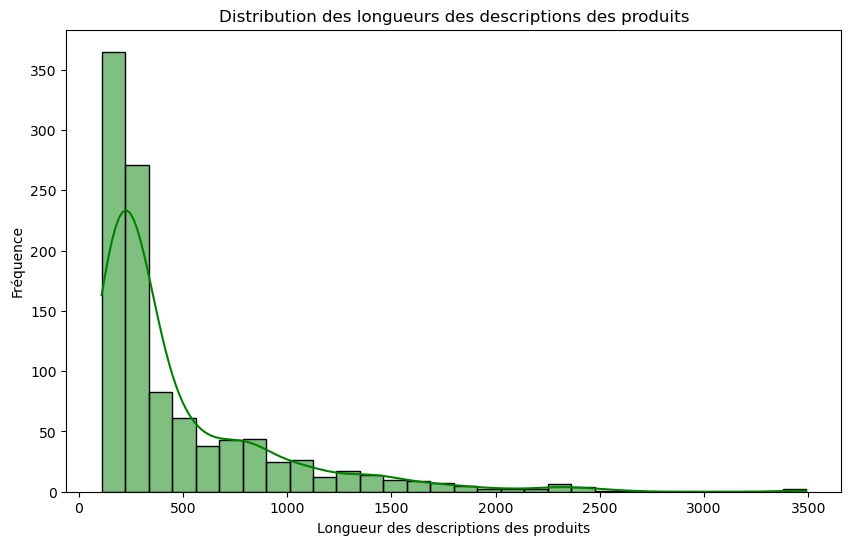

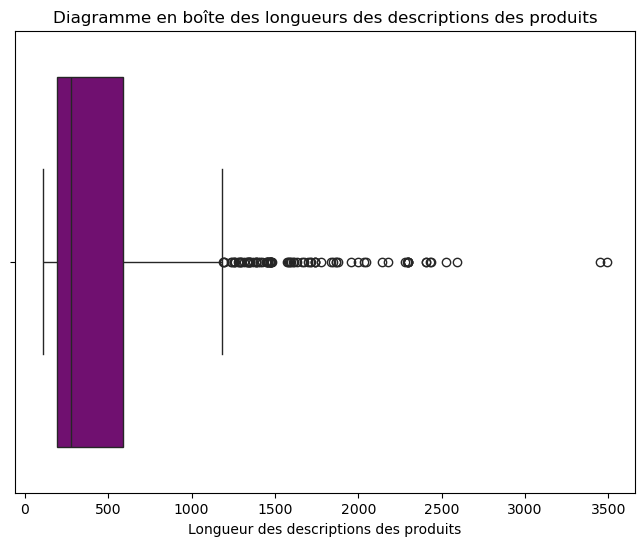

In [18]:
# Calcul de la longueur des descriptions
df['longueur_description'] = df['description'].apply(len)

# Statistiques descriptives de la longueur des descriptions
longueur_description_stats = df['longueur_description'].describe()

# Affichage des résultats
print("Statistiques descriptives de la longueur des descriptions :")
print(longueur_description_stats)

# Histogramme de la longueur des descriptions
plt.figure(figsize=(10, 6))
sns.histplot(df['longueur_description'], bins=30, kde=True, color='green')
plt.title("Distribution des longueurs des descriptions des produits")
plt.xlabel("Longueur des descriptions des produits")
plt.ylabel("Fréquence")
plt.show()

# Diagramme en boîte pour visualiser les valeurs extrêmes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['longueur_description'], color='purple')
plt.title("Diagramme en boîte des longueurs des descriptions des produits")
plt.xlabel("Longueur des descriptions des produits")
plt.show()

Les statistiques descriptives de la longueur des descriptions montrent une moyenne de 474 caractères, avec un écart-type de 458 caractères, indiquant une grande variation. La longueur minimale est de 109 caractères et la maximale de 3490 caractères. Cela suggère des différences significatives dans la longueur des descriptions des produits, certaines étant très détaillées.

#### Analyse des Mots Fréquents dans les Descriptions des Produits
Dans cette étape, nous allons analyser les mots les plus fréquemment utilisés dans les descriptions des produits. Cette analyse permet de mettre en lumière les termes récurrents qui pourraient influencer la compréhension et la catégorisation des produits. Les mots fréquents peuvent refléter des caractéristiques clés des produits, mais certains termes génériques peuvent aussi être présents, ce qui pourrait fausser l'interprétation.

Nous utiliserons la méthode CountVectorizer de la bibliothèque sklearn pour transformer les descriptions en une matrice de comptage des mots. En excluant les stop words en anglais, nous nous concentrerons sur les termes significatifs et pertinents. Cette étape nous permettra d'identifier les termes les plus récurrents et de mieux comprendre les caractéristiques communes des produits du dataset.

En analysant ces mots, nous pourrons détecter d'éventuels biais ou répétitions, et décider si un nettoyage supplémentaire est nécessaire pour améliorer la qualité des descriptions.

In [19]:
# Utilisation de CountVectorizer pour transformer les descriptions en mots
vectorizer = CountVectorizer(stop_words='english')  # On exclut les stop words en anglais
X = vectorizer.fit_transform(df['description'])

# Récupérer les mots les plus fréquents
frequent_words = vectorizer.get_feature_names_out()
word_counts = X.sum(axis=0).A1  # Somme des occurrences des mots

# Créer un DataFrame pour afficher les mots et leurs fréquences
word_freq_df = pd.DataFrame(list(zip(frequent_words, word_counts)), columns=['Word', 'Frequency'])
word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)

# Afficher les 10 mots les plus fréquents
print(word_freq_df.head(10))

             Word  Frequency
4645           rs        911
4299     products        631
2564         free        618
1383          buy        581
1969     delivery        567
2658      genuine        564
4834     shipping        564
1458         cash        564
4521  replacement        559
1611           cm        543


Mots liés à la vente et à la livraison : On observe que plusieurs mots fréquents sont directement liés à la vente, comme "buy" (acheter), "products" (produits), "delivery" (livraison), et "shipping" (expédition). Cela indique que les descriptions de produits dans le dataset mettent souvent l'accent sur des informations commerciales, comme l'achat, la livraison et l'expédition des produits.

Mots associés à des promotions ou garanties : Des termes comme "free" (gratuit), "genuine" (authentique), et "replacement" (remplacement) suggèrent que les descriptions mentionnent des offres spéciales ou des garanties sur les produits, ce qui peut attirer l'attention des consommateurs.

Unité de mesure : Le mot "cm" (centimètre) apparaît fréquemment, ce qui montre que certaines descriptions incluent des dimensions physiques des produits. Cela est typique pour des articles où les spécifications physiques sont cruciales, comme des meubles ou des appareils électroniques.

Mots transactionnels : Des termes comme "cash" (espèces) apparaissent également, ce qui suggère que les descriptions incluent des informations sur les méthodes de paiement, ce qui peut être utile pour l'achat en ligne.

Mots associés à la nature des produits : Des mots comme "genuine" et "replacement" montrent une tendance à indiquer la qualité ou la possibilité de remplacer un produit, suggérant une attention particulière portée à la confiance du consommateur et à la gestion des retours.

En résumé, ces mots fréquents indiquent que les descriptions sont orientées vers des aspects commerciaux (achat, livraison, garanties) et des détails techniques (dimensions, qualité).

## Analyse multivariée

On va regarder la relation entre la longueur des description et des nom de produits et notre cible

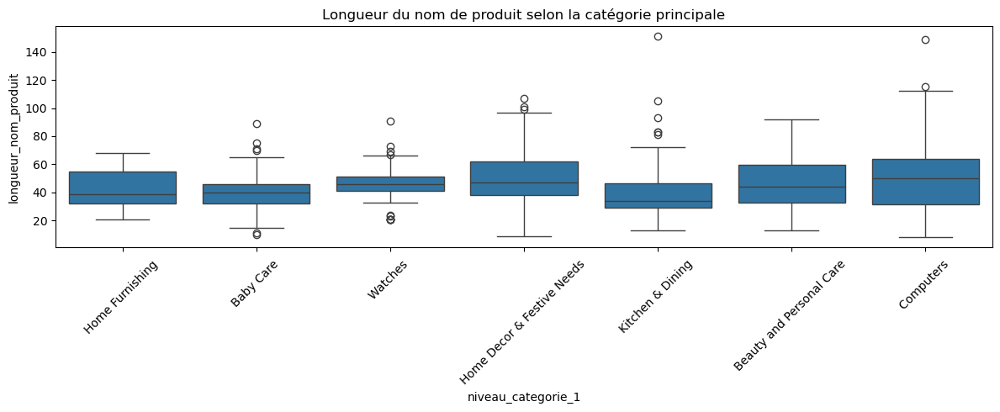

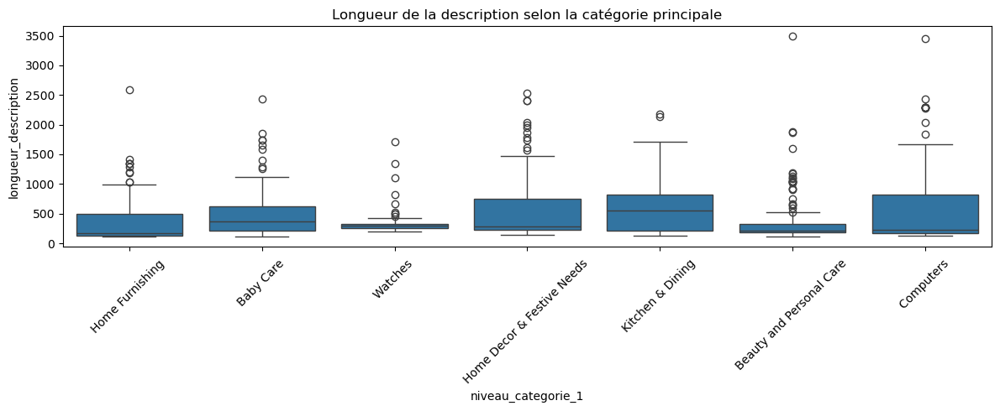

In [20]:
# Boxplots : Longueur du nom de produit par catégorie principale
plt.figure(figsize=(12, 5))
sns.boxplot(data=df, x='niveau_categorie_1', y='longueur_nom_produit')
plt.xticks(rotation=45)
plt.title('Longueur du nom de produit selon la catégorie principale')
plt.tight_layout()
plt.show()

# Boxplots : Longueur de la description par catégorie principale
plt.figure(figsize=(12, 5))
sns.boxplot(data=df, x='niveau_categorie_1', y='longueur_description')
plt.xticks(rotation=45)
plt.title('Longueur de la description selon la catégorie principale')
plt.tight_layout()
plt.show()

In [21]:
# Moyenne, médiane, écart-type, etc. pour les longueurs de nom
desc_nom = df.groupby('niveau_categorie_1')['longueur_nom_produit'].describe()

# Moyenne, médiane, écart-type, etc. pour les longueurs de description
desc_desc = df.groupby('niveau_categorie_1')['longueur_description'].describe()

# Affichage
print("Statistiques descriptives - Longueur du nom de produit")
display(desc_nom)

print("\nStatistiques descriptives - Longueur de la description")
display(desc_desc)

Statistiques descriptives - Longueur du nom de produit


,count,mean,std,min,25%,50%,75%,max
niveau_categorie_1,,,,,,,,
Baby Care,150.0,39.920000,11.688071,10.0,32.25,40.0,46.00,89.0
Beauty and Personal Care,150.0,47.146667,18.265891,13.0,33.00,44.0,59.75,92.0
Computers,150.0,49.000000,24.193571,8.0,31.25,50.0,63.75,149.0
Home Decor & Festive Needs,150.0,51.606667,18.739076,9.0,38.00,47.0,61.75,107.0
Home Furnishing,150.0,42.360000,12.914941,21.0,32.00,39.0,54.75,68.0
Kitchen & Dining,150.0,39.146667,18.797896,13.0,29.00,34.0,46.75,151.0
Watches,150.0,46.533333,9.698590,21.0,41.00,46.0,51.00,91.0



Statistiques descriptives - Longueur de la description


,count,mean,std,min,25%,50%,75%,max
niveau_categorie_1,,,,,,,,
Baby Care,150.0,482.613333,395.027767,112.0,206.75,365.0,619.00,2432.0
Beauty and Personal Care,150.0,376.460000,417.949254,111.0,183.00,214.5,319.50,3490.0
Computers,150.0,554.533333,628.906451,135.0,169.25,227.0,823.75,3447.0
Home Decor & Festive Needs,150.0,563.700000,526.822458,149.0,225.50,277.5,748.50,2529.0
Home Furnishing,150.0,379.793333,371.137618,109.0,132.25,171.0,492.25,2594.0
Kitchen & Dining,150.0,633.420000,473.143993,131.0,209.00,556.5,820.00,2180.0
Watches,150.0,326.226667,173.292403,203.0,259.25,300.0,332.00,1708.0


In [22]:
# Test de Kruskal-Wallis pour la longueur du nom de produit
kruskal_nom = kruskal(*[
    df[df['niveau_categorie_1'] == cat]['longueur_nom_produit']
    for cat in df['niveau_categorie_1'].unique()
])

# Test de Kruskal-Wallis pour la longueur de la description
kruskal_desc = kruskal(*[
    df[df['niveau_categorie_1'] == cat]['longueur_description']
    for cat in df['niveau_categorie_1'].unique()
])

# Affichage des résultats
print("Kruskal - Longueur des noms de produits :", kruskal_nom)
print("Kruskal - Longueur des descriptions :", kruskal_desc)

Kruskal - Longueur des noms de produits : KruskalResult(statistic=76.85137607776782, pvalue=1.5949372376130634e-14)
Kruskal - Longueur des descriptions : KruskalResult(statistic=76.19450332667887, pvalue=2.1783131410609303e-14)


Les résultats des tests de Kruskal-Wallis indiquent que les distributions des longueurs des noms de produits et des descriptions diffèrent significativement entre les catégories de produits :

Longueur des noms de produits :
- Statistic = 76.85
- p-value = 1.59e-14 (qui est bien inférieure à 0.05)

Cela signifie qu'il existe une différence significative entre les longueurs des noms de produits dans les différentes catégories.

Longueur des descriptions :
- Statistic = 76.19
- p-value = 2.18e-14 (également très inférieure à 0.05)

Cela indique également qu'il existe une différence significative entre les longueurs des descriptions dans les différentes catégories de produits.

Conclusion :
Les longueurs des noms et des descriptions de produits varient de manière significative en fonction des catégories de produits.

# Nettoyage et Prétraitement des Données Textuelles

Avant d'exploiter les données textuelles pour une classification ou toute autre analyse, il est essentiel de les nettoyer et de les normaliser. Cette étape permet d’éliminer le bruit (caractères spéciaux, ponctuation, majuscules/minuscules, etc.) et d’uniformiser les textes pour améliorer la qualité des résultats. Nous appliquerons ce nettoyage aux colonnes product_name et description, qui contiennent les informations textuelles principales sur les produits.

In [23]:
colonnes_utiles = [
    'product_name',
    'description',
    'niveau_categorie_1',
    'longueur_nom_produit',
    'longueur_description'
]
df_utile = df[colonnes_utiles].copy()

In [24]:
df_utile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   product_name          1050 non-null   object
 1   description           1050 non-null   object
 2   niveau_categorie_1    1050 non-null   object
 3   longueur_nom_produit  1050 non-null   int64 
 4   longueur_description  1050 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 41.1+ KB


In [25]:
# Affiche toutes les colonnes sans troncature des textes
pd.set_option('display.max_colwidth', None)

# Créer un échantillon de 5 lignes pour tester les transformations
df_test = df_utile.sample(n=5, random_state=42)[['description']].copy()
df_test

,description
352,Buy Zyxel PLA-4205 only for Rs. 8100 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!
689,Buy Philips 9.5 W LED B22 3000K A55 IND Bulb for Rs.419 online. Philips 9.5 W LED B22 3000K A55 IND Bulb at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.
485,"Lapguard Lenovo IdeaPad V470 6 Cell Laptop Battery\r\n Price: Rs. 1,799\r\n\t\t\t\t\r\n\t\t\tThe product is compatible with the above mentioned model number.This Lapguard replacement battery is made from high grade cells and highest quality parts. This Lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. Each Lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). Each battery also passes necessary authentication certifications like CE, ROHS etc. Before leaving the factory, so you can be rest assured for its quality, durability and performance. Please note that all images are indicative, actual product label may vary. Battery part No./model may not be printed on label.\r\nThe product is compatible with the above mentioned model number.This Lapguard replacement battery is made from high grade cells and highest quality parts. This Lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. Each Lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). Each battery also passes necessary authentication certifications like CE, ROHS etc. Before leaving the factory, so you can be rest assured for its quality, durability and performance. Please note that all images are indicative, actual product label may vary. Battery part No./model may not be printed on label."
388,Flipkart.com: Buy Anna Andre Paris Set of Dark Fire & Numero 1 Deodorants Combo Set online only for Rs. 310 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!
31,"Lenco Bdblue Tango Analog Watch - For Men, Boys - Buy Lenco Bdblue Tango Analog Watch - For Men, Boys Bdblue Online at Rs.599 in India Only at Flipkart.com. Sports Watch, Casual Watch, Big Size Dial, Colourful Strap - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!"


In [26]:
# Remettre la troncature du texte
#pd.reset_option('display.max_colwidth')

## Suppression des majuscules : Conversion en minuscules

Lors du traitement des données textuelles, une étape cruciale est la normalisation de la casse. Les majuscules et les minuscules sont souvent perçues comme distinctes, mais elles désignent en réalité le même mot. Par exemple, "Apple" et "apple" font référence au même concept, et les traiter séparément pourrait entraîner des résultats incohérents ou des doublons inutiles dans l'analyse.

Afin d'éviter cette confusion, il est essentiel de convertir tous les textes en minuscules avant d'entamer d'autres étapes de prétraitement, telles que la suppression des stopwords ou l'identification des mots fréquents. Cette étape permet d'harmoniser les données et d'assurer que chaque mot est traité de manière égale, indépendamment de sa casse d'origine.

Nous allons donc appliquer une conversion en minuscules sur les colonnes product_name et description de notre DataFrame avant de poursuivre avec les autres nettoyages.

In [27]:
# Convertir 'description' en minuscules et voir le résultat
df_test['description'] = df_test['description'].str.lower()
df_test

,description
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label."
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!
31,"lenco bdblue tango analog watch - for men, boys - buy lenco bdblue tango analog watch - for men, boys bdblue online at rs.599 in india only at flipkart.com. sports watch, casual watch, big size dial, colourful strap - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!"


Les majuscules sont bien devenues des minuscules.

In [28]:
# Convertir les colonnes 'product_name' et 'description' en minuscules
df_utile['product_name'] = df_utile['product_name'].str.lower()
df_utile['description'] = df_utile['description'].str.lower()

## Suppression des stopwords

La première étape du nettoyage des données textuelles consiste à supprimer les stopwords, c’est-à-dire les mots très fréquents qui n’apportent pas d’information utile pour distinguer les textes entre eux. Ces mots, comme "the", "and", ou "of" en anglais, sont omniprésents mais n’ont généralement pas de valeur discriminante.

Dans notre cas, nous allons combiner deux approches :
- l’exclusion des stopwords standards en anglais via des bibliothèques comme NLTK ou sklearn,
- et la suppression des mots les plus fréquents dans notre corpus qui n’aident pas à différencier les catégories de produits.

Cette étape vise à réduire le bruit dans les descriptions et à garder uniquement les termes les plus informatifs pour la suite de l’analyse.

In [29]:
# Afficher les stopwords standards utilisés
stopwords_list = sorted(ENGLISH_STOP_WORDS)
for i in range(0, len(stopwords_list), 10):
    print(stopwords_list[i:i+10])

['a', 'about', 'above', 'across', 'after', 'afterwards', 'again', 'against', 'all', 'almost']
['alone', 'along', 'already', 'also', 'although', 'always', 'am', 'among', 'amongst', 'amoungst']
['amount', 'an', 'and', 'another', 'any', 'anyhow', 'anyone', 'anything', 'anyway', 'anywhere']
['are', 'around', 'as', 'at', 'back', 'be', 'became', 'because', 'become', 'becomes']
['becoming', 'been', 'before', 'beforehand', 'behind', 'being', 'below', 'beside', 'besides', 'between']
['beyond', 'bill', 'both', 'bottom', 'but', 'by', 'call', 'can', 'cannot', 'cant']
['co', 'con', 'could', 'couldnt', 'cry', 'de', 'describe', 'detail', 'do', 'done']
['down', 'due', 'during', 'each', 'eg', 'eight', 'either', 'eleven', 'else', 'elsewhere']
['empty', 'enough', 'etc', 'even', 'ever', 'every', 'everyone', 'everything', 'everywhere', 'except']
['few', 'fifteen', 'fifty', 'fill', 'find', 'fire', 'first', 'five', 'for', 'former']
['formerly', 'forty', 'found', 'four', 'from', 'front', 'full', 'further', 'g

In [30]:
# Initialisation du CountVectorizer pour exclure les stop words en anglais
vectoriseur = CountVectorizer(stop_words='english')

def mots_frequents_par_categorie(df, colonne_categorie, colonne_texte):
    """
    Analyse les mots les plus fréquents dans une colonne textuelle pour chaque valeur d'une catégorie.

    Paramètres :
    df (DataFrame) : Le tableau de données à analyser.
    colonne_categorie (str) : Le nom de la colonne catégorielle (ex : 'niveau_categorie_1').
    colonne_texte (str) : Le nom de la colonne contenant le texte (ex : 'description' ou 'product_name').

    Retour :
    dict : Un dictionnaire contenant pour chaque catégorie un DataFrame des 10 mots les plus fréquents.
    """
    frequences_par_categorie = {}

    for categorie, groupe in df.groupby(colonne_categorie):
        X = vectoriseur.fit_transform(groupe[colonne_texte])
        mots = vectoriseur.get_feature_names_out()
        frequences = X.sum(axis=0).A1
        tableau_mots = pd.DataFrame(list(zip(mots, frequences)), columns=['Mot', 'Fréquence'])
        tableau_mots = tableau_mots.sort_values(by='Fréquence', ascending=False)
        frequences_par_categorie[categorie] = tableau_mots.head(10)

    return frequences_par_categorie

# Appliquer la fonction sur la colonne "description"
mots_frequents_description = mots_frequents_par_categorie(df_utile, 'niveau_categorie_1', 'description')

# Afficher les mots les plus fréquents par catégorie (pour les descriptions)
for categorie, tableau in mots_frequents_description.items():
    print(f"Catégorie : {categorie}")
    print(tableau)
    print("\n")

Catégorie : Baby Care 
                 Mot  Fréquence
218             baby        316
426           cotton        191
472          details        174
641             girl        165
556           fabric        164
498            dress        105
1222  specifications        100
717            ideal         98
633          general         96
1112              rs         95


Catégorie : Beauty and Personal Care 
              Mot  Fréquence
579      flipkart        163
365           com        159
1089           rs        131
1004     products        128
1128          set        112
592          free        110
53             30        108
367         combo        107
1063  replacement        105
444      delivery        103


Catégorie : Computers 
              Mot  Fréquence
817        laptop        214
1131  replacement        176
1367          usb        174
1405     warranty        159
1158           rs        138
267       adapter        116
667          free        112
341      

In [31]:
# Appliquer la fonction sur la colonne "product_name"
mots_frequents_nom_produit = mots_frequents_par_categorie(df_utile, 'niveau_categorie_1', 'product_name')

# Afficher les mots les plus fréquents par catégorie (pour les noms de produits)
for categorie, tableau in mots_frequents_nom_produit.items():
    print(f"Catégorie : {categorie}")
    print(tableau)
    print("\n")

Catégorie : Baby Care 
         Mot  Fréquence
18      baby         91
133     girl         50
46       boy         33
99     dress         22
84    cotton         19
280      set         17
258  printed         17
287    shirt         15
311  sticker         12
42      blue         12


Catégorie : Beauty and Personal Care 
           Mot  Fréquence
110      combo         80
399        set         75
120      cream         14
246        kit         14
235  jewellery         13
421        spf         12
465     vanity         11
286    massage         11
470    vitamin         10
181      fruit         10


Catégorie : Computers 
          Mot  Fréquence
456       usb         60
282    laptop         38
155      cell         25
285       led         24
130   battery         22
290     light         22
257        hp         18
397    router         16
476  wireless         15
353  pavilion         13


Catégorie : Home Decor & Festive Needs 
           Mot  Fréquence
396  showpiece     

### Suppression des Stopwords Standards

Avant d’analyser les textes ou de construire un modèle de classification, il est essentiel de se débarrasser des mots trop fréquents dans la langue, appelés stopwords. Ces mots (comme the, and, is, etc. en anglais) apparaissent souvent dans les textes mais n'apportent que peu ou pas d'information utile pour différencier les documents ou ici, les produits.

Dans cette première étape, nous utilisons la liste de stopwords fournie par la bibliothèque sklearn pour nettoyer les colonnes textuelles product_name et description, et ainsi conserver uniquement les mots porteurs de sens.

In [32]:
def supprimer_stopwords(text):
    """
    Supprime les stopwords standards en anglais d'un texte.

    Paramètre :
    text (str) : Le texte original à nettoyer.

    Retour :
    str : Le texte après suppression des stopwords.
    """
    if pd.isnull(text):
        return ""
    words = text.lower().split()
    filtered_words = [word for word in words if word not in ENGLISH_STOP_WORDS]
    return " ".join(filtered_words)

In [33]:
# Test sur notre df de test
df_test['description_clean'] = df_test['description'].apply(supprimer_stopwords)
df_test

,description,description_clean
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,buy zyxel pla-4205 rs. 8100 flipkart.com. genuine products. 30 day replacement guarantee. free shipping. cash delivery!
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,buy philips 9.5 w led b22 3000k a55 ind bulb rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb best prices free shipping & cash delivery. genuine products. 30 day replacement guarantee.
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.","lapguard lenovo ideapad v470 6 cell laptop battery price: rs. 1,799 product compatible mentioned model number.this lapguard replacement battery high grade cells highest quality parts. lapguard brand replacement battery 100 percent comparable original battery terms including size, appearance important quality. lapguard laptop battery pass strict quality control procedures including filtration safety testing voltage, capacity battery core (body). battery passes necessary authentication certifications like ce, rohs etc. leaving factory, rest assured quality, durability performance. note images indicative, actual product label vary. battery no./model printed label. product compatible mentioned model number.this lapguard replacement battery high grade cells highest quality parts. lapguard brand replacement battery 100 percent comparable original battery terms including size, appearance important quality. lapguard laptop battery pass strict quality control procedures including filtration safety testing voltage, capacity battery core (body). battery passes necessary authentication certifications like ce, rohs etc. leaving factory, rest assured quality, durability performance. note images indicative, actual product label vary. battery no./model printed label."
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,flipkart.com: buy anna andre paris set dark & numero 1 deodorants combo set online rs. 310 flipkart.com. genuine products. 30 day re

In [34]:
# Nombre de mots avant nettoyage
df_test['nb_mots_avant'] = df_test['description'].apply(lambda x: len(str(x).split()))

# Nombre de mots après suppression des stopwords
df_test['nb_mots_apres'] = df_test['description_clean'].apply(lambda x: len(str(x).split()))

# Affichage
df_test[['description', 'description_clean', 'nb_mots_avant', 'nb_mots_apres']]

,description,description_clean,nb_mots_avant,nb_mots_apres
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,buy zyxel pla-4205 rs. 8100 flipkart.com. genuine products. 30 day replacement guarantee. free shipping. cash delivery!,21,16
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,buy philips 9.5 w led b22 3000k a55 ind bulb rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb best prices free shipping & cash delivery. genuine products. 30 day replacement guarantee.,39,34
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.","lapguard lenovo ideapad v470 6 cell laptop battery price: rs. 1,799 product compatible mentioned model number.this lapguard replacement battery high grade cells highest quality parts. lapguard brand replacement battery 100 percent comparable original battery terms including size, appearance important quality. lapguard laptop battery pass strict quality control procedures including filtration safety testing voltage, capacity battery core (body). battery passes necessary authentication certifications like ce, rohs etc. leaving factory, rest assured quality, durability performance. note images indicative, actual product label vary. battery no./model printed label. product compatible mentioned model number.this lapguard replacement battery high grade cells highest quality parts. lapguard brand replacement battery 100 percent comparable original battery terms including size, appearance important quality. lapguard laptop battery pass strict quality control procedures including filtration safety testing voltage, capacity battery core (body). battery passes necessary authentication certifications like ce, rohs etc. leaving factory, rest assured quality, durability performance. note images indicative, actual product label vary. battery no./model printed label.",245,157
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,flipkart.com: buy anna andre paris set dark & numero 1 deodorants combo set online r

On voit bien le changement dans le nombre de mots entre les colonnes avant et après suppression des stopwords.

In [35]:
# Application sur les colonnes textuelles
df_utile['product_name_clean'] = df_utile['product_name'].apply(supprimer_stopwords)
df_utile['description_clean'] = df_utile['description'].apply(supprimer_stopwords)

### Suppression des Mots Communs Sans Information
Après avoir supprimé les stopwords standards, l’étape suivante consiste à éliminer les mots communs qui apparaissent fréquemment dans les descriptions de produits mais qui n’apportent aucune information discriminante pour la classification ou l’analyse. Ces mots, bien qu'ils ne soient pas des stopwords au sens strict, sont souvent trop généraux pour être utiles dans notre contexte, comme par exemple des termes comme "prix", "nouveau", "disponible", ou encore "modèle".

L’objectif ici est de nettoyer encore davantage nos données en supprimant ces mots fréquents qui n’aident pas à mieux comprendre ou différencier les produits, ce qui permettra de mieux capturer les caractéristiques significatives du texte.

Dans cette étape, nous allons :
- Identifier les mots communs dans le corpus.
- Créer une liste personnalisée de mots à exclure.
- Appliquer cette suppression sur les colonnes textuelles concernées (product_name et description).

Cette étape permettra de réduire davantage le bruit et d'améliorer la pertinence des informations textuelles pour la suite de l’analyse.

In [36]:
def identifier_mots_frequents_par_categorie(df, colonne, categorie_col, n=20):
    """
    Identifie les mots les plus fréquents dans une colonne de texte, par catégorie.
    
    Paramètres :
    df (DataFrame) : Le DataFrame contenant les données.
    colonne (str) : Le nom de la colonne contenant les textes à analyser.
    categorie_col (str) : Le nom de la colonne représentant les catégories.
    n (int) : Le nombre de mots les plus fréquents à afficher.
    
    Retour :
    dict : Dictionnaire avec les mots fréquents par catégorie.
    """
    mots_frequents_par_categorie = {}

    # Parcourir chaque catégorie unique
    for categorie in df[categorie_col].unique():
        # Filtrer les données pour la catégorie
        df_categorie = df[df[categorie_col] == categorie]
        
        # Initialisation du CountVectorizer
        vectorizer = CountVectorizer(stop_words='english')
        
        # Appliquer le CountVectorizer sur les textes de la colonne
        X = vectorizer.fit_transform(df_categorie[colonne])
        
        # Récupérer les mots et leurs fréquences
        frequent_words = vectorizer.get_feature_names_out()
        word_counts = X.sum(axis=0).A1  # Somme des occurrences des mots
        
        # Créer un DataFrame avec les mots et leur fréquence pour la catégorie
        word_freq_df = pd.DataFrame(list(zip(frequent_words, word_counts)), columns=['Mot', 'Fréquence'])
        
        # Trier par fréquence décroissante et garder les n mots les plus fréquents
        mots_frequents_par_categorie[categorie] = set(word_freq_df['Mot'])

    return mots_frequents_par_categorie

def identifier_mots_communs(mots_frequents_par_categorie):
    """
    Trouve les mots communs à plusieurs catégories.
    
    Paramètres :
    mots_frequents_par_categorie (dict) : Dictionnaire avec les mots fréquents par catégorie.
    
    Retour :
    set : Ensemble des mots communs à toutes les catégories.
    """
    # Trouver l'intersection des mots fréquents entre toutes les catégories
    mots_communs = set.intersection(*mots_frequents_par_categorie.values())

    return mots_communs


mots_frequents_par_categorie_product_name = identifier_mots_frequents_par_categorie(df_utile,
                                                                                    'product_name_clean', 'niveau_categorie_1')
mots_frequents_par_categorie_description = identifier_mots_frequents_par_categorie(df_utile,
                                                                                    'description_clean', 'niveau_categorie_1')

# Identifier les mots communs dans 'product_name_clean'
mots_communs_product_name = identifier_mots_communs(mots_frequents_par_categorie_product_name)

# Identifier les mots communs dans 'description_clean'
mots_communs_description = identifier_mots_communs(mots_frequents_par_categorie_description)

# Afficher les résultats
print("\nMots communs dans 'product_name_clean' entre toutes les catégories :")
print(mots_communs_product_name)

print("\nMots communs dans 'description_clean' entre toutes les catégories :")
print(mots_communs_description)


Mots communs dans 'product_name_clean' entre toutes les catégories :
{'red'}

Mots communs dans 'description_clean' entre toutes les catégories :
{'quality', 'water', 'new', 'design', 'high', 'product', 'yes', 'specifications', 'comes', '999', 'designed', 'vary', 'height', 'india', 'price', '499', 'great', 'life', '800', 'green', '150', 'cash', 'brand', 'free', 'touch', 'delivery', 'cover', '30', 'genuine', 'width', 'key', 'pack', 'contents', 'products', 'sales', 'color', 'flipkart', 'suitable', '799', 'type', 'replacement', 'light', 'black', 'dimensions', 'number', 'long', 'multi', 'white', 'body', 'world', '10', 'buy', 'box', 'shipping', 'general', '299', 'red', 'like', 'rs', 'day', '199', '12', 'material', 'look', '399', 'features', 'add', 'package', 'ideal', 'pink', 'weight', 'size', 'blue', 'style'}


Nous avons cherché à identifier les mots les plus fréquents et communs entre les différentes catégories. Cette étape permet de mieux comprendre les termes généraux qui apparaissent dans les descriptions et les noms des produits, et de déterminer ceux qui n'apportent pas une grande valeur discriminante entre les catégories.

Résultats :
- Mots communs dans les noms de produits : Le mot 'red' est apparu comme étant commun aux catégories de produits. Cela suggère que "red" est un terme utilisé fréquemment dans les noms des produits, mais il n'est pas spécifique à une catégorie particulière.

- Mots communs dans les descriptions des produits : Une liste de mots fréquents a émergé des descriptions des produits, incluant des termes tels que 'water', 'shipping', 'weight', 'free', 'india', 'quality', 'size', 'red', etc. Ces mots sont utilisés dans plusieurs descriptions de produits à travers les catégories, et bien qu'ils soient courants, ils ne sont pas nécessairement discriminants.

Les mots communs identifiés, comme 'red', 'size', 'quality', et autres, sont très généraux et peuvent être présents dans une grande variété de produits. Ces termes ne permettent pas de distinguer efficacement les catégories de produits entre elles. Il pourrait être pertinent de les exclure dans des analyses futures pour mieux se concentrer sur des termes spécifiques qui sont plus significatifs pour chaque catégorie.

In [37]:
def supprimer_mots_communs(text, mots_a_supprimer):
    """
    Supprime les mots identifiés comme trop fréquents ou peu informatifs dans un texte.

    Paramètre :
    text (str) : Le texte original à nettoyer.
    mots_a_supprimer (list) : Liste des mots à supprimer.

    Retour :
    str : Le texte après suppression des mots communs.
    """
    if pd.isnull(text):
        return ""
    
    # Supprimer la ponctuation et mettre en minuscules
    text = re.sub(r"[^\w\s]", "", text.lower())
    words = text.split()
    filtered_words = [word for word in words if word not in mots_a_supprimer]
    return " ".join(filtered_words)

In [38]:
df_test['description_clean'] = df_test['description_clean'].apply(lambda x: supprimer_mots_communs(x, mots_communs_description))
df_test['nb_mot_apres_commun'] = df_test['description_clean'].apply(lambda x: len(x.split()))
df_test

,description,description_clean,nb_mots_avant,nb_mots_apres,nb_mot_apres_commun
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,zyxel pla4205 8100 flipkartcom guarantee,21,16,5
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,philips 95 w led b22 3000k a55 ind bulb rs419 online philips 95 w led b22 3000k a55 ind bulb best prices guarantee,39,34,23
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.",lapguard lenovo ideapad v470 6 cell laptop battery 1799 compatible mentioned model numberthis lapguard battery grade cells highest parts lapguard battery 100 percent comparable original battery terms including appearance important lapguard laptop battery pass strict control procedures including filtration safety testing voltage capacity battery core battery passes necessary authentication certifications ce rohs etc leaving factory rest assured durability performance note images indicative actual label battery nomodel printed label compatible mentioned model numberthis lapguard battery grade cells highest parts lapguard battery 100 percent comparable original battery terms including appearance important lapguard laptop battery pass strict control procedures including filtration safety testing voltage capacity battery core battery passes necessary authentication certifications ce rohs etc leaving factory rest assured durability performance note images indicative actual label battery nomodel printed label,245,157,127
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,flipkartcom anna andre paris set dark numero 1 deodorants combo set online 310 flipkartcom guarantee,34,27,15
31,"lenco bdblue tango analog watch - for men, boys - buy lenco bdblue tango analog watch - for men, boys bdblue online at rs.599 in india only at flipkart.com. sports watch, casual watch, big size dial, colourful strap - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!",lenco bdblue tango analog watch

La fonction fonctionne. Le nombre de mots a encore diminué.

In [39]:
# Appliquer la fonction sur les colonnes product_name_clean et description_clean
df_utile['product_name_clean'] = df_utile['product_name_clean'].apply(lambda x: supprimer_mots_communs(x, mots_communs_product_name))
df_utile['description_clean'] = df_utile['description_clean'].apply(lambda x: supprimer_mots_communs(x, mots_communs_description))

Vérifions s'il reste des mots qui sont présents dans toutes les catégories.

In [40]:
def afficher_wordcloud_par_categorie(df, colonne_texte, colonne_categorie):
    """
    Affiche un nuage de mots (wordcloud) pour chaque catégorie présente dans la colonne spécifiée.

    Paramètres
    ----------
    df : pd.DataFrame
        Le DataFrame contenant les textes et les catégories.

    colonne_texte : str
        Le nom de la colonne contenant les textes à analyser (ex. 'description_clean' ou 'nom_clean').

    colonne_categorie : str
        Le nom de la colonne contenant les catégories (ex. 'niveau_categorie_1').

    Affiche
    -------
    Un graphique WordCloud par catégorie, avec les mots les plus fréquents.
    """
    categories = df[colonne_categorie].unique()
    
    for categorie in categories:
        texte = " ".join(df[df[colonne_categorie] == categorie][colonne_texte].astype(str))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(texte)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud pour la catégorie : {categorie}")
        plt.show()

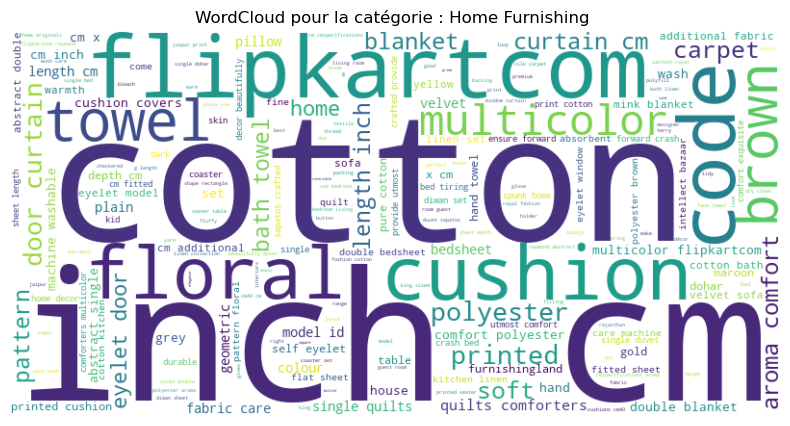

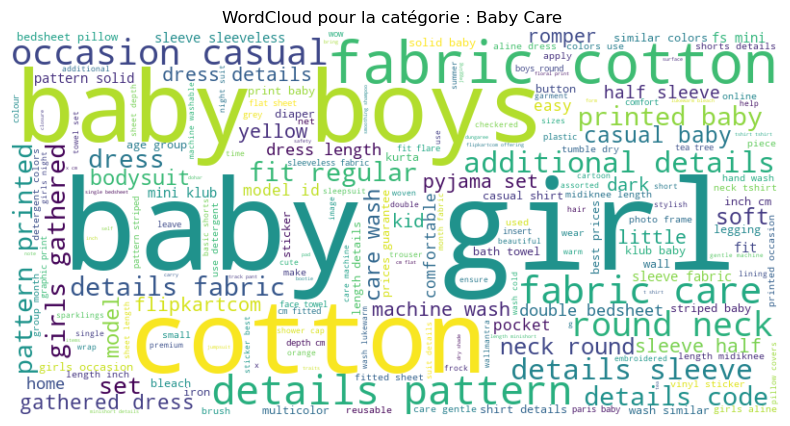

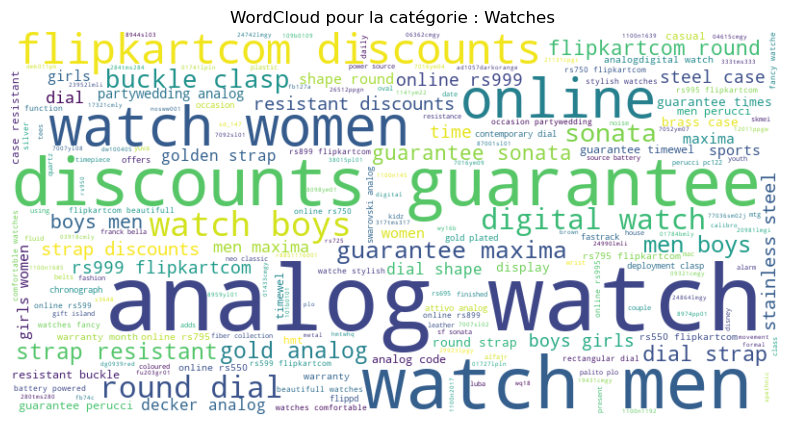

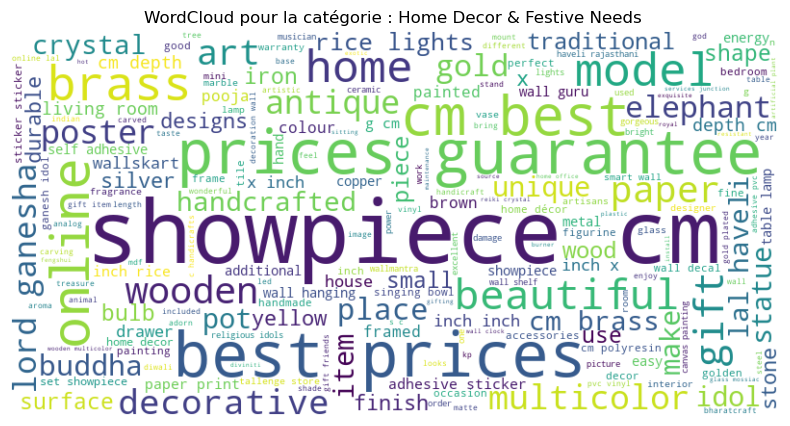

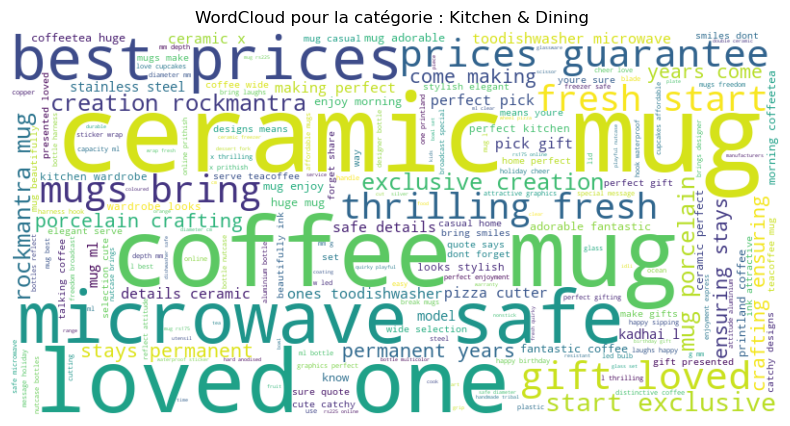

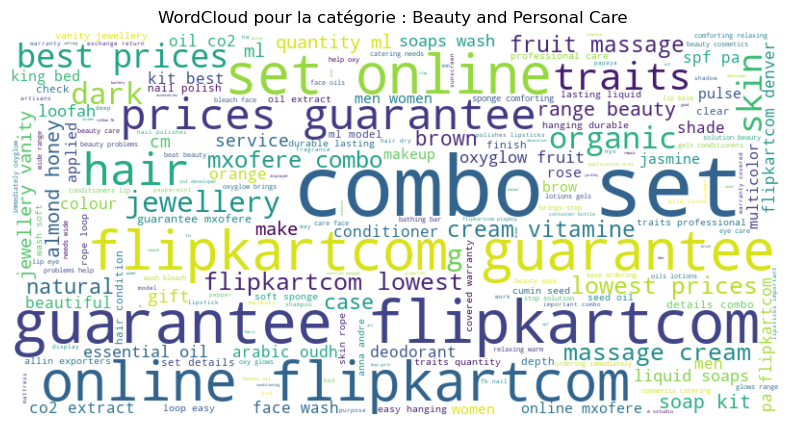

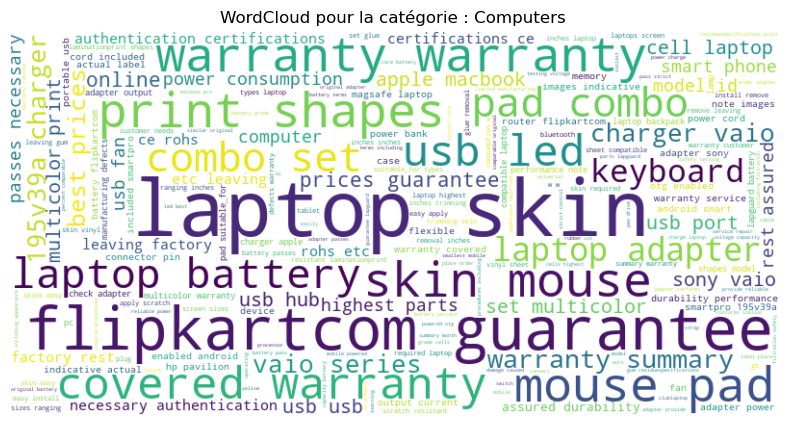

In [41]:
# Applique cette fonction pour les descriptions
afficher_wordcloud_par_categorie(df_utile, 'description_clean', 'niveau_categorie_1')

On remarque des mots qui n'apportent pas d'information sur la catégorie des produits et qui sont présents dans plusieurs catégories. 

In [42]:
# Liste des mots à supprimer
mots_a_supprimer = ['guarantee', 'flipkartcom']
df_utile['description_clean'] = df_utile['description_clean'].apply(lambda x: supprimer_mots_communs(x, mots_a_supprimer))

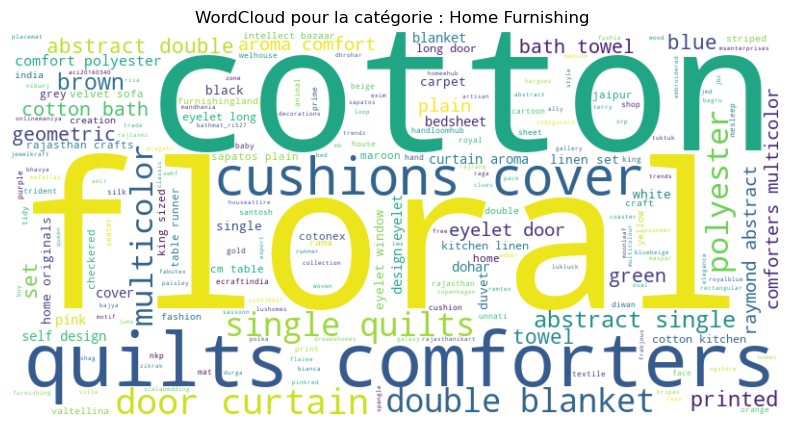

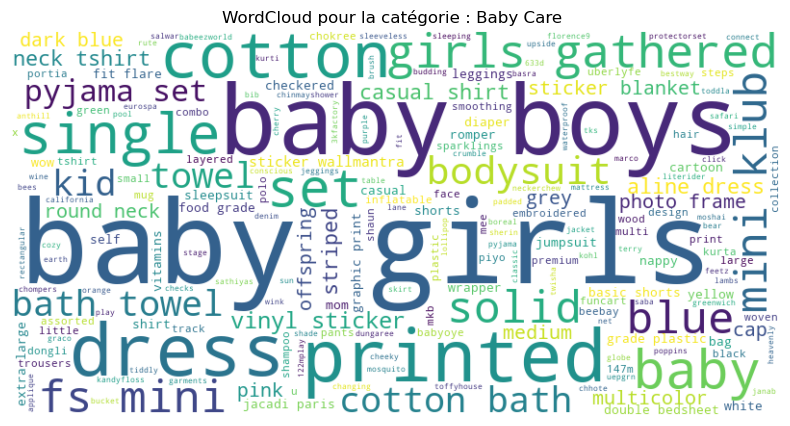

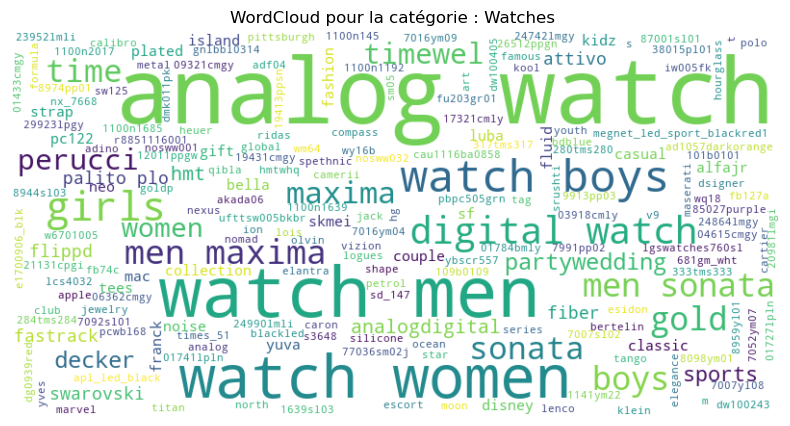

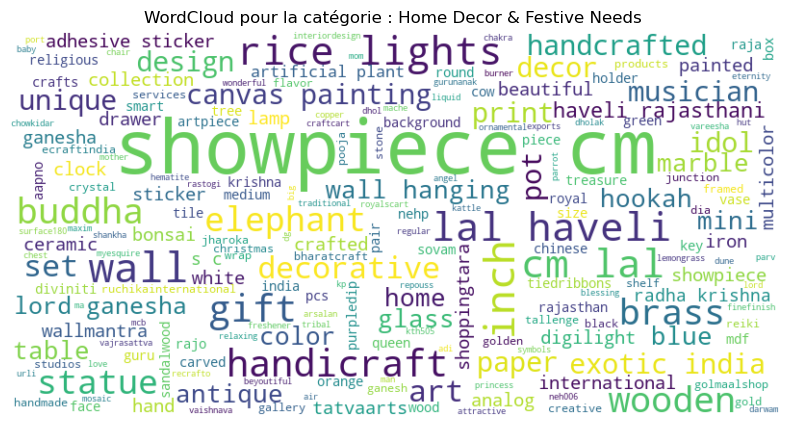

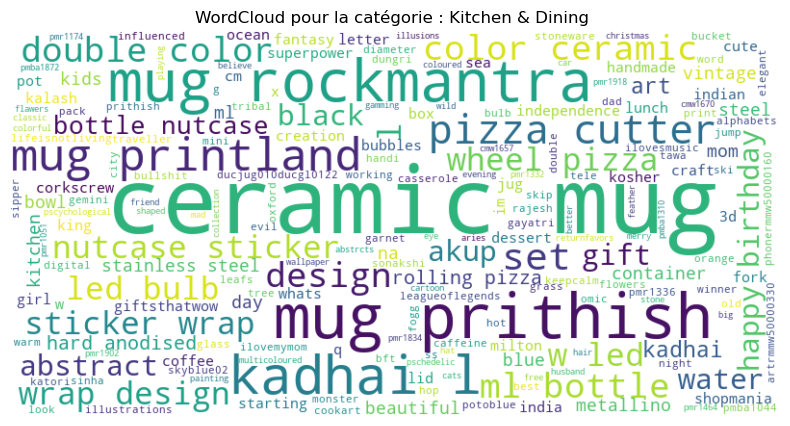

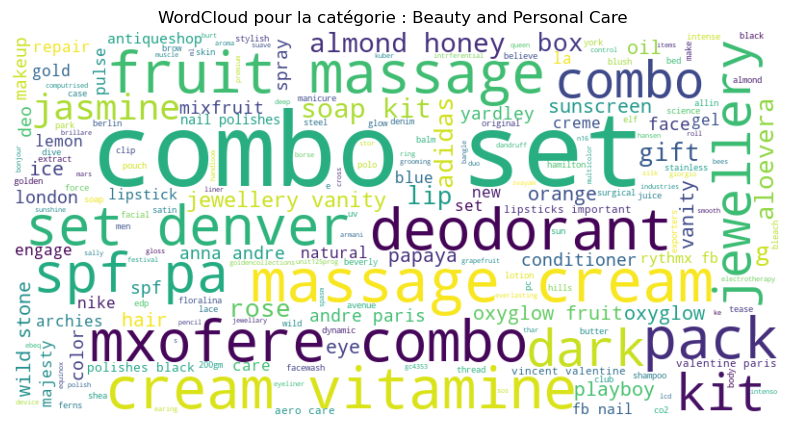

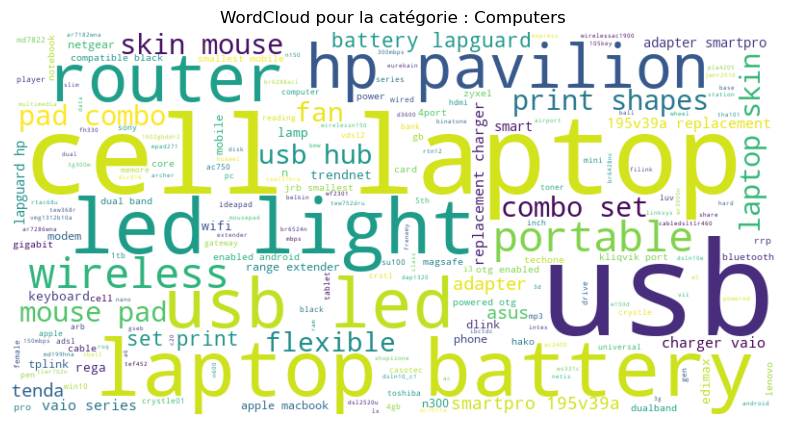

In [43]:
# Applique cette fonction pour les noms de produits
afficher_wordcloud_par_categorie(df_utile, 'product_name_clean', 'niveau_categorie_1')

## Lemmatisation
Après la suppression des mots inutiles, il est souvent utile d'appliquer la lemmatisation pour normaliser les mots. La lemmatisation est une technique de prétraitement de texte qui consiste à réduire un mot à sa forme canonique ou à sa racine grammaticale, appelée "lemme". Contrairement au stemming, qui peut produire des racines non réelles et parfois artificielles, la lemmatisation conserve des mots valides et fait attention au contexte grammatical du mot. Par exemple, "mangé", "mangeant", et "mange" seront tous réduits à "manger", ce qui permet d'uniformiser les formes verbales tout en préservant leur sens.

J'ai préféré ne pas utiliser le stemming car il peut ramener à la même racine deux mots qui n'ont pas la même signification. Par exemple, le stemming pourrait réduire à "cour" les mots "courir" (qui signifie "se déplacer rapidement") et "cour" (qui désigne un espace extérieur). Cela pourrait prêter à confusion, car ces deux mots n'ont pas le même sens, même s'ils partagent une racine similaire.

In [44]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\joan6\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\joan6\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\joan6\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [45]:
def lemmatiser_colonne_texte(df, nom_colonne):
    """
    Cette fonction applique la lemmatisation à une colonne de texte dans un DataFrame.
    
    Paramètres :
    df (DataFrame) : Le DataFrame contenant les données.
    nom_colonne (str) : Le nom de la colonne contenant le texte à lemmatiser.
    
    Retour :
    DataFrame : Le DataFrame avec une nouvelle colonne contenant les textes lemmatisés.
    """
    lemmatizer = WordNetLemmatizer()

    def lemmatiser_texte(texte):
        """
        Cette fonction applique la lemmatisation à un texte donné.
        
        Paramètre :
        texte (str) : Le texte à lemmatiser.
        
        Retour :
        str : Le texte après lemmatisation.
        """
        # Tokenisation du texte (division du texte en mots)
        mots = word_tokenize(texte)
        
        # Lemmatisation de chaque mot
        mots = [lemmatizer.lemmatize(mot) for mot in mots]
        
        # Joindre les mots lemmatisés pour former une phrase
        return ' '.join(mots)
    
    # Créer une nouvelle colonne avec le texte lemmatisé
    nom_colonne_lemmatisée = 'lemmatisé_' + nom_colonne
    df[nom_colonne_lemmatisée] = df[nom_colonne].apply(lemmatiser_texte)
    
    return df

In [46]:
df_test = lemmatiser_colonne_texte(df_test, 'description_clean')
df_test

,description,description_clean,nb_mots_avant,nb_mots_apres,nb_mot_apres_commun,lemmatisé_description_clean
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,zyxel pla4205 8100 flipkartcom guarantee,21,16,5,zyxel pla4205 8100 flipkartcom guarantee
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,philips 95 w led b22 3000k a55 ind bulb rs419 online philips 95 w led b22 3000k a55 ind bulb best prices guarantee,39,34,23,philip 95 w led b22 3000k a55 ind bulb rs419 online philip 95 w led b22 3000k a55 ind bulb best price guarantee
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.",lapguard lenovo ideapad v470 6 cell laptop battery 1799 compatible mentioned model numberthis lapguard battery grade cells highest parts lapguard battery 100 percent comparable original battery terms including appearance important lapguard laptop battery pass strict control procedures including filtration safety testing voltage capacity battery core battery passes necessary authentication certifications ce rohs etc leaving factory rest assured durability performance note images indicative actual label battery nomodel printed label compatible mentioned model numberthis lapguard battery grade cells highest parts lapguard battery 100 percent comparable original battery terms including appearance important lapguard laptop battery pass strict control procedures including filtration safety testing voltage capacity battery core battery passes necessary authentication certifications ce rohs etc leaving factory rest assured durability performance note images indicative actual label battery nomodel printed label,245,157,127,lapguard lenovo ideapad v470 6 cell laptop battery 1799 compatible mentioned model numberthis lapguard battery grade cell highest part lapguard battery 100 percent comparable original battery term including appearance important lapguard laptop battery pas strict control procedure including filtration safety testing voltage capacity battery core battery pass necessary authentication certification ce rohs etc leaving factory rest assured durability performance note image indicative actual label batte

Sur le test on peut voir par exemple:
- "cells" est devenu "cell"
- "parts" → "part"
- "terms" → "term"
- "procedures" → "procedure"
- "images" → "image"

La fonction fonctionne.

In [47]:
# Appliquer la lemmatisation directement sur les colonnes 'product_name_clean' et 'description_clean'
df_utile = lemmatiser_colonne_texte(df_utile, 'product_name_clean')
df_utile = lemmatiser_colonne_texte(df_utile, 'description_clean')

In [48]:
df_utile[['description', 'description_clean', 'lemmatisé_description_clean']].sample(5)

,description,description_clean,lemmatisé_description_clean
226,buy tiedribbons we love mom with green background tile showpiece - 28 cm for rs.699 online. tiedribbons we love mom with green background tile showpiece - 28 cm at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,tiedribbons love mom background tile showpiece 28 cm rs699 online tiedribbons love mom background tile showpiece 28 cm best prices,tiedribbons love mom background tile showpiece 28 cm rs699 online tiedribbons love mom background tile showpiece 28 cm best price
945,buy unnati floral double blanket multicolor at rs. 715 at flipkart.com. only genuine products. free shipping. cash on delivery!,unnati floral double blanket multicolor 715,unnati floral double blanket multicolor 715
503,"sonata 77036sm02j watch - buy sonata 77036sm02j watch 77036sm02j online at rs.999 in india only at flipkart.com. - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!",sonata 77036sm02j watch sonata 77036sm02j watch 77036sm02j online rs999 discounts,sonata 77036sm02j watch sonata 77036sm02j watch 77036sm02j online rs999 discount
229,buy surface 180 elephant shape handpainted wooden round stool showpiece - 17.78 cm for rs.4704 online. surface 180 elephant shape handpainted wooden round stool showpiece - 17.78 cm at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,surface 180 elephant shape handpainted wooden round stool showpiece 1778 cm rs4704 online surface 180 elephant shape handpainted wooden round stool showpiece 1778 cm best prices,surface 180 elephant shape handpainted wooden round stool showpiece 1778 cm rs4704 online surface 180 elephant shape handpainted wooden round stool showpiece 1778 cm best price
86,"key features of oxford tawa 15 cm cm diameter non-stick tawa,specifications of oxford tawa 15 cm cm diameter (aluminium, non-stick) general pan type flat non-stick yes brand oxford model number 16 induction bottom no type tawa material aluminium capacity 1 l l color black in the box sales package 1 dosa tawa dimensions diameter 15 cm cm",oxford tawa 15 cm cm diameter nonstick tawaspecifications oxford tawa 15 cm cm diameter aluminium nonstick pan flat nonstick oxford model 16 induction tawa aluminium capacity 1 l l 1 dosa tawa diameter 15 cm cm,oxford tawa 15 cm cm diameter nonstick tawaspecifications oxford tawa 15 cm cm diameter aluminium nonstick pan flat nonstick oxford model 16 induction tawa aluminium capacity 1 l l 1 dosa tawa diameter 15 cm cm


In [49]:
# Supprimer les colonnes intermédiaires
df_utile.drop(columns=["product_name_clean", "description_clean"], inplace=True)
df_test.drop(columns=["description_clean"], inplace=True)

# Renommer les colonnes lemmatisées
df_utile.rename(columns={
    "lemmatisé_product_name_clean": "product_name_clean",
    "lemmatisé_description_clean": "description_clean"
}, inplace=True)
df_test.rename(columns={
    "lemmatisé_description_clean": "description_clean"
}, inplace=True)

## Suppression de la Ponctuation
Les signes de ponctuation comme les virgules, les points d'exclamation, les points d'interrogation, etc., ne contiennent généralement pas d'informations utiles pour l'analyse du texte. Cependant, pour éviter que des mots ne se concatènent (par exemple, "manger,boire" devienne "mangerboire"), il est important de les supprimer et d'ajouter des espaces si nécessaire.

In [50]:
# Fonction pour supprimer la ponctuation et ajouter des espaces
def supprimer_ponctuation(text):
    """
    Supprime la ponctuation d'un texte et ajoute des espaces pour éviter la concaténation des mots.
    
    Paramètre :
    text (str) : Le texte à nettoyer.
    
    Retour :
    str : Le texte après suppression de la ponctuation.
    """
    if pd.isnull(text):
        return ""
    
    # Remplacer chaque signe de ponctuation par un espace
    table_traduction = str.maketrans(string.punctuation, ' ' * len(string.punctuation))
    text_sans_ponctuation = text.translate(table_traduction)
    
    # Remplacer les multiples espaces par un seul espace
    text_sans_ponctuation = ' '.join(text_sans_ponctuation.split())
    
    return text_sans_ponctuation

In [51]:
df_test['description_clean'] = df_test['description_clean'].apply(supprimer_ponctuation)
df_test

,description,nb_mots_avant,nb_mots_apres,nb_mot_apres_commun,description_clean
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,21,16,5,zyxel pla4205 8100 flipkartcom guarantee
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,39,34,23,philip 95 w led b22 3000k a55 ind bulb rs419 online philip 95 w led b22 3000k a55 ind bulb best price guarantee
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.",245,157,127,lapguard lenovo ideapad v470 6 cell laptop battery 1799 compatible mentioned model numberthis lapguard battery grade cell highest part lapguard battery 100 percent comparable original battery term including appearance important lapguard laptop battery pas strict control procedure including filtration safety testing voltage capacity battery core battery pass necessary authentication certification ce rohs etc leaving factory rest assured durability performance note image indicative actual label battery nomodel printed label compatible mentioned model numberthis lapguard battery grade cell highest part lapguard battery 100 percent comparable original battery term including appearance important lapguard laptop battery pas strict control procedure including filtration safety testing voltage capacity battery core battery pass necessary authentication certification ce rohs etc leaving factory rest assured durability performance note image indicative actual label battery nomodel printed label
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,34,27,15,flipkartcom anna andre paris set dark numero 1 deodorant combo set online 310 flipkartcom guarantee
31,"lenco bdblue tango analog watch - for men, boys - buy lenco bdblue tango analog watch - for men, boys bdblue online at rs.599 in india only at flipkart.com. sports watch, casual watch, big size dial, colourful strap - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!",53,45,28,lenco bdblue tango analog watch men boy lenc

La ponctuation a bien disparue.

In [52]:
# Appliquer la fonction sur les colonnes product_name_clean et description_clean
df_utile['product_name_clean'] = df_utile['product_name_clean'].apply(supprimer_ponctuation)
df_utile['description_clean'] = df_utile['description_clean'].apply(supprimer_ponctuation)

In [53]:
df_utile[["product_name", "product_name_clean", 'description', "description_clean"]].sample(5)

,product_name,product_name_clean,description,description_clean
883,shagun gold tea tree essential aroma therapy oil,shagun gold tea tree essential aroma therapy oil,"shagun gold tea tree essential aroma therapy oil (15 ml)\r\n price: rs. 269\r\n\t\t\t\t\r\n\t\t\ttea tree oil is derived from the leaves of the tea tree. the tea tree was named by eighteenth century sailors, who made tea that smelled like nutmeg from the leaves of the tree growing on the swampy southeast australian coast. do not confuse the tea tree with the unrelated common tea plant that is used to make black and green teas.\r\ntea tree oil is derived from the leaves of the tea tree. the tea tree was named by eighteenth century sailors, who made tea that smelled like nutmeg from the leaves of the tree growing on the swampy southeast australian coast. do not confuse the tea tree with the unrelated common tea plant that is used to make black and green teas.",shagun gold tea tree essential aroma therapy oil 15 ml 269 tea tree oil derived leaf tea tree tea tree named eighteenth century sailor tea smelled nutmeg leaf tree growing swampy southeast australian coast confuse tea tree unrelated common tea plant used make tea tea tree oil derived leaf tea tree tea tree named eighteenth century sailor tea smelled nutmeg leaf tree growing swampy southeast australian coast confuse tea tree unrelated common tea plant used make tea
431,"smartpro 19.5v,3.9a replacement charger for vaio series vgn-cr490ebw 75 adapter",smartpro 195v39a replacement charger vaio series vgncr490ebw 75 adapter,"specifications of smartpro 19.5v,3.9a replacement charger for vaio series vgn-cr490ebw 75 adapter (power cord included) general brand smartpro designed for vaio vgn-cr490ebw sales package 1 laptop adapter key features designed for sony vaio vgn-cr490ebw connector pin type 6.5mm x 4.4mm model id 19.5v,3.9a replacement charger for vaio series vgn-cr490ebw power power input 220 v, 50 - 60 hz power consumption (w) 75 w output current (a) 3.9 a output voltage (v) 19.5 v warranty covered in warranty warranty of the product is limited to manufacturing defects only warranty summary 6 month india warranty warranty service type replacement or repair carry in warranty. customer needs to carry in / send it for replacement or repairs and the replaced product will be sent back to customer not covered in warranty warranty does not cover any external accessories (such as battery, cable, carrying bag), damage caused to the product due to improper installation by customer, normal wear and tear to magnetic heads, audio, video, laser pick-ups and tv picture tubes, pane",smartpro 195v39a charger vaio series vgncr490ebw 75 adapter power cord included smartpro vaio vgncr490ebw 1 laptop adapter sony vaio vgncr490ebw connector pin 65mm x 44mm model id 195v39a charger vaio series vgncr490ebw power power input 220 v 50 60 hz power consumption w 75 w output current a 39 output voltage v 195 v warranty covered warranty warranty limited manufacturing defect warranty summary 6 month warranty warranty service repair carry warranty customer need carry send repair replaced sent customer covered warranty warranty doe external accessory such battery cable carrying bag damage caused improper installation customer normal wear tear magnetic head audio video laser pickup tv picture tube pane
487,lapguard dell u661h compatible black 6 cell laptop battery,lapguard dell u661h compatible black 6 cell laptop battery,buy lapguard dell u661h compatible black 6 cell laptop battery only for rs. 1799 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,lapguard dell u661h compatible 6 cell laptop battery 1799
731,tidy green cotton kitchen linen set,tidy green cotton kitchen linen set,"specifications of tidy green cotton kitchen linen set (pack of 3) general brand tidy design code rmhg material cotton style code rmhg323 design printed glove color green dimensions weight 200 g additional featur

In [54]:
# Vérifie s’il reste des signes de ponctuation
df_utile["description_clean"].apply(lambda x: bool(re.search(r'[{}]'.format(re.escape(string.punctuation)), x))).value_counts()

description_clean
False    1050
Name: count, dtype: int64

In [55]:
# Vérifie s’il reste des signes de ponctuation
df_utile["product_name_clean"].apply(lambda x: bool(re.search(r'[{}]'.format(re.escape(string.punctuation)), x))).value_counts()

product_name_clean
False    1050
Name: count, dtype: int64

## Supprimer les chiffres

Dans de nombreuses analyses de données textuelles, les chiffres peuvent ne pas apporter d'informations pertinentes ou peuvent introduire des biais dans les modèles. Par exemple, des informations comme les prix, les quantités ou les dates peuvent être importantes dans un contexte spécifique, mais dans le cadre d'une analyse de texte plus générale, ces éléments peuvent être considérés comme du bruit. Pour garantir une meilleure qualité d'analyse, il est souvent utile de supprimer les chiffres des colonnes textuelles, ce qui permet de concentrer l'attention sur les termes significatifs et d'éviter que les modèles ne se focalisent sur des éléments numériques qui ne sont pas cruciaux pour la tâche.

Dans cette étape, nous allons procéder à la suppression de tous les chiffres présents dans les colonnes product_name_clean et description_clean du DataFrame.

In [56]:
# Fonction pour supprimer les chiffres d'un texte
def supprimer_chiffres(text):
    """
    Supprime les chiffres d'un texte.
    
    Paramètre :
    text (str) : Le texte à nettoyer.
    
    Retour :
    str : Le texte après suppression des chiffres.
    """
    if pd.isnull(text):
        return ""
    
    # Utilisation de regex pour enlever les chiffres
    return re.sub(r'\d+', '', text)

In [57]:
df_test['description_clean'] = df_test['description_clean'].apply(supprimer_chiffres)
df_test

,description,nb_mots_avant,nb_mots_apres,nb_mot_apres_commun,description_clean
352,buy zyxel pla-4205 only for rs. 8100 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,21,16,5,zyxel pla flipkartcom guarantee
689,buy philips 9.5 w led b22 3000k a55 ind bulb for rs.419 online. philips 9.5 w led b22 3000k a55 ind bulb at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee.,39,34,23,philip w led b k a ind bulb rs online philip w led b k a ind bulb best price guarantee
485,"lapguard lenovo ideapad v470 6 cell laptop battery\r\n price: rs. 1,799\r\n\t\t\t\t\r\n\t\t\tthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.\r\nthe product is compatible with the above mentioned model number.this lapguard replacement battery is made from high grade cells and highest quality parts. this lapguard brand replacement battery is 100 percent comparable to original battery in all terms including its size, appearance and most important quality. each lapguard laptop battery has to pass strict quality control procedures including filtration and safety testing of voltage, capacity and battery core (body). each battery also passes necessary authentication certifications like ce, rohs etc. before leaving the factory, so you can be rest assured for its quality, durability and performance. please note that all images are indicative, actual product label may vary. battery part no./model may not be printed on label.",245,157,127,lapguard lenovo ideapad v cell laptop battery compatible mentioned model numberthis lapguard battery grade cell highest part lapguard battery percent comparable original battery term including appearance important lapguard laptop battery pas strict control procedure including filtration safety testing voltage capacity battery core battery pass necessary authentication certification ce rohs etc leaving factory rest assured durability performance note image indicative actual label battery nomodel printed label compatible mentioned model numberthis lapguard battery grade cell highest part lapguard battery percent comparable original battery term including appearance important lapguard laptop battery pas strict control procedure including filtration safety testing voltage capacity battery core battery pass necessary authentication certification ce rohs etc leaving factory rest assured durability performance note image indicative actual label battery nomodel printed label
388,flipkart.com: buy anna andre paris set of dark fire & numero 1 deodorants combo set online only for rs. 310 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!,34,27,15,flipkartcom anna andre paris set dark numero deodorant combo set online flipkartcom guarantee
31,"lenco bdblue tango analog watch - for men, boys - buy lenco bdblue tango analog watch - for men, boys bdblue online at rs.599 in india only at flipkart.com. sports watch, casual watch, big size dial, colourful strap - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!",53,45,28,lenco bdblue tango analog watch men boy lenco bdblue tango analog watch men boy bdblue online rs flipk

Les chiffres ont bien disparus.

In [58]:
# Appliquer la fonction sur les colonnes product_name_clean et description_clean
df_utile['product_name_clean'] = df_utile['product_name_clean'].apply(supprimer_chiffres)
df_utile['description_clean'] = df_utile['description_clean'].apply(supprimer_chiffres)

## Vérification du Nettoyage et du Prétraitement des Données Textuelles

In [59]:
# Comparaison avant et après les transformations
df_utile[['product_name', 'product_name_clean', 'description', 'description_clean']].head(10)

,product_name,product_name_clean,description,description_clean
0,elegance polyester multicolor abstract eyelet door curtain,elegance polyester multicolor abstract eyelet door curtain,"key features of elegance polyester multicolor abstract eyelet door curtain floral curtain,elegance polyester multicolor abstract eyelet door curtain (213 cm in height, pack of 2) price: rs. 899 this curtain enhances the look of the interiors.this curtain is made from 100% high quality polyester fabric.it features an eyelet style stitch with metal ring.it makes the room environment romantic and loving.this curtain is ant- wrinkle and anti shrinkage and have elegant apparance.give your home a bright and modernistic appeal with these designs. the surreal attention is sure to steal hearts. these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,specifications of elegance polyester multicolor abstract eyelet door curtain (213 cm in height, pack of 2) general brand elegance designed for door type eyelet model name abstract polyester door curtain set of 2 model id duster25 color multicolor dimensions length 213 cm in the box number of contents in sales package pack of 2 sales package 2 curtains body & design material polyester",elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain cm curtain enhances interiorsthis curtain polyester fabricit eyelet stitch metal ringit make room environment romantic lovingthis curtain ant wrinkle anti shrinkage elegant apparancegive home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart thing morning welcome bright sun ray want wish good morning draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter room right sunlightspecifications elegance polyester multicolor abstract eyelet door curtain cm elegance door eyelet model abstract polyester door curtain set model id duster multicolor length cm curtain polyester
1,sathiyas cotton bath towel,sathiyas cotton bath towel,"specifications of sathiyas cotton bath towel (3 bath towel, red, yellow, blue) bath towel features machine washable yes material cotton design self design general brand sathiyas type bath towel gsm 500 model name sathiyas cotton bath towel ideal for men, women, boys, girls model id asvtwl322 color red, yellow, blue size mediam dimensions length 30 inch width 60 inch in the box number of contents in sales package 3 sales package 3 bath towel",sathiyas cotton bath towel bath towel yellow bath towel machine washable cotton self sathiyas bath towel gsm model sathiyas cotton bath towel men woman boy girl model id asvtwl yellow mediam length inch inch bath towel
2,eurospa cotton terry face towel set,eurospa cotton terry face towel set,"key features of eurospa cotton terry face towel set size: small height: 9 inch gsm: 360,eurospa cotton terry face towel set (20 piece face towel set, assorted) price: rs. 299 eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. all our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. note: our product is 100% cotton, so it is susceptible to shrinkage. product color may vary from the picture. size may vary by ±3% wash care: wash in cold water, do not iron, do not bleach, flat dry, wash before fir

In [60]:
df_utile['longueur_product_name_clean'] = df_utile['product_name_clean'].apply(len)
df_utile['longueur_description_clean'] = df_utile['description_clean'].apply(len)

# Statistiques descriptives des longueurs avant et après nettoyage
df_utile[['longueur_nom_produit', 'longueur_product_name_clean',
          'longueur_description', 'longueur_description_clean']].describe()

,longueur_nom_produit,longueur_product_name_clean,longueur_description,longueur_description_clean
count,1050.000000,1050.000000,1050.000000,1050.000000
mean,45.101905,39.380952,473.820952,258.796190
std,17.497326,15.737407,457.910422,297.068124
min,8.000000,6.000000,109.000000,8.000000
25%,33.000000,29.000000,192.000000,62.250000
50%,43.000000,37.000000,278.000000,134.000000
75%,55.000000,48.000000,588.250000,365.500000
max,151.000000,136.000000,3490.000000,2064.000000


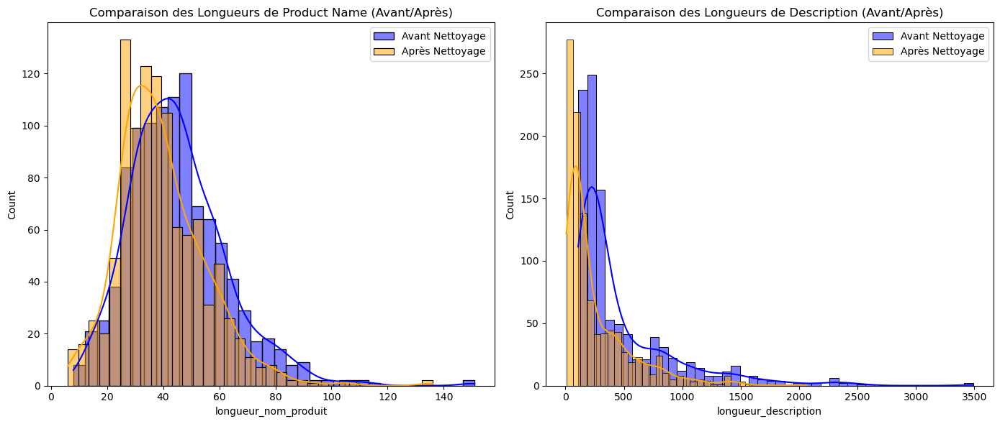

In [61]:
# Configuration des graphiques
plt.figure(figsize=(14, 6))

# Histogrammes pour product_name
plt.subplot(1, 2, 1)
sns.histplot(df_utile['longueur_nom_produit'], kde=True, color='blue', label='Avant Nettoyage')
sns.histplot(df_utile['longueur_product_name_clean'], kde=True, color='orange', label='Après Nettoyage')
plt.legend()
plt.title('Comparaison des Longueurs de Product Name (Avant/Après)')

# Histogrammes pour description
plt.subplot(1, 2, 2)
sns.histplot(df_utile['longueur_description'], kde=True, color='blue', label='Avant Nettoyage')
sns.histplot(df_utile['longueur_description_clean'], kde=True, color='orange', label='Après Nettoyage')
plt.legend()
plt.title('Comparaison des Longueurs de Description (Avant/Après)')

# Afficher les graphiques
plt.tight_layout()
plt.show()


Les statistiques descriptives des longueurs de texte avant et après nettoyage révèlent des réductions significatives.

- Pour les noms de produits, la longueur moyenne a diminué de 45.1 à 39.4 caractères, avec des réductions notables des valeurs maximales et des quartiles supérieurs.

- Pour les descriptions, la longueur moyenne a également diminué, passant de 473.8 à 258.8 caractères, une réduction encore plus marquée, ce qui confirme l'efficacité du nettoyage (suppression des stopwords, de la ponctuation et des chiffres).

- Les statistiques de dispersion montrent également des écarts réduits après nettoyage, indiquant une homogénéisation du texte.

Ces résultats indiquent que les étapes de nettoyage ont considérablement simplifié les données textuelles, ce qui les rend plus adaptées pour les analyses ultérieures.

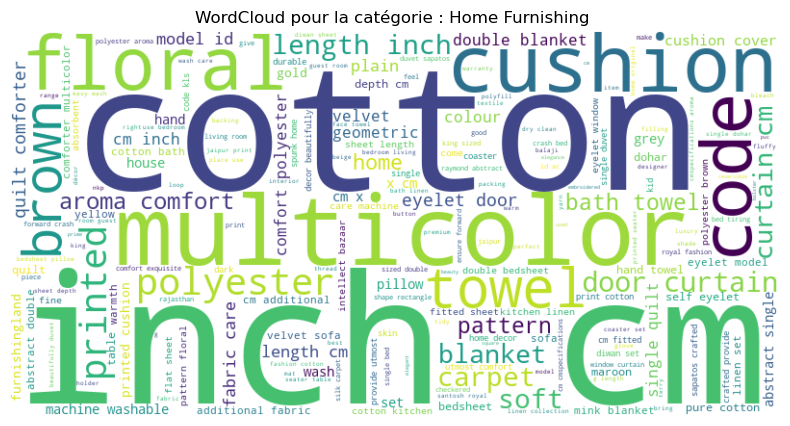

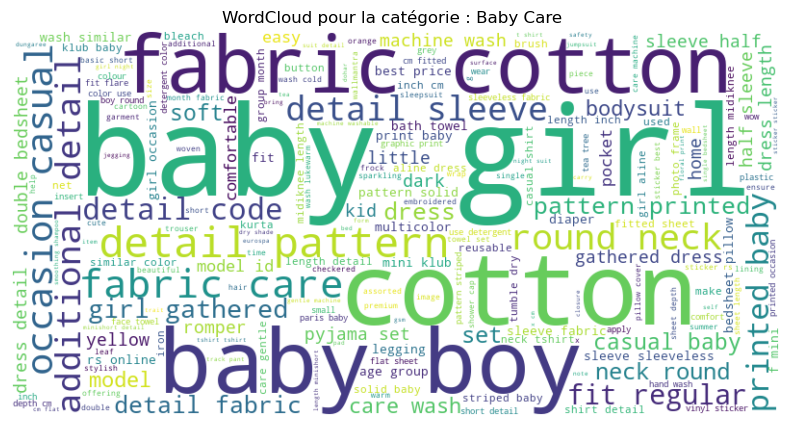

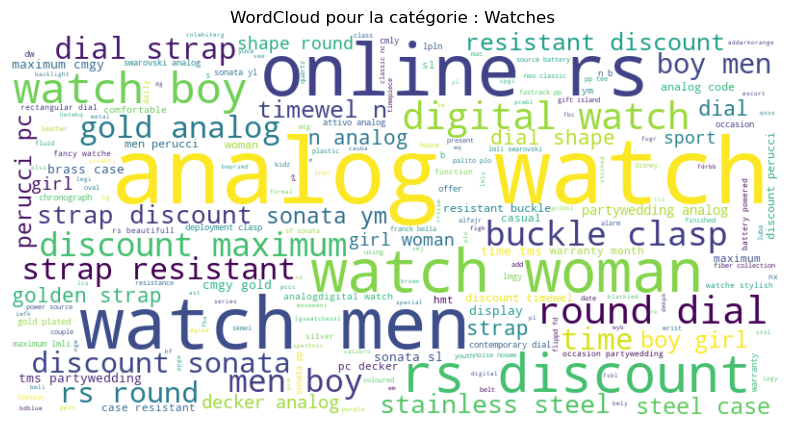

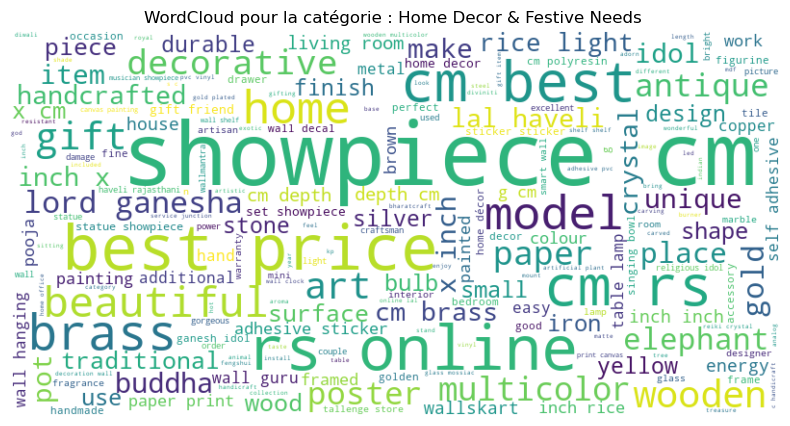

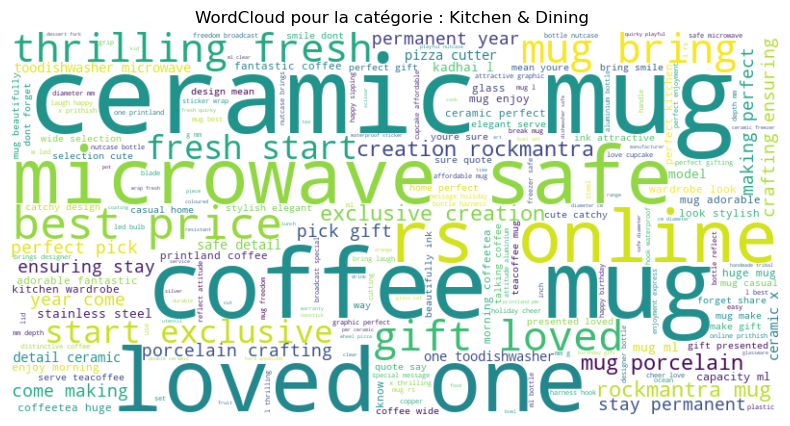

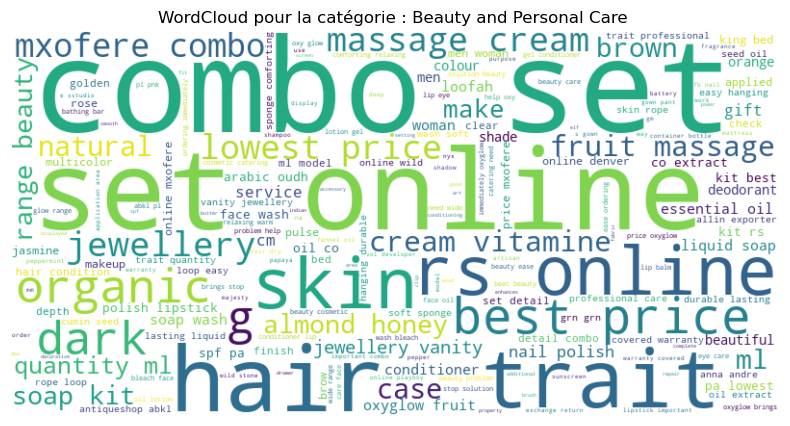

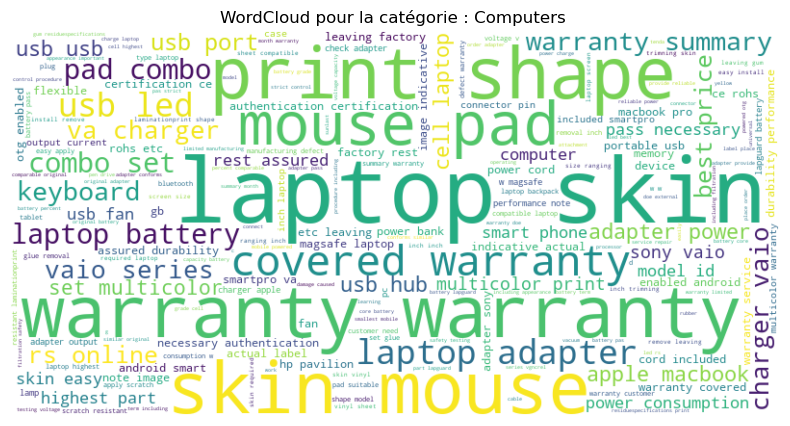

In [62]:
# Applique cette fonction pour les descriptions
afficher_wordcloud_par_categorie(df_utile, 'description_clean', 'niveau_categorie_1')

In [63]:
# Vérifions si les mots les plus fréquents ont changés
mots_frequents_description = mots_frequents_par_categorie(df_utile, 'niveau_categorie_1', 'description_clean')

# Afficher les mots les plus fréquents par catégorie (pour les descriptions)
for categorie, tableau in mots_frequents_description.items():
    print(f"Catégorie : {categorie}")
    print(tableau)
    print("\n")

Catégorie : Baby Care 
          Mot  Fréquence
62       baby        316
485      girl        197
263    cotton        182
403    fabric        162
130       boy        112
337     dress        102
1015   sleeve         83
736      neck         77
1197     wash         76
797   pattern         74


Catégorie : Beauty and Personal Care 
            Mot  Fréquence
914         set        112
210       combo        107
710      online         83
946        skin         68
470        hair         50
706         oil         43
1054      trait         42
959        soap         40
793       price         38
541   jewellery         34


Catégorie : Computers 
           Mot  Fréquence
517     laptop        234
1017       usb        174
1060  warranty        158
12     adapter        131
81     battery        110
734      power        101
880       skin         82
152    charger         62
1028      vaio         53
860      shape         52


Catégorie : Home Decor & Festive Needs 
            

Nous avons comparé les mots les plus fréquents dans les descriptions de produits pour différentes catégories, avant et après l'étape de nettoyage des textes (suppression du bruit, lemmatisation, suppression des stopwords, etc.).

**Objectifs du nettoyage :**
- Éliminer les mots génériques ou non informatifs (ex. : "rs", "details", "specifications", "com", "flipkart").
- Réduire les mots à leur forme canonique (lemmatisation) : "mugs" → "mug", "products" → "product", etc.
- Faire ressortir les termes réellement descriptifs et spécifiques aux produits.

**Résultats observés :**<br>
Dans toutes les catégories, le nettoyage a permis de :
- Réduire la présence de mots sans valeur ajoutée comme les noms de plateformes (flipkart, com), les prix ("rs"), ou les mentions génériques ("details", "products").
- Mettre en avant des mots plus pertinents et plus descriptifs des produits, par exemple :
- Baby Care : apparition de "sleeve", "neck", "pattern", "wash"
- Kitchen & Dining : mise en évidence de "gift", "ml", "safe", "rockmantra"
- Watches : émergence de termes liés à la vente comme "discount", "guarantee", "delivery"<br>

La lemmatisation a également amélioré la cohérence des termes :
- Singulier/pluriel unifiés
- Termes proches regroupés sous une même forme

Le nettoyage du texte a permis d’obtenir une représentation plus précise et plus informative des descriptions produits. Cette étape est essentielle pour toute analyse ultérieure (clustering, classification, extraction de caractéristiques, etc.).

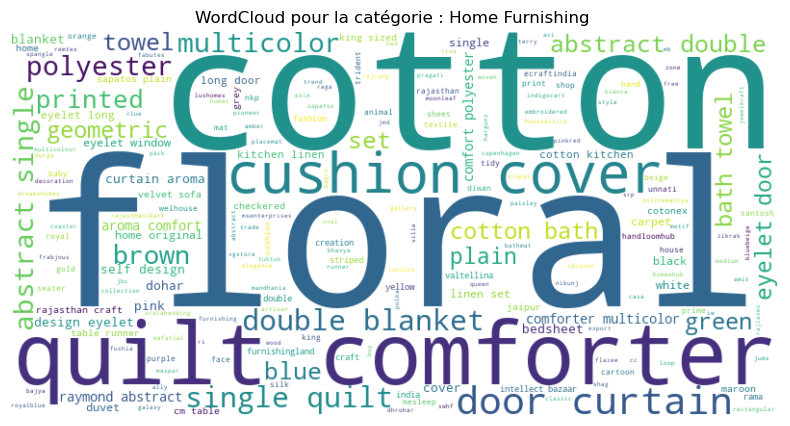

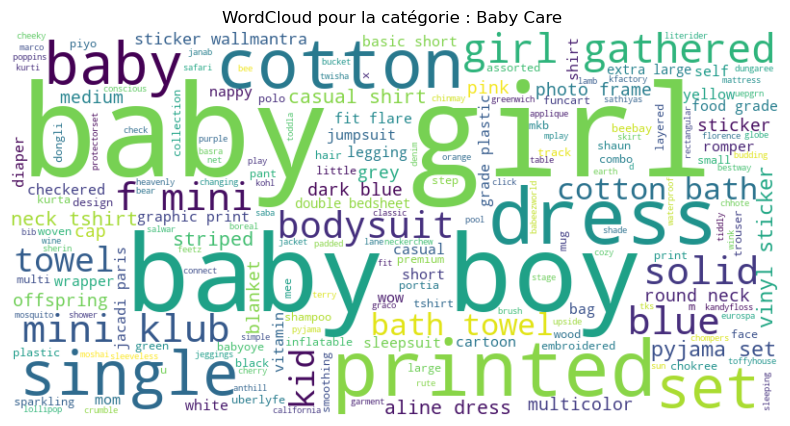

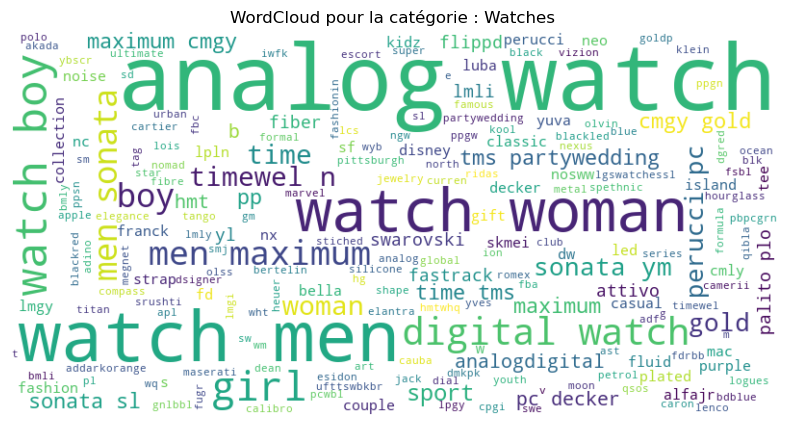

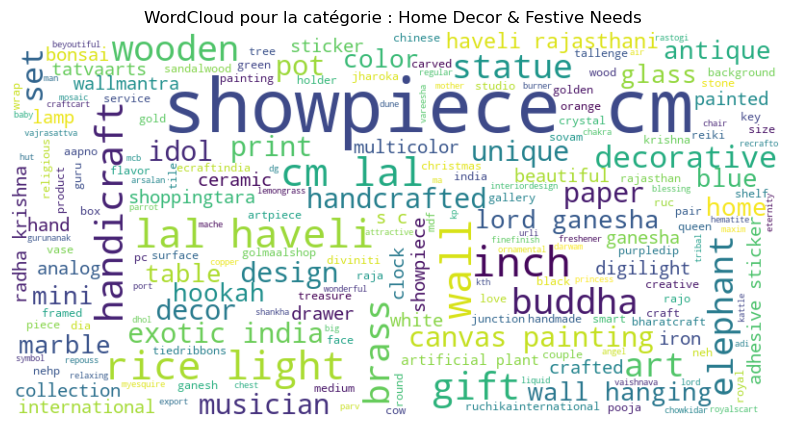

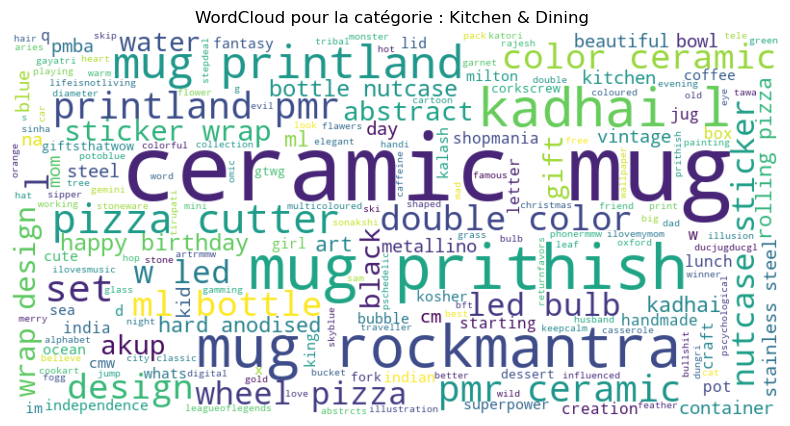

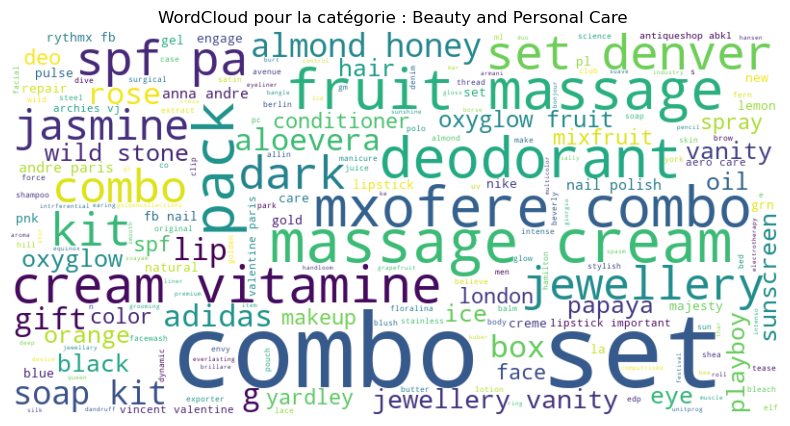

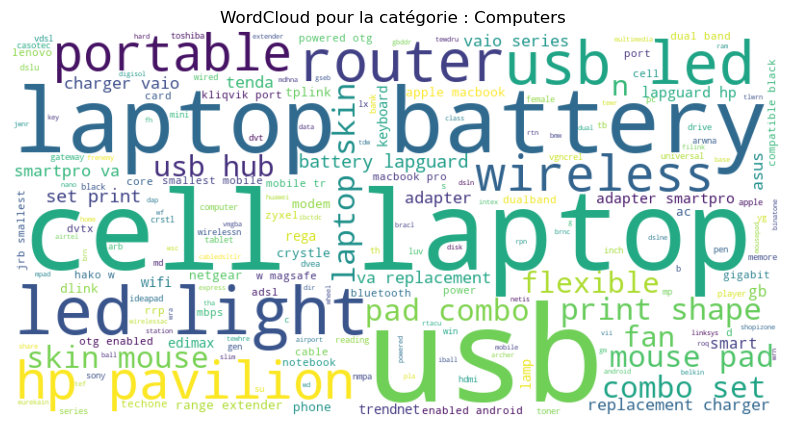

In [64]:
# Applique cette fonction pour les noms de produits
afficher_wordcloud_par_categorie(df_utile, 'product_name_clean', 'niveau_categorie_1')

In [65]:
# Vérifions si les mots les plus fréquents ont changés
mots_frequents_nom_produit = mots_frequents_par_categorie(df_utile, 'niveau_categorie_1', 'product_name_clean')

# Afficher les mots les plus fréquents par catégorie (pour les noms de produits)
for categorie, tableau in mots_frequents_nom_produit.items():
    print(f"Catégorie : {categorie}")
    print(tableau)
    print("\n")

Catégorie : Baby Care 
         Mot  Fréquence
12      baby         91
126     girl         50
40       boy         33
93     dress         22
78    cotton         19
250  printed         17
271      set         15
303  sticker         14
36      blue         12
321    towel         12


Catégorie : Beauty and Personal Care 
           Mot  Fréquence
80       combo         80
362        set         75
218        kit         14
90       cream         13
207  jewellery         13
383        spf         12
424     vanity         11
256    massage         11
430   vitamine         10
150      fruit         10


Catégorie : Computers 
          Mot  Fréquence
342       usb         60
179    laptop         39
55       cell         25
181       led         24
186     light         22
30    battery         22
154        hp         18
280    router         16
239  pavilion         13
4     adapter         13


Catégorie : Home Decor & Festive Needs 
            Mot  Fréquence
333   showpiece   

Catégorie Baby Care :
Peu de changement en tête de classement, mais des ajouts intéressants comme "towel" qui remplace des mots moins informatifs.

Catégorie Beauty and Personal Care :
On retrouve des mots pertinents comme "combo", "kit", "cream", avec en plus l’apparition de termes de marque ou spécifiques comme "oxyglow", reflétant mieux l'offre produit.

Catégorie Computers :
Des mots techniques comme "usb", "laptop", "battery" sont conservés, avec l'ajout de "adapter", souvent utilisé mais précédemment noyé dans le bruit.

Catégorie Home Decor & Festive Needs :
Les termes décoratifs restent bien présents ("showpiece", "wall"), avec de nouveaux mots comme "handicraft" ou "gift" qui enrichissent l'analyse sémantique.

Catégorie Home Furnishing :
Meilleure structuration des mots liés au textile : "quilt", "comforter", "polyester", etc. remplacent des doublons ou variantes moins utiles.

Catégorie Kitchen & Dining :
Les termes comme "ceramic", "mug", "kadhai" dominent toujours, mais des quantités et caractéristiques sont mieux visibles ("ml", "design").

Catégorie Watches :
Les termes clés "watch", "analog", "men", "digital" restent pertinents, avec une harmonisation du genre ("woman" remplace "women", "girl" et "boy" sont unifiés).

Conclusion :
Le nettoyage des noms de produits a permis de clarifier et consolider les termes les plus représentatifs pour chaque catégorie. Il en résulte une base textuelle plus homogène et exploitable, essentielle pour la suite de nos analyses 

On va regarder la relation entre la longueur des description et des nom de produits et notre cible

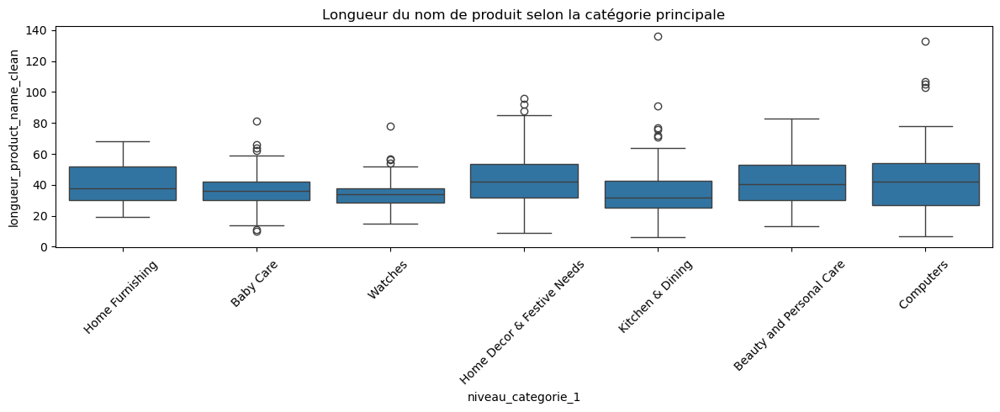

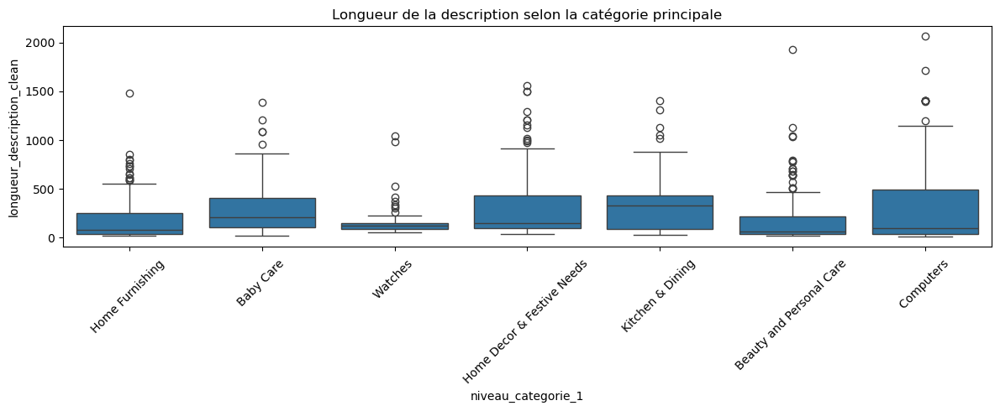

In [66]:
# Boxplots : Longueur du nom de produit par catégorie principale
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_utile, x='niveau_categorie_1', y='longueur_product_name_clean')
plt.xticks(rotation=45)
plt.title('Longueur du nom de produit selon la catégorie principale')
plt.tight_layout()
plt.show()

# Boxplots : Longueur de la description par catégorie principale
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_utile, x='niveau_categorie_1', y='longueur_description_clean')
plt.xticks(rotation=45)
plt.title('Longueur de la description selon la catégorie principale')
plt.tight_layout()
plt.show()

In [67]:
# Moyenne, médiane, écart-type, etc. pour les longueurs de nom
desc_nom = df_utile.groupby('niveau_categorie_1')['longueur_product_name_clean'].describe()

# Moyenne, médiane, écart-type, etc. pour les longueurs de description
desc_desc = df_utile.groupby('niveau_categorie_1')['longueur_description_clean'].describe()

# Affichage
print("Statistiques descriptives - Longueur du nom de produit")
display(desc_nom)

print("\nStatistiques descriptives - Longueur de la description")
display(desc_desc)

Statistiques descriptives - Longueur du nom de produit


,count,mean,std,min,25%,50%,75%,max
niveau_categorie_1,,,,,,,,
Baby Care,150.0,36.740000,10.275683,10.0,30.00,36.0,42.00,81.0
Beauty and Personal Care,150.0,42.940000,16.223783,13.0,30.00,40.5,53.00,83.0
Computers,150.0,41.313333,21.651956,7.0,27.00,42.0,54.00,133.0
Home Decor & Festive Needs,150.0,44.733333,16.927666,9.0,32.00,42.0,53.75,96.0
Home Furnishing,150.0,40.520000,12.662220,19.0,30.00,38.0,52.00,68.0
Kitchen & Dining,150.0,35.226667,16.868280,6.0,25.00,32.0,42.75,136.0
Watches,150.0,34.193333,8.744468,15.0,28.25,34.0,38.00,78.0



Statistiques descriptives - Longueur de la description


,count,mean,std,min,25%,50%,75%,max
niveau_categorie_1,,,,,,,,
Baby Care,150.0,293.453333,253.517922,17.0,102.5,212.5,406.75,1389.0
Beauty and Personal Care,150.0,195.926667,272.580414,23.0,39.0,65.0,220.00,1933.0
Computers,150.0,308.913333,418.708768,8.0,38.0,93.0,494.50,2064.0
Home Decor & Festive Needs,150.0,322.993333,340.188666,40.0,100.0,150.0,432.75,1559.0
Home Furnishing,150.0,197.180000,232.460232,20.0,40.5,80.0,256.00,1484.0
Kitchen & Dining,150.0,351.086667,291.828186,25.0,87.0,330.5,436.00,1408.0
Watches,150.0,142.020000,120.378568,53.0,87.5,123.0,150.75,1039.0


In [68]:
# Test de Kruskal-Wallis pour la longueur du nom de produit
kruskal_nom = kruskal(*[
    df_utile[df_utile['niveau_categorie_1'] == cat]['longueur_product_name_clean']
    for cat in df_utile['niveau_categorie_1'].unique()
])

# Test de Kruskal-Wallis pour la longueur de la description
kruskal_desc = kruskal(*[
    df_utile[df_utile['niveau_categorie_1'] == cat]['longueur_description_clean']
    for cat in df_utile['niveau_categorie_1'].unique()
])

# Affichage des résultats
print("Kruskal - Longueur des noms de produits :", kruskal_nom)
print("Kruskal - Longueur des descriptions :", kruskal_desc)

Kruskal - Longueur des noms de produits : KruskalResult(statistic=60.05824639522175, pvalue=4.380032651264764e-11)
Kruskal - Longueur des descriptions : KruskalResult(statistic=98.68461530374735, pvalue=4.71971348481746e-19)


Les résultats des tests de Kruskal-Wallis indiquent que les distributions des longueurs des noms de produits et des descriptions diffèrent significativement entre les catégories de produits.

In [69]:
# Étape 1 : Concaténer toutes les descriptions en un seul texte
all_text = ' '.join(df_utile['description_clean'].astype(str))

# Étape 2 : Nettoyer et découper en mots
words = re.findall(r'\b\w+\b', all_text.lower())  # Tokenisation simple

# Étape 3 : Compter la fréquence de chaque mot
word_counts = Counter(words)

# Étape 4 : Garder les mots présents une seule fois
unique_words = [word for word, count in word_counts.items() if count == 1]

# Résultat
print(f"{len(unique_words)} mots uniques trouvés.")
print(unique_words[:50]) 

1747 mots uniques trouvés.
['curtainelegance', 'interiorsthis', 'fabricit', 'ringit', 'romantic', 'lovingthis', 'wrinkle', 'apparancegive', 'modernistic', 'surreal', 'steal', 'valance', 'close', 'joyous', 'softly', 'filter', 'sunlightspecifications', 'duster', 'asvtwl', 'mediam', 'take', 'enriched', 'deserve', 'renowned', 'susceptible', 'cmsspecifications', 'shuvam', 'perfact', 'giftingspecifications', 'goldbedi', 'cottonjaipur', 'lifespecifications', 'onle', 'ufttswbkbr', 'reminder', 'hijri', 'gregorian', 'calnedars', 'quran', 'bookmark', 'alrams', 'swissmade', 'sapphire', 'metre', 'sw', 'arrival', 'girlswatch', 'hybrid', 'sportier', 'increased']


In [70]:
# Étape 1 : Concaténer toutes les descriptions en un seul texte
all_text = ' '.join(df_utile['product_name_clean'].astype(str))

# Étape 2 : Nettoyer et découper en mots
words = re.findall(r'\b\w+\b', all_text.lower())  # Tokenisation simple

# Étape 3 : Compter la fréquence de chaque mot
word_counts = Counter(words)

# Étape 4 : Garder les mots présents une seule fois
unique_words = [word for word, count in word_counts.items() if count == 1]

# Résultat
print(f"{len(unique_words)} mots uniques trouvés.")
print(unique_words[:50]) 

1274 mots uniques trouvés.
['sathiyas', 'eurospa', 'maserati', 'camerii', 'wm', 't', 'star', 'ufttswbkbr', 'wyb', 'youth', 'tag', 'heuer', 'cauba', 'formula', 'calibro', 'sw', 'cartier', 'lois', 'caron', 'lcs', 'titan', 'srushti', 'jewelry', 'megnet', 'blackred', 'escort', 'blk', 'jack', 'klein', 'blackled', 'moon', 'iwfk', 'silicone', 'ion', 'fbc', 'ridas', 'apl', 'addarkorange', 'spethnic', 'fba', 'dgred', 'wq', 'qibla', 'compass', 'vizion', 'elantra', 'lenco', 'bdblue', 'tango', 'dsigner']


In [71]:
df_utile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   product_name                 1050 non-null   object
 1   description                  1050 non-null   object
 2   niveau_categorie_1           1050 non-null   object
 3   longueur_nom_produit         1050 non-null   int64 
 4   longueur_description         1050 non-null   int64 
 5   product_name_clean           1050 non-null   object
 6   description_clean            1050 non-null   object
 7   longueur_product_name_clean  1050 non-null   int64 
 8   longueur_description_clean   1050 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 74.0+ KB


# Méthodes basiques d’encodage de texte

Pour commencer l’analyse des descriptions produits, nous utilisons des techniques d'encodage simples mais efficaces qui permettent de transformer les textes en vecteurs numériques. Ces vecteurs serviront ensuite à explorer la structure des données, notamment via des réductions de dimensions et des comparaisons avec les catégories réelles. Les deux méthodes retenues sont : le Bag-of-Words et le TF-IDF.

Afin de maximiser l'information textuelle disponible pour chaque produit, nous travaillons non seulement sur la description, mais également sur le nom du produit. Ces deux éléments sont concaténés en une seule colonne, ce qui permet de mieux capter le contexte, les mots-clés, et les spécificités de chaque article. Cela peut améliorer la qualité des représentations vectorielles en enrichissant le contenu analysé.

In [72]:
# Création de la colonne texte_total (texte nettoyé : nom produit + description)
df_utile["texte_total"] = df_utile["product_name_clean"] + " " + df_utile["description_clean"]

# Nouveau DataFrame avec le texte total et la cible
df_text = df_utile[["texte_total", "niveau_categorie_1"]].copy()

# Affichage pour vérification
df_text.head()

,texte_total,niveau_categorie_1
0,elegance polyester multicolor abstract eyelet door curtain elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain cm curtain enhances interiorsthis curtain polyester fabricit eyelet stitch metal ringit make room environment romantic lovingthis curtain ant wrinkle anti shrinkage elegant apparancegive home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart thing morning welcome bright sun ray want wish good morning draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter room right sunlightspecifications elegance polyester multicolor abstract eyelet door curtain cm elegance door eyelet model abstract polyester door curtain set model id duster multicolor length cm curtain polyester,Home Furnishing
1,sathiyas cotton bath towel sathiyas cotton bath towel bath towel yellow bath towel machine washable cotton self sathiyas bath towel gsm model sathiyas cotton bath towel men woman boy girl model id asvtwl yellow mediam length inch inch bath towel,Baby Care
2,eurospa cotton terry face towel set eurospa cotton terry face towel set small inch gsm eurospa cotton terry face towel set piece face towel set assorted eurospa brings exclusively soft cotton towel export soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand year famous fine print absorbency softness durability note cotton susceptible shrinkage picture wash care wash cold iron bleach flat dry wash use face towel cm x cmsspecifications eurospa cotton terry face towel set piece face towel set assorted bath towel cotton terry shuvam eurospa gsm face towel set model shuvampcftsetassorted boy girl men woman model id shuvampcftsetassorted small assorted g length inch inch piece face towel set,Baby Care
3,santosh royal fashion cotton printed king sized double bedsheet santosh royal fashion cotton printed king sized double bedsheet royal bedsheet perfact wedding giftingspecifications santosh royal fashion cotton printed king sized double bedsheet bedsheet pillow multicolor santosh royal fashion machine washable flat cotton model gold royal cotton printed wedding gifted double bedsheet pillow model id goldbedi multicolor king fabric care machine wash bleach flat sheet inch cm fitted sheet cm pillow inch cm pillow length inch cm fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm bedsheet pillow,Home Furnishing
4,jaipur print cotton floral king sized double bedsheet jaipur print cotton floral king sized double bedsheet cottonjaipur print cotton floral king sized double bedsheet bed sheet pillow nice bed sheet cotton comfort bed sheet hand printed bedsheet give nice room fast colour good give bedsheet lifespecifications jaipur print cotton floral king sized double bedsheet bed sheet pillow machine washable jaipur print flat model jaipur cotton thread count model id jaipur fabric care machinewash bleach king warranty waranty manufacturing defect exchange onle used returne origional packing flat sheet inch cm fitted sheet cm pillow inch cm pillow length inch cm g fitted sheet depth cm fitted sheet length cm flat sheet depth cm flat sheet length inch cm bed sheet pillow,Home Furnishing


## Bag-of-Words (BoW)

La méthode Bag-of-Words (sac de mots) est une technique simple qui consiste à représenter un texte sous la forme d’un vecteur indiquant le nombre de fois que chaque mot apparaît. Pour cela, on construit un vocabulaire avec tous les mots uniques du corpus, puis chaque texte est transformé en un vecteur de la taille de ce vocabulaire.

Par exemple, si le vocabulaire est composé des mots ["red", "dress", "floral", "blue"], la phrase "red floral dress" sera encodée par le vecteur [1, 1, 1, 0].

Cette méthode est facile à mettre en place et permet de conserver une certaine information sur la présence des mots. En revanche, elle ne prend pas en compte l’ordre des mots ni leur sens, et peut produire des vecteurs très grands et très creux (sparse) si le vocabulaire est riche.

On va appliquer la méthode Bag-of-Words (BoW) à notre colonne texte_total dans le DataFrame df_text. Le but est de transformer chaque description de produit (qui est du texte) en un vecteur numérique en fonction des mots présents. Ces vecteurs vont représenter les fréquences des mots dans chaque description, et on pourra ensuite utiliser ces vecteurs pour analyser ou classifier les produits.

Les étapes à suivre pour appliquer BoW :
- Utiliser CountVectorizer de Scikit-learn : Cet outil va nous permettre de transformer nos textes en vecteurs de fréquences de mots.
- Appliquer BoW sur la colonne texte_total : Cela va transformer chaque texte en un vecteur.
- Créer un DataFrame avec les vecteurs : Ce sera un DataFrame avec chaque ligne représentant un produit et chaque colonne un mot unique (présent dans texte_total), avec des valeurs correspondant aux fréquences d’apparition de chaque mot.

In [73]:
# Initialisation du vectorizer BoW
vectorizer = CountVectorizer()

# Transformation du texte total en vecteurs BoW
X_bow = vectorizer.fit_transform(df_text['texte_total'])

# Conversion du résultat en DataFrame pour une visualisation plus facile
df_bow = pd.DataFrame(X_bow.toarray(), columns=vectorizer.get_feature_names_out())

# Ajout de la colonne 'niveau_categorie_1' pour la cible
df_bow['niveau_categorie_1'] = df_text['niveau_categorie_1'].values

# Affichage des 10 premières lignes pour vérification
df_bow.head()

,aa,aaa,aapno,aari,aarika,ability,abkl,able,abode,above,...,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel,niveau_categorie_1
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Home Furnishing
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Baby Care
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Baby Care
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Home Furnishing
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Home Furnishing


### Réduction de dimension avec PCA (Principal Component Analysis)

La méthode PCA (Analyse en Composantes Principales) est une technique de réduction de dimension qui permet de réduire le nombre de variables (dimensions) tout en conservant la majorité de l’information présente dans les données. Elle transforme les données pour qu'elles soient projetées sur des axes (composantes principales) qui maximisent la variance dans les données.

L'idée ici est de réduire la dimension de nos vecteurs BoW à 2 dimensions (ou plus, mais 2 est généralement plus facile à visualiser). Nous pourrons ensuite projeter chaque produit (chaque ligne) sur un graphique 2D où les points sont colorés selon la catégorie réelle (niveau_categorie_1), pour observer si des regroupements clairs apparaissent.

Comme les vecteurs BoW sont des comptes de mots (et non des valeurs de nature très différente comme dans des données classiques), il n'est pas nécessaire de normaliser ou de standardiser les données avant d'appliquer la PCA.

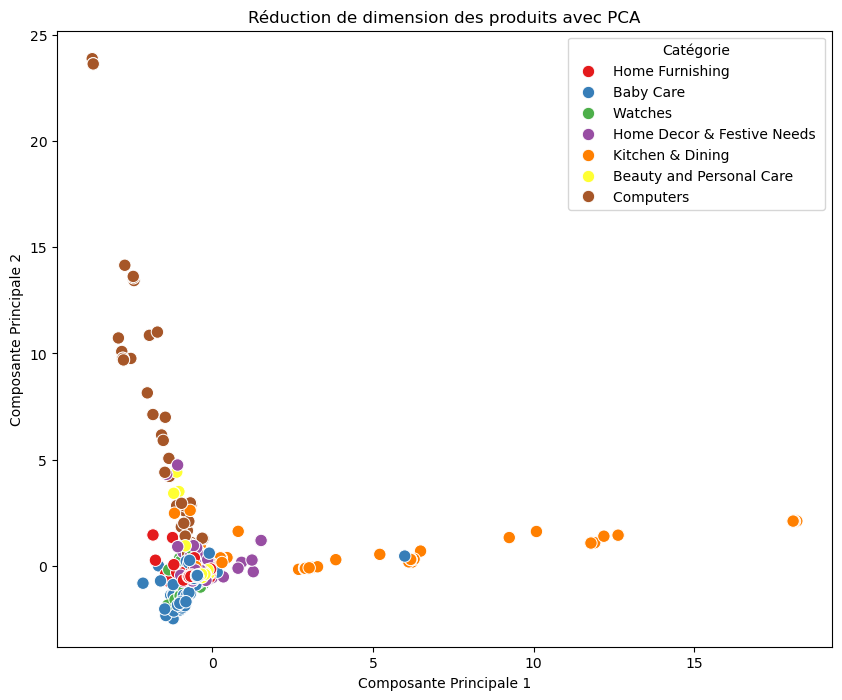

In [74]:
# 1. Séparation des features et de la cible
X = df_bow.drop(columns=['niveau_categorie_1']).values
y = df_bow['niveau_categorie_1'].values

# 2. Initialisation de PCA pour réduire la dimension à 2
pca = PCA(n_components=2)

# 3. Application de PCA 
X_pca = pca.fit_transform(X)

# 5. Conversion des résultats PCA en DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca['niveau_categorie_1'] = y

# 6. Affichage du nuage de points
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='niveau_categorie_1', palette='Set1', s=80)
plt.title("Réduction de dimension des produits avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title='Catégorie')
plt.show()

### Réduction de dimension avec t_sne

La méthode t-SNE (t-Distributed Stochastic Neighbor Embedding) est une technique de réduction de dimension pour la visualisation de données de haute dimension. Contrairement à des méthodes comme PCA, qui préservent les distances globales entre les points, t-SNE se concentre sur la conservation des relations locales. Cela signifie qu'il est particulièrement utile pour identifier des clusters et des regroupements dans des données complexes.

Dans cette section, nous allons appliquer t-SNE sur les vecteurs obtenus grâce à la méthode Bag-of-Words (BoW) afin de visualiser la distribution des produits en fonction de leurs descriptions et de leur catégorie. Ce type de représentation 2D permet d'explorer si les produits d'une même catégorie se regroupent de manière cohérente dans l'espace réduit.

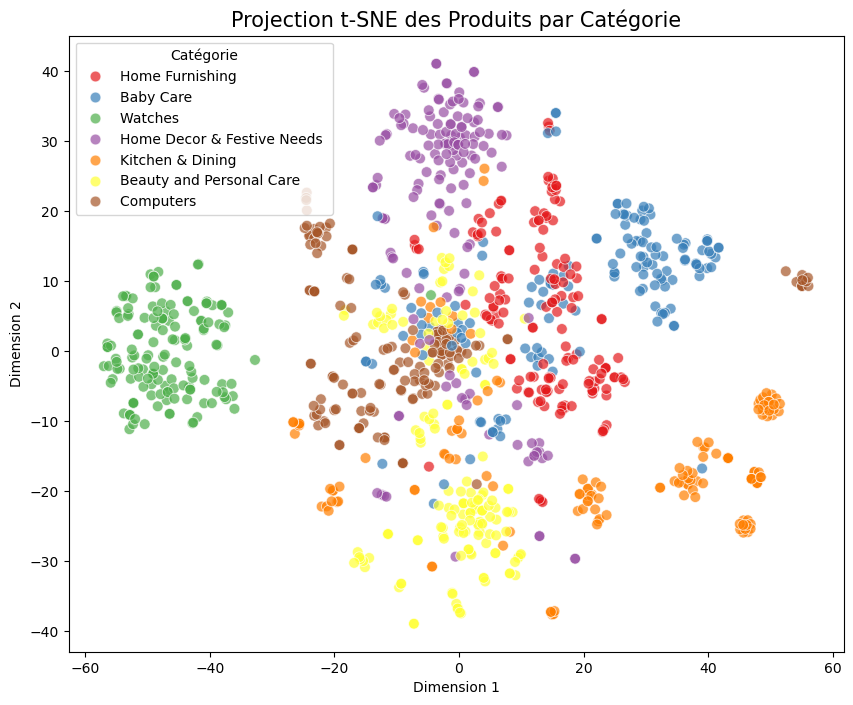

In [75]:
# Initialisation de t-SNE avec 2 dimensions pour la visualisation
tsne = TSNE(n_components=2, random_state=42)

# Réduction de dimension sur les vecteurs BoW 
X_tsne = tsne.fit_transform(X)

# 5. Création d'un DataFrame avec les résultats de t-SNE
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = y

# 6. Visualisation avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_tsne, x='TSNE-1', y='TSNE-2', hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7)

plt.title('Projection t-SNE des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

La projection t-SNE montre que les produits de certaines catégories se regroupent bien, tandis que d’autres sont plus mélangés. Cela suggère que, pour certaines catégories, le contenu textuel est suffisamment distinct pour permettre un regroupement automatique, mais que d’autres catégories partagent des descriptions similaires. 

### Application de K-Means pour le Clustering des Descriptions d'Articles

Après avoir réduit la dimensionnalité des descriptions d'articles à l'aide de techniques telles que t-SNE, nous appliquons maintenant un algorithme de clustering non supervisé, le K-Means, afin de grouper les articles en fonction de la similarité de leurs descriptions. L'algorithme K-Means vise à diviser les données en un nombre fixe de clusters, en minimisant la variance au sein de chaque cluster. En d'autres termes, il cherche à regrouper les articles qui ont des descriptions similaires dans le même cluster.

L'objectif est de tester si les descriptions des articles, transformées en vecteurs numériques, contiennent suffisamment d'information pour créer des regroupements naturels qui pourraient correspondre aux catégories des articles. Cette approche non supervisée nous permet de découvrir des patterns dans les données sans avoir besoin des catégories pré-existantes (celles fournies dans la colonne niveau_categorie_1). Une fois les clusters créés, nous pourrons comparer leur composition avec les catégories réelles des articles et évaluer la qualité de ces regroupements.

In [76]:
# Détermination du nombre de clusters (on veut autant que de vraies catégories)
n_clusters = len(df_bow['niveau_categorie_1'].unique())

# Application de K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_pred = kmeans.fit_predict(X)

# Évaluation des clusters obtenus
print("Homogeneity Score :", round(metrics.homogeneity_score(y, y_pred), 3))
print("Completeness Score :", round(metrics.completeness_score(y, y_pred), 3))
print("V-measure :", round(metrics.v_measure_score(y, y_pred), 3))
print("Adjusted Rand Index :", round(metrics.adjusted_rand_score(y, y_pred), 3))
print("Silhouette Score :", round(metrics.silhouette_score(X, y_pred), 3))

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Homogeneity Score : 0.324
Completeness Score : 0.609
V-measure : 0.423
Adjusted Rand Index : 0.149
Silhouette Score : 0.09


**Homogeneity** : mesure si chaque cluster ne contient qu’une seule catégorie — score moyen (0.32),, donc les clusters mélangent plusieurs catégories. Répond à la question "Est-ce que la catégorie est bien regroupée ?".

**Completeness** : mesure si tous les éléments d’une même catégorie sont dans le même cluster — plutôt bon (0.61), ce qui signifie que les produits d’une même catégorie sont assez bien regroupés, même si ce n’est pas parfait. Répond à la question "Est-ce que le cluster est pur ?".

**V-measure** : moyenne des deux précédentes — modérée (0.42), indiquant un compromis acceptable entre homogénéité et complétude, mais encore loin d’un clustering idéal.

**Adjusted Rand Index** : compare similarité entre clustering et catégories réelles — faible (0.15), donc les clusters s’écartent encore beaucoup des vraies classes.

**Silhouette Score** : mesure la cohésion interne des clusters — faible (0.09), les points sont mal regroupés.

Conclusion : Le modèle basé sur Bag-of-Words montre quelques signes d’organisation des catégories, mais reste insuffisant pour une séparation claire des produits. D'autres approches plus sophistiquées sont nécessaires pour améliorer la structuration des données.

## TF-IDF (Term Frequency - Inverse Document Frequency)

TF-IDF est une méthode d'encodage de texte qui permet de pondérer les mots en fonction de leur importance dans un document, tout en réduisant le poids des mots trop fréquents dans l'ensemble du corpus.
Contrairement à Bag-of-Words qui compte les mots de manière brute, TF-IDF met en avant les mots spécifiques à chaque document.

Cela permet de mieux représenter le contenu sémantique de chaque description et d'améliorer la qualité des représentations pour des tâches comme le clustering ou la classification.

In [77]:
# Initialisation du vectorizer TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Transformation du texte en vecteurs TF-IDF
X_tfidf = tfidf_vectorizer.fit_transform(df_text['texte_total'])

# Conversion en DataFrame pour visualisation et traitement
df_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Ajout de la colonne 'niveau_categorie_1' (la cible réelle)
df_tfidf['niveau_categorie_1'] = df_text['niveau_categorie_1'].values

# Affichage des premières lignes
df_tfidf.head()

,aa,aaa,aapno,aari,aarika,ability,abkl,able,abode,above,...,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel,niveau_categorie_1
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Home Furnishing
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Baby Care
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Baby Care
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Home Furnishing
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Home Furnishing


### Réduction de dimension avec PCA (Principal Component Analysis)

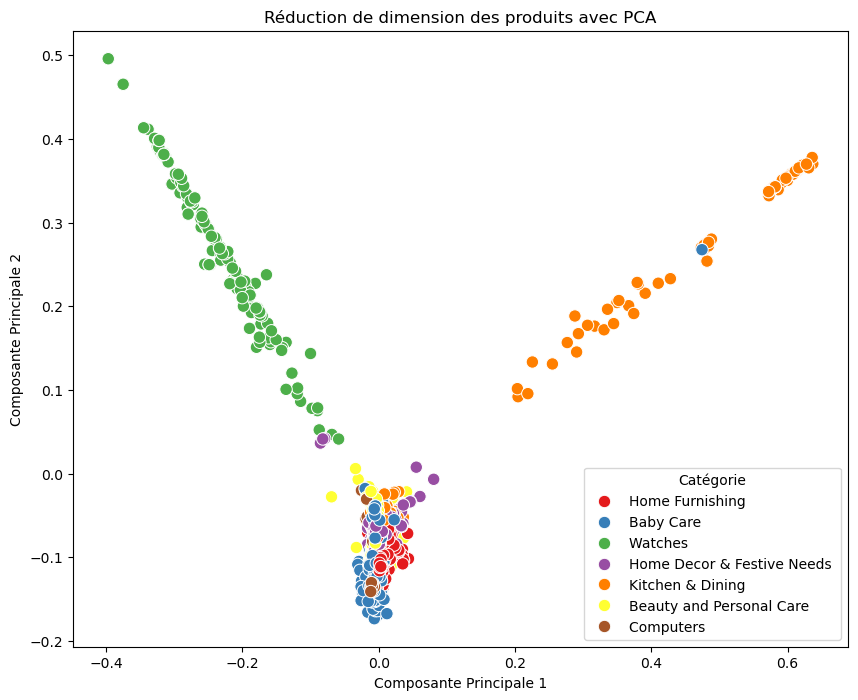

In [78]:
# 1. Séparation des features et de la cible
X = df_tfidf.drop(columns=['niveau_categorie_1']).values
y = df_tfidf['niveau_categorie_1'].values

# 2. Initialisation de PCA pour réduire la dimension à 2
pca = PCA(n_components=2)

# 3. Application de PCA sur les données
X_pca = pca.fit_transform(X)

# 4. Conversion des résultats PCA en DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca['niveau_categorie_1'] = y

# 5. Affichage du nuage de points
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='niveau_categorie_1', palette='Set1', s=80)
plt.title("Réduction de dimension des produits avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title='Catégorie')
plt.show()

### Réduction de dimension avec t_sne

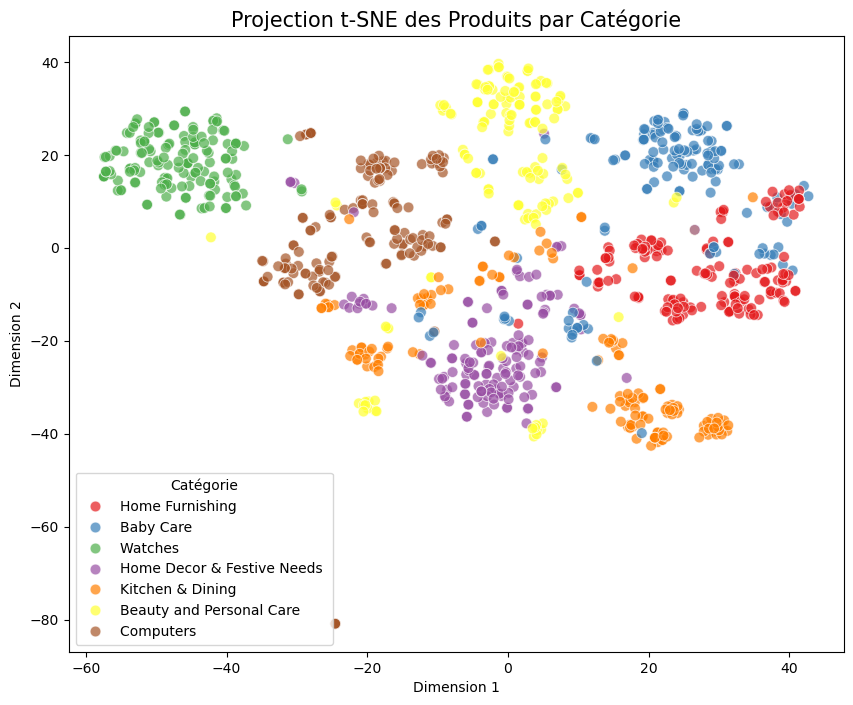

In [79]:
# 3. Initialisation de t-SNE avec 2 dimensions pour la visualisation
tsne = TSNE(n_components=2, random_state=42)

# 4. Réduction de dimension sur les vecteurs TF-IDF
X_tsne = tsne.fit_transform(X)

# 5. Création d'un DataFrame avec les résultats de t-SNE
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = y

# 6. Visualisation avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_tsne, x='TSNE-1', y='TSNE-2', hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7)

plt.title('Projection t-SNE des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

La projection t-SNE montre que les produits de certaines catégories se regroupent bien, tandis que d’autres sont plus mélangés. Cela suggère que, pour certaines catégories, le contenu textuel est suffisamment distinct pour permettre un regroupement automatique, mais que d’autres catégories partagent des descriptions similaires. 

### Application de K-Means pour le Clustering des Descriptions d'Articles

In [80]:
# Détermination du nombre de clusters (on veut autant que de vraies catégories)
n_clusters = len(df_tfidf['niveau_categorie_1'].unique())

# Application de K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_pred = kmeans.fit_predict(X)

# Évaluation des clusters obtenus
print("Homogeneity Score :", round(metrics.homogeneity_score(y, y_pred), 3))
print("Completeness Score :", round(metrics.completeness_score(y, y_pred), 3))
print("V-measure :", round(metrics.v_measure_score(y, y_pred), 3))
print("Adjusted Rand Index :", round(metrics.adjusted_rand_score(y, y_pred), 3))
print("Silhouette Score :", round(metrics.silhouette_score(X, y_pred), 3))

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Homogeneity Score : 0.503
Completeness Score : 0.589
V-measure : 0.543
Adjusted Rand Index : 0.29
Silhouette Score : 0.049


| Métriques                     | BoW             | TF-IDF          |
|:------------------------------|:----------------|:----------------|
| **Homogeneity Score**          | 0.324          | 0.503           |
| **Completeness Score**         | 0.609          | 0.589           |
| **V-measure**                  | 0.423          | 0.543           |
| **Adjusted Rand Index**        | 0.149          | 0.29            |
| **Silhouette Score**           | 0.089          | 0.049           |


Homogeneity Score
- BoW : 0.324 → Les clusters restent relativement hétérogènes, avec un mélange notable de catégories.
- TF-IDF : 0.503 → Amélioration significative : les clusters sont plus "purs", contenant majoritairement des éléments d’une même catégorie.

Completeness Score
- BoW : 0.609 → Bonne couverture des catégories, mais avec une dispersion notable sur plusieurs clusters.
- TF-IDF : 0.589 → Légère baisse, mais les catégories restent globalement bien regroupées.

V-measure
- BoW : 0.423 → Score modéré, indiquant une structuration partielle des clusters.
- TF-IDF : 0.543 → Meilleure balance entre homogénéité et complétude, traduisant une structuration plus cohérente.

Adjusted Rand Index
- BoW : 0.149 → Clustering assez loin du regroupement réel des catégories.
- TF-IDF : 0.29 → Meilleure correspondance entre clusters et catégories réelles.

Silhouette Score
- BoW : 0.089 → Cohésion des clusters assez faible.
- TF-IDF : 0.049 → Cohésion encore plus faible, indiquant des clusters moins bien séparés dans l’espace vectoriel.

Conclusion
L’utilisation de TF-IDF améliore nettement l’organisation des clusters par rapport à BoW sur la majorité des métriques de qualité. Les clusters formés reflètent mieux les catégories réelles, notamment en termes d’homogénéité et de V-measure. Cependant, la faible Silhouette Score suggère que les frontières entre clusters restent floues. Des approches plus avancées, comme les embeddings (Word2Vec, BERT...), pourraient améliorer la qualité de séparation des catégories.

# Extraction de features texte avec des embeddings

L'utilisation d'embeddings pour représenter du texte est une avancée majeure en traitement automatique du langage naturel (NLP). Contrairement aux méthodes basiques comme Bag-of-Words ou TF-IDF, les embeddings permettent de transformer chaque mot ou chaque texte en un vecteur dense de nombres réels qui capture les relations sémantiques et contextuelles entre les mots. Ces représentations vectorielles sont beaucoup plus riches et efficaces pour des tâches comme la classification, la recherche de similarité ou le clustering de documents.

## Word2Vec

Word2Vec est une approche d'embedding de mots développée par Google en 2013. Elle repose sur l’idée que les mots qui apparaissent dans des contextes similaires ont des significations similaires. Word2Vec génère des vecteurs pour chaque mot d'un corpus, et ces vecteurs sont appris à partir de grandes quantités de données textuelles. Il existe deux architectures principales pour entraîner un modèle Word2Vec :
- CBOW (Continuous Bag of Words) : Prédit un mot à partir de son contexte, c'est-à-dire les mots voisins dans une fenêtre donnée.
- Skip-gram : Prédit le contexte d'un mot donné.

Ces représentations vectorielles sont très utiles pour des tâches comme le calcul de similarité entre les mots, le clustering de termes ou même pour des modèles de classification. Le modèle Word2Vec a l'avantage d’être rapide à entraîner sur de larges corpus de texte tout en capturant efficacement les relations sémantiques entre les mots.

Dans cette section, nous allons explorer Word2Vec comme méthode d'encodage des descriptions de produits, ce qui nous permettra d'extraire des features riches en informations sémantiques pour des analyses ultérieures comme le clustering ou la classification.

Nous allons tester différentes configurations de paramètres pour le modèle Word2Vec afin de déterminer comment ces paramètres affectent la qualité du clustering. Les paramètres de Word2Vec que nous ajustons incluent :
- vector_size : La dimensionnalité des vecteurs de mots (par exemple, 100 ou 200).
- window : La taille de la fenêtre de contexte, c’est-à-dire le nombre de mots autour d'un mot cible à considérer pour déterminer le contexte.
- min_count : Le nombre minimum d’occurrences qu’un mot doit avoir pour être inclus dans le vocabulaire du modèle.

Dans le code suivant, nous allons :
- Tokeniser les descriptions de produits pour les transformer en listes de mots.
- Entraîner le modèle Word2Vec avec différentes configurations de paramètres.
- Calculer des vecteurs moyens pour chaque description de produit à partir des embeddings générés par Word2Vec.
- Appliquer K-Means pour effectuer un clustering des produits en fonction de leurs vecteurs moyens.
- Évaluer la qualité du clustering en utilisant des métriques telles que le Silhouette Score, le Homogeneity Score, le Completeness Score, le V-measure et le Adjusted Rand Index.

In [81]:
random.seed(42) # Pour garantir la reproductibilité des résultats liés à random
np.random.seed(42) # Pour garantir la reproductibilité des opérations aléatoires NumPy

# Tokenisation du texte total (division en liste de mots pour chaque description)
sentences = [texte.split() for texte in df_text['texte_total']]

# Fonction pour obtenir le vecteur moyen d'un texte
def vectoriser_texte(texte, modele):
    """
    Cette fonction prend un texte et un modèle Word2Vec, 
    puis renvoie le vecteur moyen des mots du texte.
    """
    mots = texte.split()  # On divise le texte en mots
    vecteurs_valides = [modele.wv[mot] for mot in mots if mot in modele.wv]  # On récupère les vecteurs pour chaque mot du texte
    if not vecteurs_valides:  # Si aucun mot n'est dans le vocabulaire du modèle
        return np.zeros(modele.vector_size)  # Retourner un vecteur nul
    return np.mean(vecteurs_valides, axis=0)  # Retourner la moyenne des vecteurs

# Grille de paramètres pour Word2Vec
param_grid_w2v = {
    'vector_size': [100, 200],  # Dimension du vecteur
    'window': [5, 10],  # Taille de la fenêtre de contexte
    'min_count': [1, 2],  # Fréquence minimale des mots pour être inclus dans le vocabulaire
}

# Liste pour stocker les résultats
resultats = []

# GridSearch pour Word2Vec
for w2v_params in ParameterGrid(param_grid_w2v):
    # Entraînement du modèle Word2Vec avec les paramètres actuels
    modele_w2v = Word2Vec(sentences=sentences, **w2v_params, workers=1, seed=42)
    
    # Transformation du texte en vecteurs moyens
    X_w2v = np.vstack(df_text['texte_total'].apply(lambda x: vectoriser_texte(x, modele_w2v)))
    
    # Application de K-Means sur les vecteurs générés par Word2Vec
    kmeans = KMeans(n_clusters=len(df_text['niveau_categorie_1'].unique()), random_state=42)
    y_pred = kmeans.fit_predict(X_w2v)
    
    # Calcul des scores d'évaluation pour le clustering
    homogeneity = homogeneity_score(df_text['niveau_categorie_1'], y_pred)  # Score d'homogénéité
    completeness = completeness_score(df_text['niveau_categorie_1'], y_pred)  # Score de complétude
    v_measure = v_measure_score(df_text['niveau_categorie_1'], y_pred)  # Score V-measure
    ari = adjusted_rand_score(df_text['niveau_categorie_1'], y_pred)  # Score Adjusted Rand Index
    silhouette = silhouette_score(X_w2v, y_pred)  # Silhouette Score
    
    # Enregistrement des résultats avec les paramètres et les scores
    resultats.append({
        'vector_size': w2v_params['vector_size'],
        'window': w2v_params['window'],
        'min_count': w2v_params['min_count'],
        'Homogeneity Score': homogeneity,
        'Completeness Score': completeness,
        'V-measure': v_measure,
        'Adjusted Rand Index': ari,
        'Silhouette Score': silhouette
    })

# Conversion des résultats en DataFrame pour affichage
df_resultats = pd.DataFrame(resultats)
# Affichage des résultats
df_resultats

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

,vector_size,window,min_count,Homogeneity Score,Completeness Score,V-measure,Adjusted Rand Index,Silhouette Score
0,100,5,1,0.267006,0.300623,0.282819,0.113773,0.374694
1,100,10,1,0.357011,0.384275,0.370142,0.228327,0.374778
2,200,5,1,0.247554,0.268354,0.257535,0.147293,0.407229
3,200,10,1,0.333671,0.366213,0.349185,0.205617,0.399548
4,100,5,2,0.247039,0.270758,0.258356,0.119044,0.340662
5,100,10,2,0.364379,0.398916,0.380866,0.234243,0.373953
6,200,5,2,0.253500,0.291646,0.271238,0.103417,0.395099
7,200,10,2,0.335801,0.367564,0.350965,0.207126,0.390828


En se basant sur l'Adjusted Rand Index (ARI), qui mesure la qualité du regroupement en tenant compte des vraies étiquettes de catégorie, nous observons que les meilleurs résultats sont obtenus avec :
- vector_size = 100, window = 10, min_count = 1 → ARI = 0.228
- vector_size = 100, window = 10, min_count = 2 → ARI = 0.234

Ces deux configurations donnent des résultats très proches, avec un léger avantage pour min_count = 2 (ARI = 0.234), ce qui montre que ignorer les mots très rares (min_count plus élevé) peut légèrement améliorer la qualité du regroupement.

Concernant le paramètre window, on remarque que window = 10 donne systématiquement un meilleur ARI que window = 5, suggérant que prendre en compte un contexte plus large autour des mots améliore la qualité des vecteurs pour la tâche de clustering.

À l'inverse, augmenter la taille des vecteurs (vector_size = 200) ne semble pas améliorer l'ARI, et peut même le dégrader légèrement par rapport à vector_size = 100.

En résumé :<br>
➡️ Meilleure configuration : vector_size = 100, window = 10, min_count = 2<br>
➡️ Paramètres favorables : contexte plus large (window élevé), filtrage léger des mots rares (min_count = 2), vector_size modéré (100).

Afin d'optimiser encore la qualité des embeddings et du clustering, il serait pertinent d'affiner les hyperparamètres autour de la meilleure configuration identifiée.<br>
Concrètement, on pourrait tester des valeurs proches de vector_size = 100, par exemple en variant la dimension des vecteurs entre 90 et 110.<br>
De même, la taille de la fenêtre de contexte pourrait être affinée autour de 10 (par exemple entre 9 et 11), et le seuil minimal d’apparition des mots (min_count) autour de 2.<br>
Cet affinage local permettrait de rechercher un optimum plus précis et d'améliorer encore la qualité du clustering, en continuant de maximiser l'Adjusted Rand Index (ARI).

Approche progressive d'optimisation :
Ce processus d'optimisation par recherche locale est classique en machine learning : après avoir identifié des tendances générales (par exemple : un window plus grand est meilleur, un min_count léger est préférable), on explore plus finement autour des meilleurs paramètres pour ajuster au mieux les performances du modèle.

In [82]:
# Grille de paramètres pour Word2Vec
param_grid_w2v = {
    'vector_size': [80, 90, 100, 110, 120],
    'window': [8, 9, 10, 11, 12],
    'min_count': [2, 3]
}

# Liste pour stocker les résultats
resultats = []

# GridSearch pour Word2Vec
for w2v_params in ParameterGrid(param_grid_w2v):
    # Entraînement du modèle Word2Vec
    modele_w2v = Word2Vec(sentences=sentences, **w2v_params, workers=1, seed=42)
    
    # Transformation du texte en vecteurs moyens
    X_w2v = np.vstack(df_text['texte_total'].apply(lambda x: vectoriser_texte(x, modele_w2v)))
    
    # Clustering avec K-Means
    kmeans = KMeans(n_clusters=len(df_text['niveau_categorie_1'].unique()), random_state=42)
    y_pred = kmeans.fit_predict(X_w2v)
    
    # Calcul des scores
    homogeneity = homogeneity_score(df_text['niveau_categorie_1'], y_pred)
    completeness = completeness_score(df_text['niveau_categorie_1'], y_pred)
    v_measure = v_measure_score(df_text['niveau_categorie_1'], y_pred)
    ari = adjusted_rand_score(df_text['niveau_categorie_1'], y_pred)
    silhouette = silhouette_score(X_w2v, y_pred)
    
    # Stockage des résultats
    resultats.append({
        'vector_size': w2v_params['vector_size'],
        'window': w2v_params['window'],
        'min_count': w2v_params['min_count'],
        'Homogeneity Score': homogeneity,
        'Completeness Score': completeness,
        'V-measure': v_measure,
        'Adjusted Rand Index': ari,
        'Silhouette Score': silhouette
    })

# Conversion en DataFrame
df_resultats = pd.DataFrame(resultats)

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

In [83]:
# Recherche de la meilleure configuration basée sur l'Adjusted Rand Index
meilleure_config = df_resultats.loc[df_resultats['Adjusted Rand Index'].idxmax()]

# Affichage de la meilleure configuration
print("Meilleure configuration basée sur l'ARI :")
print(meilleure_config)

Meilleure configuration basée sur l'ARI :
vector_size            80.000000
window                 12.000000
min_count               3.000000
Homogeneity Score       0.469077
Completeness Score      0.519022
V-measure               0.492787
Adjusted Rand Index     0.312819
Silhouette Score        0.372264
Name: 29, dtype: float64


Après affinage de la grille, la configuration optimale est obtenue pour **vector_size = 80, window = 12 et min_count = 3, avec une ARI de 0.313**.

| Métriques                     | BoW             | TF-IDF          | Word2Vec |
|:------------------------------|:----------------|:----------------|:---------|
| **Homogeneity Score**          | 0.324          | 0.503           | 0.469    |
| **Completeness Score**         | 0.609          | 0.589           | 0.519    |
| **V-measure**                  | 0.423          | 0.543           | 0.493    |
| **Adjusted Rand Index**        | 0.149          | 0.29            | 0.313    |
| **Silhouette Score**           | 0.089          | 0.049           | 0.372    |


Word2Vec obtient le meilleur ARI (0.313), ce qui signifie que ses clusters correspondent légèrement mieux aux catégories réelles que ceux issus de TF-IDF (ARI = 0.29).

TF-IDF reste cependant très performant, avec une meilleure homogénéité (0.503 vs 0.469) et une v-mesure plus élevée (0.543 vs 0.493), indiquant une bonne qualité globale des clusters.

BoW est nettement moins performant sur toutes les métriques supervisées, ce qui confirme ses limites pour ce type de données.

Le Silhouette Score est nettement plus élevé pour Word2Vec (0.372), ce qui suggère que ses clusters sont aussi plus compacts et bien séparés, contrairement à TF-IDF (0.049) et BoW (0.089).
Toutefois, comme le Silhouette Score ne prend pas en compte les labels réels, il est moins pertinent pour évaluer la correspondance avec les catégories.

Conclusion : 
L’objectif principal étant d’obtenir des clusters qui reflètent au mieux les catégories réelles, l’Adjusted Rand Index (ARI) est la métrique la plus fiable. Sur ce critère, Word2Vec offre la meilleure correspondance, suivi de près par TF-IDF. BoW reste en retrait.

## BERT

Après avoir exploré des méthodes classiques de vectorisation comme BoW, TF-IDF, et des modèles de type Word2Vec, nous passons maintenant à une approche plus récente et puissante : BERT (Bidirectional Encoder Representations from Transformers).
Développé par Google en 2018, BERT a marqué une avancée majeure en NLP grâce à sa capacité à comprendre le contexte d’un mot à la fois à gauche et à droite dans une phrase.

Contrairement aux modèles précédents qui génèrent un seul vecteur par mot, BERT produit des représentations contextuelles riches : le vecteur associé à un mot varie en fonction de son contexte. Cela permet de mieux capturer le sens réel des phrases et des descriptions de produits.

Dans cette section, nous allons utiliser un modèle pré-entraîné BERT pour encoder les descriptions de produits, puis appliquer la même méthode de clustering (K-Means) que précédemment.
L’objectif est d’évaluer si cette approche permet de mieux regrouper les produits selon leurs catégories en comparaison avec les autres méthodes de vectorisation.

In [84]:
def extraire_embeddings_bert(
    df_text, colonne_texte='texte_total',
    colonne_cible='niveau_categorie_1',
    nom_modele='distilbert-base-uncased',
    longueur_max=512):
    """
    Encode chaque texte d'un DataFrame en embeddings BERT et retourne un nouveau DataFrame
    avec les embeddings et la colonne cible.

    Args:
        df_text (pd.DataFrame): DataFrame contenant les textes et la cible.
        colonne_texte (str): nom de la colonne texte à encoder.
        colonne_cible (str): nom de la colonne cible.
        nom_modele (str): nom du modèle BERT à utiliser.
        longueur_max (int): longueur maximale des séquences tokenisées.

    Returns:
        pd.DataFrame: DataFrame avec les colonnes des embeddings BERT + colonne cible.
    """
    # Charger le tokenizer et le modèle BERT
    tokenizer = AutoTokenizer.from_pretrained(nom_modele)
    modele = AutoModel.from_pretrained(nom_modele)
    modele.eval()  # Mode évaluation

    embeddings = []
    for texte in tqdm(df_text[colonne_texte], desc="Encodage BERT"):
        # Tokenisation et encodage
        entrees = tokenizer(texte, return_tensors='pt', truncation=True, padding=True, max_length=longueur_max)
        with torch.no_grad():
            sorties = modele(**entrees)
            # On prend le vecteur [CLS] (premier token) comme représentation globale du texte
            cls_embedding = sorties.last_hidden_state[:, 0, :].squeeze().numpy()
        embeddings.append(cls_embedding)
    X_bert = np.vstack(embeddings)

    # Création du DataFrame final
    noms_colonnes = [f'bert_{i}' for i in range(X_bert.shape[1])]
    df_bert = pd.DataFrame(X_bert, columns=noms_colonnes)
    df_bert[colonne_cible] = df_text[colonne_cible].values
    return df_bert

df_bert = extraire_embeddings_bert(df_text)

Encodage BERT: 100%|███████████████████████████████████████████████████████████████| 1050/1050 [01:11<00:00, 14.63it/s]


In [85]:
df_bert.head()

,bert_0,bert_1,bert_2,bert_3,bert_4,bert_5,bert_6,bert_7,bert_8,bert_9,...,bert_759,bert_760,bert_761,bert_762,bert_763,bert_764,bert_765,bert_766,bert_767,niveau_categorie_1
0,-0.413730,-0.182377,0.185407,-0.156040,0.125427,-0.124805,0.405645,-0.169302,-0.186753,-0.383025,...,-0.465223,0.055451,-0.093613,0.102062,-0.179097,-0.213935,-0.047090,0.171481,-0.047877,Home Furnishing
1,-0.219051,-0.223007,-0.078664,-0.134804,-0.085724,-0.138071,0.165028,0.058791,-0.310654,-0.056828,...,-0.296454,0.129220,-0.106837,0.172542,0.179084,-0.195442,-0.326640,0.235371,0.178903,Baby Care
2,-0.330725,0.023651,0.046389,-0.162566,-0.056189,-0.005823,0.162669,0.004917,-0.158803,-0.133834,...,-0.489698,0.091592,0.102495,0.244061,0.121510,-0.204454,-0.112649,0.095234,0.042120,Baby Care
3,-0.275877,-0.251891,-0.169681,-0.271069,0.094477,-0.069971,0.038621,0.215597,-0.428754,-0.152587,...,-0.365695,0.173622,-0.147507,0.316594,0.022497,-0.265174,-0.156064,0.423984,-0.084525,Home Furnishing
4,-0.320483,-0.248083,-0.286477,-0.195752,0.051553,-0.087762,0.102737,0.223687,-0.210926,-0.233733,...,-0.205186,0.210853,-0.042059,0.385050,-0.012158,-0.289506,-0.070431,0.410303,-0.198316,Home Furnishing


### Réduction de dimension avec PCA (Principal Component Analysis)

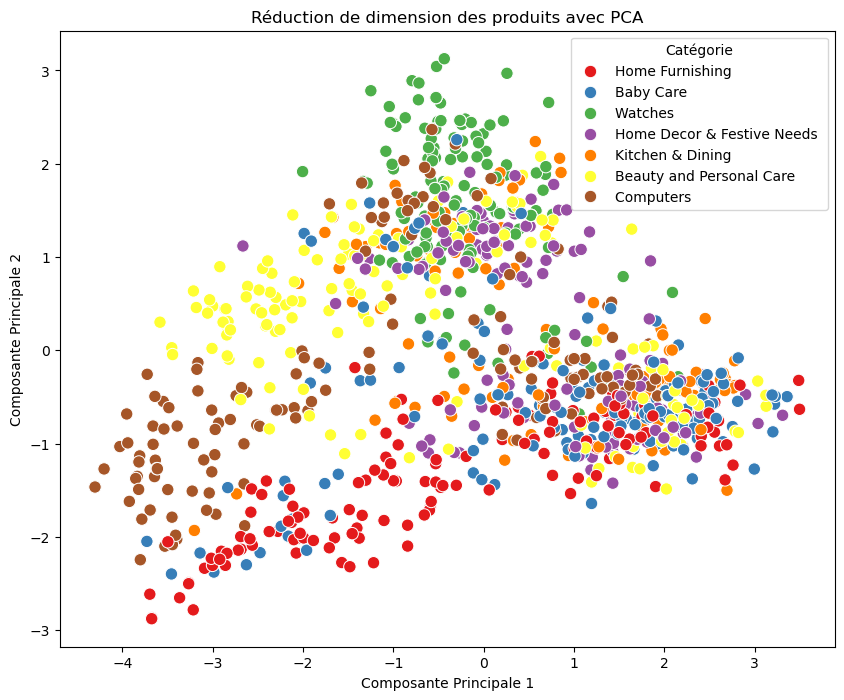

In [86]:
# 1. Séparation des features et de la cible
X = df_bert.drop(columns=['niveau_categorie_1']).values
y = df_bert['niveau_categorie_1'].values

# 2. Initialisation de PCA pour réduire la dimension à 2
pca = PCA(n_components=2)

# 3. Application de PCA sur les données 
X_pca = pca.fit_transform(X)

# 4. Conversion des résultats PCA en DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca['niveau_categorie_1'] = y

# 5. Affichage du nuage de points
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='niveau_categorie_1', palette='Set1', s=80)
plt.title("Réduction de dimension des produits avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title='Catégorie')
plt.show()

### Réduction de dimension avec t_sne

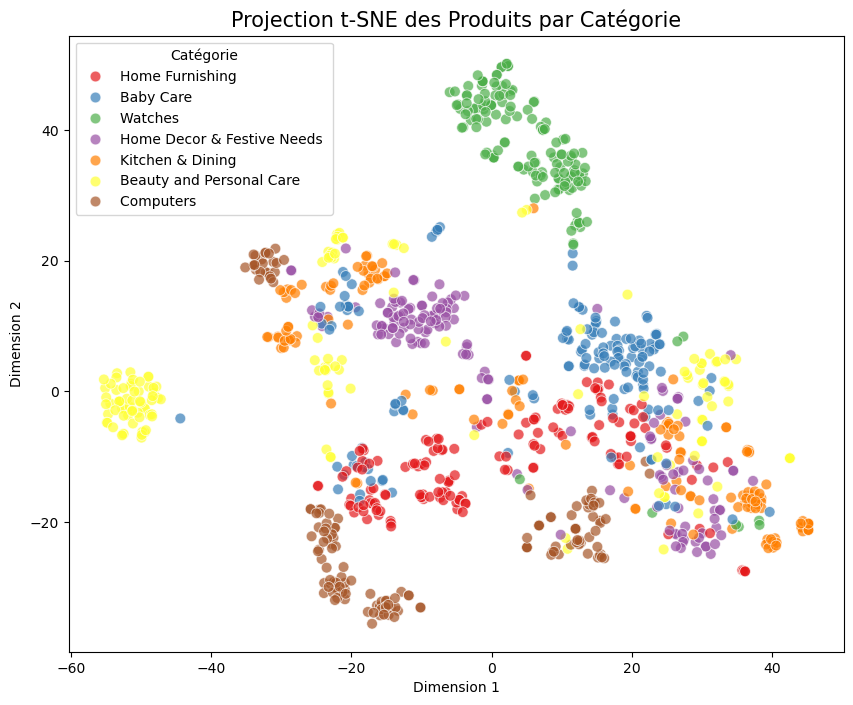

In [87]:
# Initialisation de t-SNE avec 2 dimensions pour la visualisation
tsne = TSNE(n_components=2, random_state=42)

# Réduction de dimension sur les embeddings 
X_tsne = tsne.fit_transform(X)

# Création d'un DataFrame avec les résultats de t-SNE
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = y

# Visualisation avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_tsne, x='TSNE-1', y='TSNE-2', hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7)
plt.title('Projection t-SNE des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

La projection t-SNE montre que les produits de certaines catégories se regroupent bien, tandis que d’autres sont plus mélangés. Cela suggère que, pour certaines catégories, le contenu textuel est suffisamment distinct pour permettre un regroupement automatique, mais que d’autres catégories partagent des descriptions similaires. 

### Application de K-Means pour le Clustering des Descriptions d'Articles

In [88]:
# Détermination du nombre de clusters (on veut autant que de vraies catégories)
n_clusters = len(df_bert['niveau_categorie_1'].unique())

# Application de K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_pred = kmeans.fit_predict(X)

# Évaluation des clusters obtenus
print("Homogeneity Score :", round(metrics.homogeneity_score(y, y_pred), 3))
print("Completeness Score :", round(metrics.completeness_score(y, y_pred), 3))
print("V-measure :", round(metrics.v_measure_score(y, y_pred), 3))
print("Adjusted Rand Index :", round(metrics.adjusted_rand_score(y, y_pred), 3))
print("Silhouette Score :", round(metrics.silhouette_score(X, y_pred), 3))

Homogeneity Score : 0.372
Completeness Score : 0.39
V-measure : 0.381
Adjusted Rand Index : 0.263
Silhouette Score : 0.111


C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


| Métriques                     | BoW             | TF-IDF          | Word2Vec | BERT   |
|:------------------------------|:----------------|:----------------|:---------|:-------|
| **Homogeneity Score**          | 0.324          | 0.503           | 0.469    | 0.372  |
| **Completeness Score**         | 0.609          | 0.589           | 0.519    | 0.39   |
| **V-measure**                  | 0.423          | 0.543           | 0.493    | 0.381  |
| **Adjusted Rand Index**        | 0.149          | 0.29            | 0.313    | 0.263  |
| **Silhouette Score**           | 0.089          | 0.049           | 0.372    | 0.111  |

Word2Vec reste le meilleur pour aligner les clusters avec les catégories réelles, selon l’ARI.

## USE (Universal Sentence Encoder)

Le Universal Sentence Encoder (USE), développé par Google, est un modèle avancé de traitement du langage naturel conçu pour transformer des phrases, des paragraphes ou de courts textes en vecteurs numériques de haute dimension appelés embeddings. Contrairement aux méthodes classiques qui produisent des représentations pour chaque mot (comme Word2Vec), le USE génère une représentation globale pour l’ensemble de la phrase ou du texte, capturant ainsi le sens et le contexte de manière beaucoup plus fine et universelle.

Le USE s’appuie sur un réseau de neurones profond pré-entraîné sur de larges corpus variés (Wikipedia, forums, pages de questions-réponses, etc.), ce qui lui permet de produire des vecteurs de 512 dimensions qui résument la signification sémantique des textes, quelle que soit leur longueur ou leur structure. Cette approche permet d’obtenir des embeddings efficaces pour de nombreuses tâches NLP : classification de texte, recherche de similarité sémantique, regroupement (clustering), ou encore détection de paraphrases.

L’un des atouts majeurs du USE est sa capacité à fournir des représentations universelles, adaptées à des textes de différentes langues et contextes, sans nécessiter de modèles spécifiques à chaque langue ou domaine. Grâce à cette généralisation, le USE est devenu une référence pour toutes les applications nécessitant une compréhension globale du sens des phrases ou des documents.

En résumé, le Universal Sentence Encoder marque une évolution majeure par rapport aux embeddings traditionnels, en offrant une solution robuste, polyvalente et performante pour encoder des textes entiers en vecteurs utilisables dans de nombreuses applications de traitement automatique du langage naturel

In [89]:
# Chargement du modèle USE (version anglaise)
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Encodage des textes (USE attend une liste de chaînes de caractères)
embeddings = use_model(df_text['texte_total'].tolist()).numpy()

# Création d'un DataFrame pour les embeddings
df_use = pd.DataFrame(embeddings, columns=[f'use_{i}' for i in range(embeddings.shape[1])])

# Ajout de la colonne cible
df_use['niveau_categorie_1'] = df_text['niveau_categorie_1'].values

# Vérification
df_use.head()

,use_0,use_1,use_2,use_3,use_4,use_5,use_6,use_7,use_8,use_9,...,use_503,use_504,use_505,use_506,use_507,use_508,use_509,use_510,use_511,niveau_categorie_1
0,-0.052882,-0.051532,0.023950,0.039956,-0.034529,0.052840,-0.033563,0.041807,-0.032905,0.037524,...,-0.054352,-0.053537,0.054122,-0.017485,-0.048840,0.047304,0.025732,0.044565,-0.000586,Home Furnishing
1,-0.050620,0.012914,-0.032148,0.012164,0.054855,0.059608,0.039246,-0.038566,-0.021576,-0.010699,...,-0.055670,-0.059195,-0.049089,-0.027801,-0.053858,-0.006506,0.030642,0.053966,0.024759,Baby Care
2,-0.054620,-0.039855,-0.034960,0.050811,0.051087,0.053937,0.053571,0.032794,-0.051707,0.053043,...,-0.054871,-0.054345,0.021545,0.052336,-0.053834,0.040858,0.041637,-0.010654,-0.024354,Baby Care
3,-0.054679,-0.047583,0.052055,0.053737,0.054666,0.015891,0.014438,-0.006364,-0.027545,0.000807,...,-0.054711,0.022931,0.053370,-0.050139,-0.052291,0.050894,0.042725,-0.025775,-0.054131,Home Furnishing
4,-0.052496,-0.038420,0.049376,0.049231,0.052511,0.006086,-0.022132,0.044488,-0.004904,-0.014340,...,-0.052524,-0.050514,0.049137,-0.052481,-0.052108,0.052381,0.052369,-0.031674,-0.048059,Home Furnishing


### Réduction de dimension avec PCA (Principal Component Analysis)

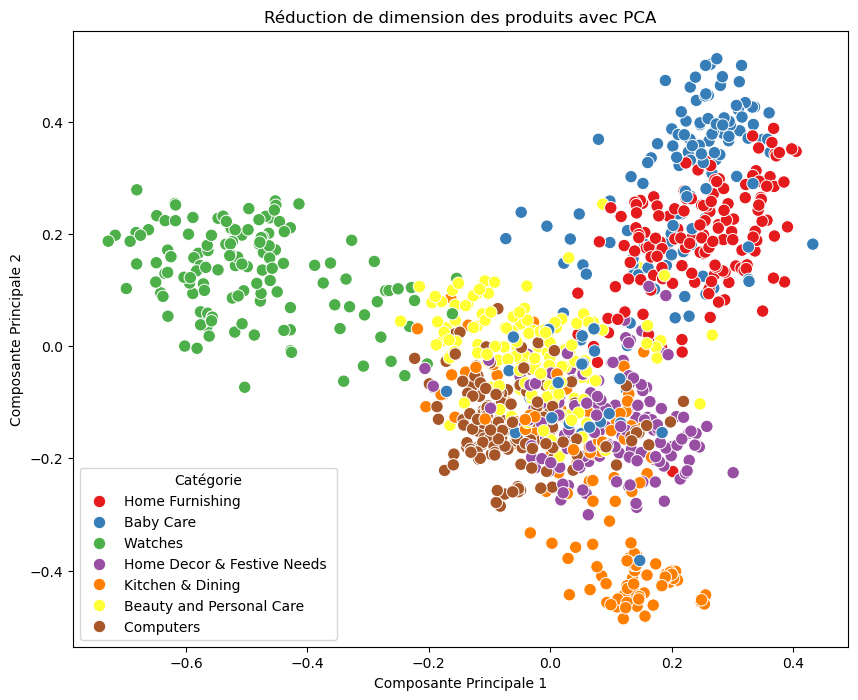

In [90]:
# 1. Séparation des features et de la cible
X = df_use.drop(columns=['niveau_categorie_1']).values
y = df_use['niveau_categorie_1'].values

# 2. Initialisation de PCA pour réduire la dimension à 2
pca = PCA(n_components=2)

# 3. Application de PCA 
X_pca = pca.fit_transform(X)

# 5. Conversion des résultats PCA en DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca['niveau_categorie_1'] = y

# 6. Affichage du nuage de points
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='niveau_categorie_1', palette='Set1', s=80)
plt.title("Réduction de dimension des produits avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title='Catégorie')
plt.show()

### Réduction de dimension avec t_sne

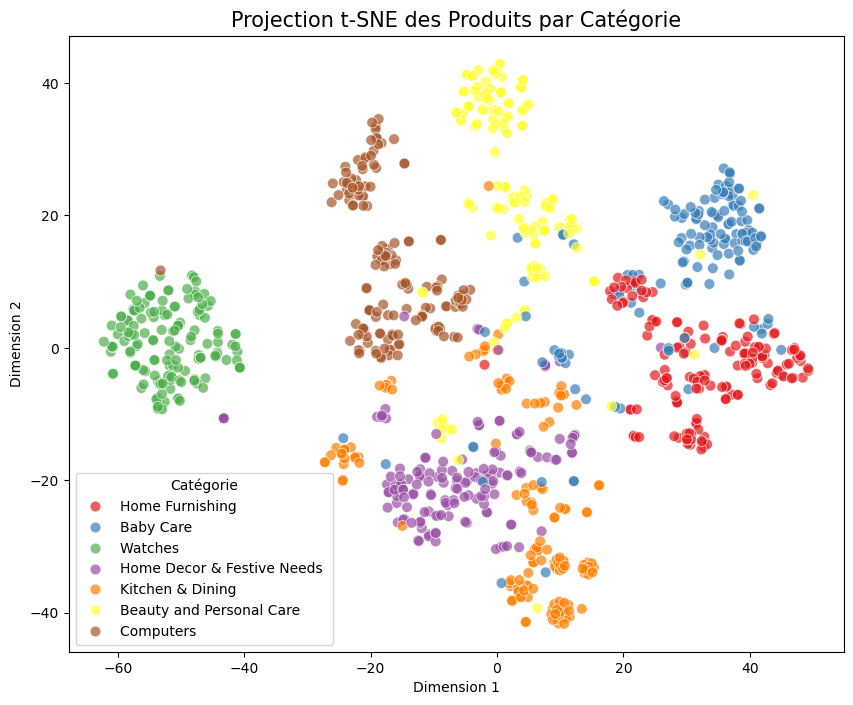

In [91]:
# 3. Initialisation de t-SNE avec 2 dimensions pour la visualisation
tsne = TSNE(n_components=2, random_state=42)

# 4. Réduction de dimension sur les embeddings
X_tsne = tsne.fit_transform(X)

# 5. Création d'un DataFrame avec les résultats de t-SNE
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = y

# 6. Visualisation avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_tsne, x='TSNE-1', y='TSNE-2', hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7)

plt.title('Projection t-SNE des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

La projection t-SNE montre que les produits de certaines catégories se regroupent bien, tandis que d’autres sont plus mélangés. Cela suggère que, pour certaines catégories, le contenu textuel est suffisamment distinct pour permettre un regroupement automatique, mais que d’autres catégories partagent des descriptions similaires. 

### Application de K-Means pour le Clustering des Descriptions d'Articles

In [92]:
# Détermination du nombre de clusters (on veut autant que de vraies catégories)
n_clusters = len(df_use['niveau_categorie_1'].unique())

# Application de K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_pred = kmeans.fit_predict(X)

# Évaluation des clusters obtenus
print("Homogeneity Score :", round(metrics.homogeneity_score(y, y_pred), 3))
print("Completeness Score :", round(metrics.completeness_score(y, y_pred), 3))
print("V-measure :", round(metrics.v_measure_score(y, y_pred), 3))
print("Adjusted Rand Index :", round(metrics.adjusted_rand_score(y, y_pred), 3))
print("Silhouette Score :", round(metrics.silhouette_score(X, y_pred), 3))

Homogeneity Score : 0.577
Completeness Score : 0.618
V-measure : 0.597
Adjusted Rand Index : 0.457
Silhouette Score : 0.093


C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


| Métriques                     | BoW             | TF-IDF          | Word2Vec | BERT   | USE    |
|:------------------------------|:----------------|:----------------|:---------|:-------|:-------|
| **Homogeneity Score**          | 0.324          | 0.503           | 0.469    | 0.372  | 0.577  |
| **Completeness Score**         | 0.609          | 0.589           | 0.519    | 0.39   | 0.618  |
| **V-measure**                  | 0.423          | 0.543           | 0.493    | 0.381  | 0.597  |
| **Adjusted Rand Index**        | 0.149          | 0.29            | 0.313    | 0.263  | 0.457  |
| **Silhouette Score**           | 0.089          | 0.049           | 0.372    | 0.111  | 0.093  |

USE est le grand gagnant sur la plupart des scores de clustering :

- Il obtient les meilleurs résultats en homogeneity, completeness, v-measure et ARI.
- Cela signifie que les clusters trouvés par KMeans avec les embeddings USE sont les plus proches des vraies catégories.

Parmi toutes les méthodes testées, **le Universal Sentence Encoder (USE) offre les meilleurs résultats pour le clustering non supervisé de nos descriptions produits**, dépassant aussi bien les approches classiques (BoW, TF-IDF) que les embeddings avancés (Word2Vec, BERT). Cela confirme l’intérêt d’utiliser des modèles pré-entraînés sur la similarité sémantique globale pour ce type de tâche.

Nous allons à présent tenter d’optimiser davantage l’utilisation du Universal Sentence Encoder, qui s’est révélé être la méthode la plus performante jusqu’à présent.

# Optimisation du clustering basé sur Universal Sentence Encoder

Après avoir comparé différentes méthodes d’encodage de texte et constaté la supériorité du Universal Sentence Encoder (USE) pour le clustering non supervisé de nos descriptions produits, nous allons à présent explorer des pistes d’optimisation afin d’améliorer encore la qualité des clusters obtenus.

Dans cette section, nous allons notamment :

- Réduire la dimension des embeddings USE à l’aide de la méthode PCA (Principal Component Analysis), afin de concentrer l’information la plus pertinente et de faciliter la séparation des clusters lors du clustering non supervisé.
- Tester différentes méthodes d’initialisation et de paramétrage de K-Means (comme k-means++, nombre d’itérations, etc.), pour garantir la robustesse et la stabilité des résultats.

Les embeddings générés par USE ont une dimensionnalité élevée, ce qui peut rendre le processus de clustering plus difficile. L’application de la méthode PCA (Principal Component Analysis) nous permettra de réduire cette dimensionnalité tout en conservant l’information la plus pertinente. Cela devrait faciliter la séparation des clusters et améliorer la performance du clustering non supervisé en réduisant le bruit et en concentrant les informations les plus significatives dans un espace de dimension plus faible.

In [93]:
pca = PCA().fit(X)
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
print(f"Nombre de composantes pour expliquer 90% de la variance : {n_components_90}")

Nombre de composantes pour expliquer 90% de la variance : 147


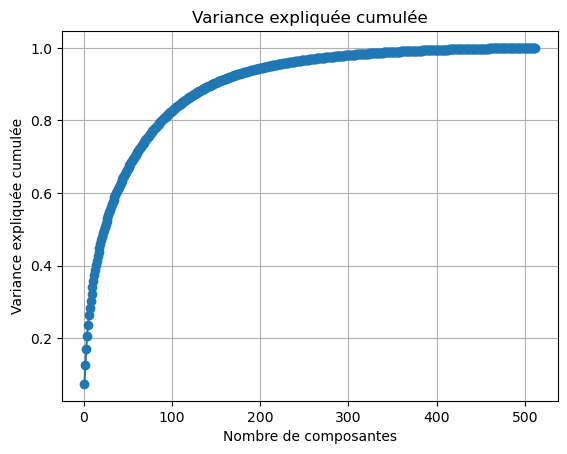

In [94]:
# On affiche la variance expliquée par chaque composante
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker='o')
plt.title('Variance expliquée cumulée')
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée cumulée')
plt.grid(True)
plt.show()

In [95]:
# Fixer les seeds pour garantir la reproductibilité
np.random.seed(42)
random.seed(42)

# Vraies étiquettes (catégories d’origine)
labels_true = df_use['niveau_categorie_1'].values

# Pipeline combinant PCA pour réduction de dimension et KMeans pour clustering
pipe = Pipeline([
    ('pca', PCA(random_state=42)),
    ('kmeans', KMeans(random_state=42))
])

# Grille des hyperparamètres à tester
param_grid = {
    'pca__n_components': [70, 80, 90, 100, 110, 120, 130, 140, 150],  # Nombre de composantes principales
    'kmeans__init': ['k-means++','random'],                           # Méthode d’initialisation de KMeans
    'kmeans__max_iter': [50, 100, 300, 500, 1000],                    # Nombre max d’itérations
    'kmeans__n_init': [10, 50],                                       # Nombre de runs KMeans indépendants
    'kmeans__n_clusters': [7]                                         # Nombre de clusters (fixé ici à 7)
}

results = []

# Boucle sur toutes les combinaisons de la grille
for params in ParameterGrid(param_grid):
    pipe.set_params(**params)                 # Appliquer les paramètres courants
    pipe.fit(X)                               # Entraîner le pipeline (PCA + KMeans)
    X_reduced = pipe.named_steps['pca'].transform(X)      # Données projetées en PCA
    labels_pred = pipe.named_steps['kmeans'].labels_      # Clusters prédits par KMeans
    
    # Évaluation des performances du clustering
    results.append({
        **params,
        'homogeneity': homogeneity_score(labels_true, labels_pred),     
        'completeness': completeness_score(labels_true, labels_pred),   
        'v_measure': v_measure_score(labels_true, labels_pred),         
        'adjusted_rand': adjusted_rand_score(labels_true, labels_pred), 
        'silhouette': silhouette_score(X_reduced, labels_pred)          
    })

# Conversion des résultats en DataFrame
results_df = pd.DataFrame(results)

# Identifier la combinaison ayant le meilleur score ARI (Adjusted Rand Index)
best_idx = results_df['adjusted_rand'].idxmax()
best_row = results_df.loc[best_idx]

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

In [96]:
print("Meilleure combinaison pour optimiser l'ARI' :")
print(best_row)

Meilleure combinaison pour optimiser l'ARI' :
kmeans__init          k-means++
kmeans__max_iter             50
kmeans__n_clusters            7
kmeans__n_init               10
pca__n_components           130
homogeneity            0.689757
completeness           0.712514
v_measure              0.700951
adjusted_rand          0.622848
silhouette             0.102478
Name: 6, dtype: object


| Métriques                     | BoW             | TF-IDF          | Word2Vec | BERT   | USE    |  USE + ACP  |
|:------------------------------|:----------------|:----------------|:---------|:-------|:-------|:------------|
| **Homogeneity Score**          | 0.324          | 0.503           | 0.469    | 0.372  | 0.577  | 0.690       |
| **Completeness Score**         | 0.609          | 0.589           | 0.519    | 0.39   | 0.618  | 0.713       |
| **V-measure**                  | 0.423          | 0.543           | 0.493    | 0.381  | 0.597  | 0.701       |
| **Adjusted Rand Index**        | 0.149          | 0.29            | 0.313    | 0.263  | 0.457  | 0.623       |
| **Silhouette Score**           | 0.089          | 0.049           | 0.372    | 0.111  | 0.093  | 0.102       |

Sur la base des seules descriptions textuelles, le clustering KMeans après réduction de dimension par PCA permet d’atteindre un un ARI de 0.62, ce qui montre que les textes contiennent déjà une information significative sur les catégories d’articles. Ces résultats constituent une base solide avant d’explorer l’apport des images. 

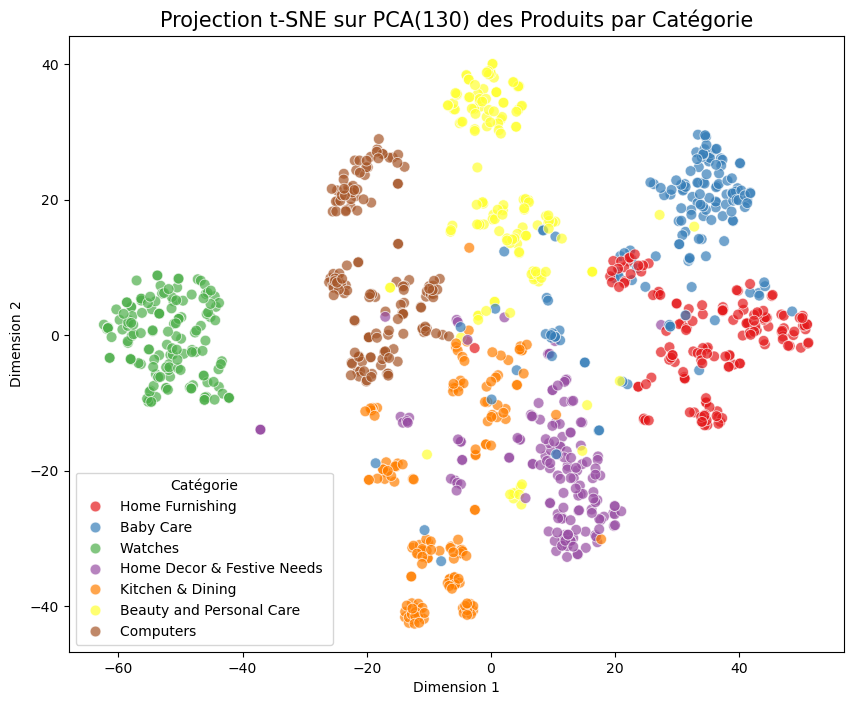

In [97]:
# 1. Applique PCA avec les meilleurs paramètres
pca = PCA(n_components=130, random_state=42)
X_pca = pca.fit_transform(X)

# 2. Applique t-SNE sur les données après PCA
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# 3. Crée un DataFrame pour la visualisation
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = df_use['niveau_categorie_1'].values

# 4. Visualisation
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=df_tsne, x='TSNE-1', y='TSNE-2',
    hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7
)
plt.title('Projection t-SNE sur PCA(130) des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Homogeneity Score: 0.690
Completeness Score: 0.713
V-Measure: 0.701
Adjusted Rand Index: 0.623
Silhouette Score: 0.103


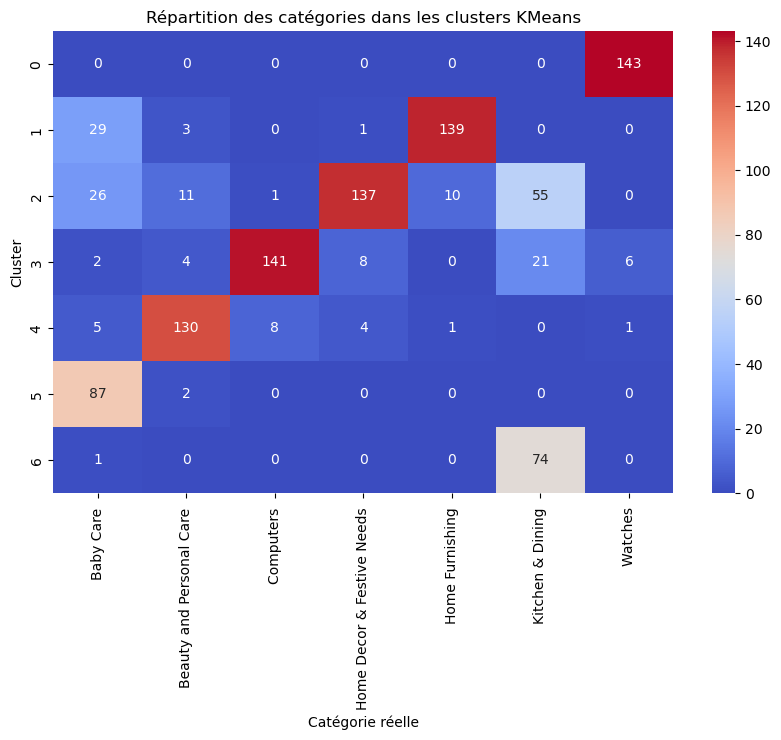

In [98]:
# KMeans avec les meilleurs paramètres
kmeans = KMeans(n_clusters=7, init='k-means++', max_iter=50, n_init=10, random_state=42)
labels_pred = kmeans.fit_predict(X_pca)

# Crosstab pour analyser la répartition
df_clusters = pd.DataFrame({
    'cluster': labels_pred,
    'categorie': df_use['niveau_categorie_1'].values
})

# Calcul des scores
homogeneity = homogeneity_score(df_clusters['categorie'], labels_pred)
completeness = completeness_score(df_clusters['categorie'], labels_pred)
v_measure = v_measure_score(df_clusters['categorie'], labels_pred)
ari = adjusted_rand_score(df_clusters['categorie'], labels_pred)
silhouette = silhouette_score(X_pca, labels_pred)

# Affichage des scores
print(f"Homogeneity Score: {homogeneity:.3f}")
print(f"Completeness Score: {completeness:.3f}")
print(f"V-Measure: {v_measure:.3f}")
print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Silhouette Score: {silhouette:.3f}")

contingency = pd.crosstab(df_clusters['cluster'], df_clusters['categorie'])

# Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency, annot=True, fmt="d", cmap="coolwarm")
plt.title("Répartition des catégories dans les clusters KMeans")
plt.xlabel("Catégorie réelle")
plt.ylabel("Cluster")
plt.show()

In [99]:
contingency.T

cluster,0,1,2,3,4,5,6
categorie,,,,,,,
Baby Care,0,29,26,2,5,87,1
Beauty and Personal Care,0,3,11,4,130,2,0
Computers,0,0,1,141,8,0,0
Home Decor & Festive Needs,0,1,137,8,4,0,0
Home Furnishing,0,139,10,0,1,0,0
Kitchen & Dining,0,0,55,21,0,0,74
Watches,143,0,0,6,1,0,0


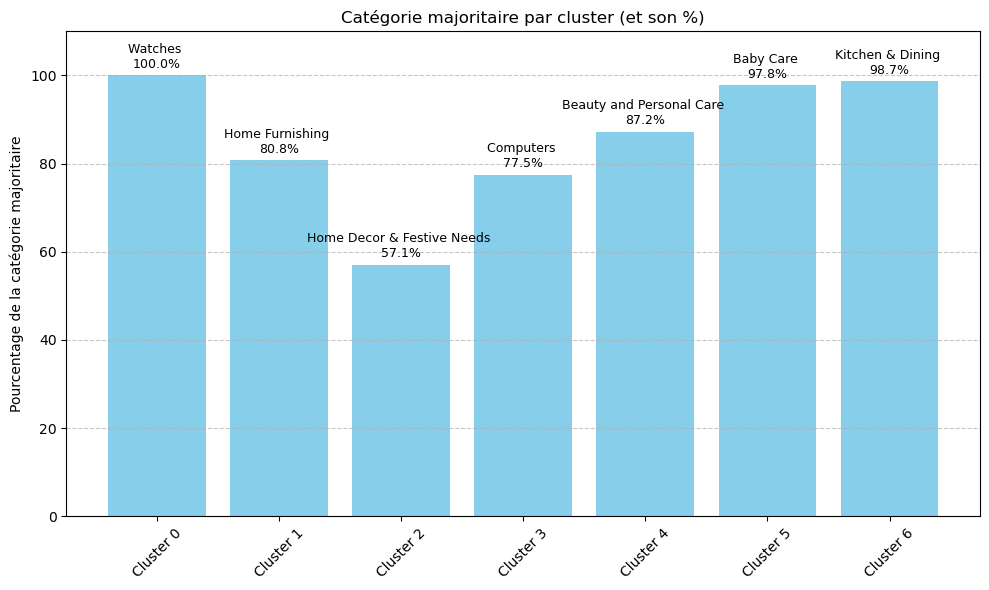

In [100]:
# Calcul : pour chaque cluster, trouver la catégorie majoritaire et son % dans ce cluster
major_categories = []
percentages = []

for i in contingency.index:
    total = contingency.loc[i].sum()
    max_cat = contingency.loc[i].idxmax()
    max_val = contingency.loc[i].max()
    percent = (max_val / total) * 100

    major_categories.append(f"{max_cat}")
    percentages.append(percent)

# Tracé du graphique
plt.figure(figsize=(10, 6))
bars = plt.bar([f"Cluster {i}" for i in contingency.index], percentages, color='skyblue')

# Ajout des annotations (noms de catégories au-dessus des barres)
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f"{major_categories[i]}\n{percentages[i]:.1f}%", 
             ha='center', va='bottom', fontsize=9)

plt.ylim(0, 110)
plt.ylabel("Pourcentage de la catégorie majoritaire")
plt.title("Catégorie majoritaire par cluster (et son %)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

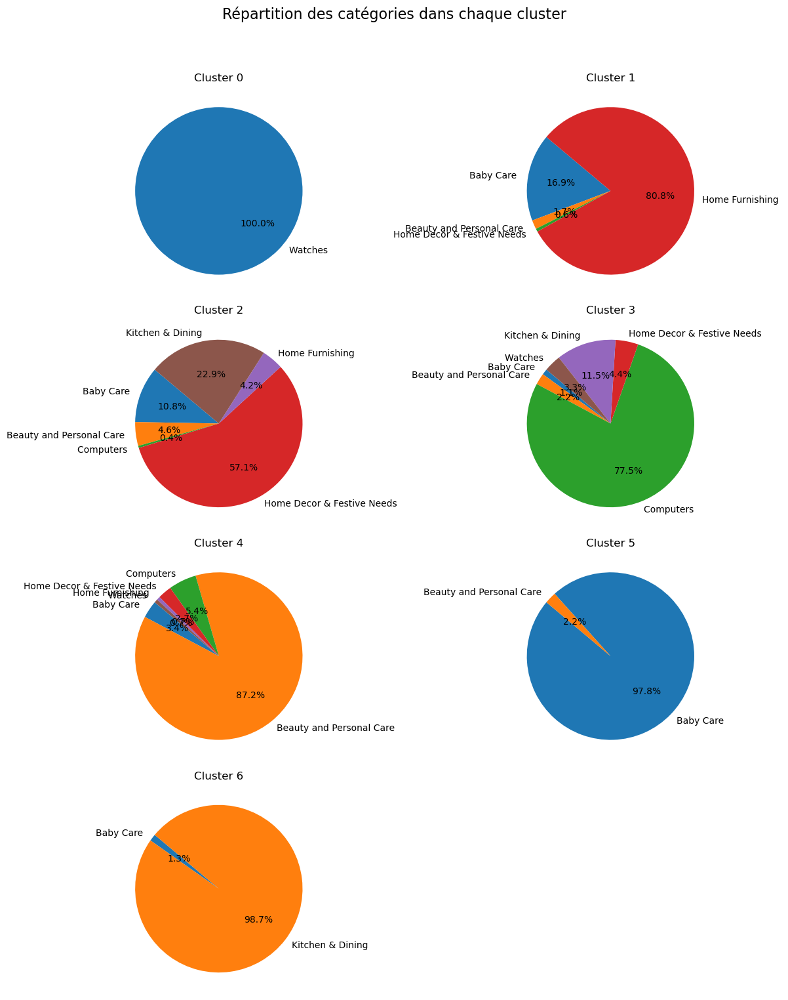

In [101]:
# On définit la grille de subplots (4 lignes x 2 colonnes pour 7 clusters + 1 vide)
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()  # On aplatit pour accéder facilement aux axes avec un index

# Boucle sur les 7 clusters
for i, cat in enumerate(contingency.index):
    cluster_counts = contingency.loc[cat]
    cluster_counts = cluster_counts[cluster_counts > 0]

    axs[i].pie(
        cluster_counts,
        labels=cluster_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 10}
    )
    axs[i].set_title(f"Cluster {cat}", fontsize=12)

# Supprimer le dernier subplot vide (le 8e)
for j in range(len(contingency.index), len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Répartition des catégories dans chaque cluster", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [102]:
# Ajouter les labels de clusters au DataFrame
df_use['cluster_pred'] = labels_pred

# Trouver la catégorie majoritaire de chaque cluster
majority_categories = (
    df_use.groupby('cluster_pred')['niveau_categorie_1']
    .agg(lambda x: x.value_counts().idxmax())
    .to_dict()
)

# Mapper la catégorie majoritaire à chaque cluster
df_use['cluster_majority_category'] = df_use['cluster_pred'].map(majority_categories)

# Identifier les éléments mal classés
mal_classes = df_use[df_use['niveau_categorie_1'] != df_use['cluster_majority_category']]

# Calculer le nombre d'éléments mal classés
nombre_mal_classes = len(mal_classes)

print(f"Nombre d'éléments mal classés : {nombre_mal_classes}")

Nombre d'éléments mal classés : 199


- Homogeneity (0.69) : Les clusters contiennent principalement des éléments d’une seule catégorie.

- Completeness (0.71) : Les éléments d’une même catégorie sont regroupés dans un même cluster.

- V-measure (0.70) : Moyenne harmonique des deux précédents, donc bon équilibre.

- ARI (0.62) : Indique une bonne concordance entre clustering et vraies étiquettes (0.6–0.7 est considéré comme “bon” dans beaucoup de contextes non triviaux).

- Silhouette (0.10) : Score faible, mais c’est courant pour des clusters sur des données textuelles de haute dimension, surtout avec des catégories qui peuvent se recouper sémantiquement.

Clusters bien alignés avec certaines catégories :
- Watches est quasi parfaitement isolé dans le cluster 0 (143/150).

- Computers est très bien regroupé dans le cluster 3 (141/150).

- Home Furnishing est très bien dans le cluster 1 (139/150).

- Home Decor & Festive Needs aussi, cluster 2 (137/150).

Catégories plus “diffuses” :

- Beauty and Personal Care et Baby Care sont plus réparties, surtout dans le cluster 4, mais aussi sur d’autres clusters.

- Kitchen & Dining est réparti entre clusters 2, 3 et 6.

Cela explique pourquoi la homogeneity et la completeness sont bonnes mais pas parfaites : certaines catégories sont bien séparées, d’autres sont plus mélangées, ce qui est typique quand certaines catégories sont sémantiquement proches ou que les descriptions se recoupent.

Conclusion : Les descriptions textuelles des produits permettent d’identifier des regroupements efficaces pour certaines catégories (ex. Watches, Computers), traduisant une forte spécificité sémantique.
Cependant, les catégories plus générales ou ambiguës (Baby Care, Beauty, Kitchen) souffrent d’un chevauchement significatif, suggérant la nécessité de traitements supplémentaires.